# CZ4046 Assignment 1 Part 2

## Experiment 1

### Import required libraries

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

### Define grid

In [2]:
class Grid:
    def __init__(self, width, height, start):
        self.width = width
        self.height = height
        self.i = start[0]
        self.j = start[1]
        
    def set(self, rewards, actions):  
        self.rewards = rewards
        self.actions = actions 
    
    def set_state(self, s):
        self.i = s[0]
        self.j = s[1]
        
    def current_state(self):
        return (self.i, self.j)

    def is_terminal(self, s):
        return s not in self.actions
    
    def move(self, action):
        if action in self.actions[(self.i, self.j)]:
            if action == 'U':
                self.i -= 1
            elif action == 'D':
                self.i += 1
            elif action == 'R':
                self.j += 1
            elif action == 'L':
                self.j -= 1
        
        else:
            pass
        
        return self.rewards.get((self.i, self.j), 0)
    
    def undo_move(self, action):
        if action == 'U':
            self.i += 1
        elif action == 'D':
            self.i -= 1
        elif action == 'R':
            self.j -= 1
        elif action == 'L':
            self.j += 1
            
        assert(self.current_state() in self.all_states())
    
    def end_game(self):
        return (self.i, self.j) not in self.actions
    
    def all_states(self):
        return set(list(self.actions.keys()) + list(self.rewards.keys()))

def stand_grid():    
    grid = Grid(5, 5, (3, 2))
    rewards = {(0,0):1, (0,2):1, (1,3):1, (2,4):1, (1,1):-1, (2,2):-1, (3,3):-1}
    actions = {
        (0,0): ('D'),
        (0,2): ('R', 'D'),
        (0,3): ('R', 'D', 'L'),
        (0,4): ('L'),
        (1,0): ('U', 'R', 'D'),
        (1,1): ('R', 'D', 'L'),
        (1,2): ('U', 'R', 'D', 'L'),
        (1,3): ('U', 'D', 'L'),
        (2,0): ('U', 'R', 'D'),
        (2,1): ('U', 'R', 'D', 'L'),
        (2,2): ('U', 'R', 'D', 'L'),
        (2,3): ('U', 'R', 'D', 'L'),
        (2,4): ('D', 'L'),
        (3,0): ('U', 'R', 'D'),
        (3,1): ('U', 'R', 'L'),
        (3,2): ('U', 'R', 'L'),
        (3,3): ('U', 'R', 'L'),
        (3,4): ('U', 'D', 'L'),
        (4,0): ('U'),
        (4,4): ('U'),          
    }
    grid.set(rewards, actions)
    return grid

def negative_grid(step_cost=-0.04):
    grid = stand_grid()
    grid.rewards.update({
        (0,3): step_cost,
        (0,4): step_cost,
        (1,0): step_cost,
        (1,2): step_cost,
        (2,0): step_cost,
        (2,1): step_cost,
        (2,3): step_cost,
        (3,0): step_cost,
        (3,1): step_cost,
        (3,2): step_cost,
        (3,4): step_cost,
        (4,0): step_cost,   
        (4,4): step_cost
    })
    return grid

def start_game(agent, env):
    pass

### Print utility values

In [3]:
hist = []

def print_values(f, V, g):
    for i in range(g.width):
        
        if f == True:
            print("+----------+------------+------------+------------+------------+")
        
        for j in range(g.height):
            v = V.get((i,j), 0)
            
            if f == True:
                print(f' {v:^9.5f} |', end = ' ')
                    
            hist.append(v)
        
        if f == True:        
            print ("")
    if f == True:
        print("+----------+------------+------------+------------+------------+")

### Print policy

In [4]:
def print_policy(P, g):
    for i in range(g.width):
        print("+------+--------+--------+--------+--------+")
        
        for j in range(g.height):
            a = P.get((i,j), ' ')
            print('   {}   |'.format(a), end = ' ')

        print ("")
    print("+------+--------+--------+--------+--------+")

### Value Iteration

In [5]:
SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')

In [6]:
if __name__ == '__main__':
    grid = negative_grid()

    policy = {}
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
    
    hist = []
    
    V = {}
    states = grid.all_states()
    
    for s in states:
        
        if s in grid.actions:
            V[s] = 0
        
        else:
            V[s] = 0

    iter_no = 0
    
    while True:
        iter_no = iter_no + 1
        print("Iteration " + str(iter_no) + " :: ")
        biggest_change = 0
        
        for s in states: 
            old_v = V[s]
            
            if s in policy: 
                new_v = float('-inf')
                
                for a in ALL_POSSIBLE_ACTIONS:
                    grid.set_state(s)
                    r = grid.rewards.get(grid.current_state(), 0)
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    grid.set_state(s)
                    
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]  
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    if v > new_v:
                        new_v = v
                
                V[s] = new_v
                biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                
                print('Utilities:')
                print_values(True, V, grid)
                print('\n')
                                
        if biggest_change < SMALL_ENOUGH:
            break
               
    for s in policy.keys():
        best_a = None
        best_value = float('-inf')
        
        for a in ALL_POSSIBLE_ACTIONS:
            
            grid.set_state(s)
            r = grid.rewards.get(grid.current_state(), 0)    
            _ = grid.move(a)
            v_correct = V[grid.current_state()]      
            grid.set_state(s)
            
            if a == 'U':
                r_clockwise = grid.move('R')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('L')
                
            elif a == 'R':
                r_clockwise = grid.move('D')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('U')
                
            elif a == 'D':
                r_clockwise = grid.move('L')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('R')
                
            elif a == 'L':
                r_clockwise = grid.move('U')
                v_clockwise = V[grid.current_state()]
                grid.set_state(s)
                r_anticlockwise = grid.move('D')
                        
            v_anticlockwise = V[grid.current_state()] 
            v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
            
            if v > best_value:
                best_value = v
                best_a = a
        
        policy[s] = best_a
        
    print('Optimal Utilities:')
    print_values(True, V, grid)
    print('\n')
    print('Optimal Policy:')
    print_policy(policy, grid)
    print('\n')

Iteration 1 :: 
Utilities:
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   0.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   1.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   0.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   0.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   0.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   0.00000  |   0.00000  | 
+----------+------------+------------+------------+------------+
  0.00000  |   0.00000  |   0.00000  |   1.0

+----------+------------+------------+------------+------------+
  1.34482  |   0.33866  |   0.43889  |   1.70081  |   1.56536  | 
+----------+------------+------------+------------+------------+
  0.36737  |   0.29021  |   0.25879  |  -0.44183  |   1.15167  | 
+----------+------------+------------+------------+------------+
  0.24304  |   0.00000  |   0.00000  |   0.00000  |  -0.07960  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  1.99000  |   0.00000  |   1.97525  |   1.80145  |   1.51227  | 
+----------+------------+------------+------------+------------+
  1.64046  |   0.33501  |   1.68453  |   1.94746  |   0.00000  | 
+----------+------------+------------+------------+------------+
  1.34482  |   0.33866  |   0.43889  |   1.70081  |   2.61603  | 
+----------+------------+------------+------------+------------+
  0.36737  |   0.29021  |   0.25879  |  -0.44183  |   1.15167  | 
+----

  1.95678  |   1.03757  |   1.09835  |   1.41671  |   2.19409  | 
+----------+------------+------------+------------+------------+
  1.68234  |   0.00000  |   0.00000  |   0.00000  |   0.85636  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  2.97010  |   0.00000  |   3.89041  |   3.69198  |   2.43861  | 
+----------+------------+------------+------------+------------+
  2.59402  |   1.20498  |   3.53887  |   3.82192  |   0.00000  | 
+----------+------------+------------+------------+------------+
  2.25521  |   1.96814  |   1.34019  |   2.63984  |   3.59223  | 
+----------+------------+------------+------------+------------+
  1.95678  |   1.03757  |   1.09835  |   1.41671  |   2.19409  | 
+----------+------------+------------+------------+------------+
  1.68234  |   0.00000  |   0.00000  |   0.00000  |   1.86728  | 
+----------+------------+------------+------------+------------+


Uti

  4.90100  |   0.00000  |   5.76278  |   5.54205  |   4.28739  | 
+----------+------------+------------+------------+------------+
  4.49295  |   3.03225  |   4.46622  |   5.65993  |   0.00000  | 
+----------+------------+------------+------------+------------+
  4.11941  |   3.80134  |   3.17573  |   4.48367  |   5.50126  | 
+----------+------------+------------+------------+------------+
  3.78501  |   2.81393  |   2.89538  |   2.33476  |   4.11078  | 
+----------+------------+------------+------------+------------+
  2.56398  |   0.00000  |   0.00000  |   0.00000  |   2.83443  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  4.90100  |   0.00000  |   5.76278  |   5.54205  |   4.28739  | 
+----------+------------+------------+------------+------------+
  4.49295  |   3.03225  |   4.46622  |   5.65993  |   0.00000  | 
+----------+------------+------------+------------+------------+
  4.1

  5.96101  |   5.61802  |   4.98474  |   6.29016  |   7.35666  | 
+----------+------------+------------+------------+------------+
  5.60388  |   4.62247  |   4.68669  |   4.14540  |   5.96670  | 
+----------+------------+------------+------------+------------+
  4.36725  |   0.00000  |   0.00000  |   0.00000  |   4.70363  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  6.79347  |   0.00000  |   7.59355  |   7.35146  |   6.09906  | 
+----------+------------+------------+------------+------------+
  6.35724  |   4.84114  |   6.29330  |   7.46102  |   0.00000  | 
+----------+------------+------------+------------+------------+
  5.96101  |   5.61802  |   4.98474  |   6.29016  |   7.35666  | 
+----------+------------+------------+------------+------------+
  5.60388  |   4.62247  |   4.68669  |   4.14540  |   5.96670  | 
+----------+------------+------------+------------+------------+
  4.3

  6.15058  |   0.00000  |   0.00000  |   0.00000  |   6.51778  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  8.64828  |   0.00000  |   9.38372  |   8.24118  |   7.87103  | 
+----------+------------+------------+------------+------------+
  8.18431  |   6.61223  |   8.08081  |   9.22500  |   0.00000  | 
+----------+------------+------------+------------+------------+
  7.76676  |   7.39948  |   6.75554  |   8.05842  |   9.16236  | 
+----------+------------+------------+------------+------------+
  7.38843  |   6.39987  |   6.44230  |   5.91787  |   7.77286  | 
+----------+------------+------------+------------+------------+
  6.15058  |   0.00000  |   0.00000  |   0.00000  |   6.51778  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
  8.64828  |   0.00000  |   9.38372  |   9.12106  |   7.87

  9.97467  |   8.34485  |   9.82905  |  10.95193  |   0.00000  | 
+----------+------------+------------+------------+------------+
  9.53627  |   8.27665  |   8.48790  |   9.78873  |  10.92146  | 
+----------+------------+------------+------------+------------+
  9.13719  |   8.14142  |   8.16017  |   7.65166  |   9.53235  | 
+----------+------------+------------+------------+------------+
  7.89950  |   0.00000  |   0.00000  |   0.00000  |   8.28386  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 10.46617  |   0.00000  |  11.13424  |   9.99119  |   9.60401  | 
+----------+------------+------------+------------+------------+
  9.97467  |   8.34485  |   9.82905  |  10.95193  |   0.00000  | 
+----------+------------+------------+------------+------------+
  9.53627  |   9.14487  |   8.48790  |   9.78873  |  10.92146  | 
+----------+------------+------------+------------+------------+
  9.1

 10.85070  |   9.84742  |   9.84083  |   9.34738  |  11.24775  | 
+----------+------------+------------+------------+------------+
  9.61329  |   0.00000  |   0.00000  |   0.00000  |  10.00484  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 12.24790  |   0.00000  |  12.84604  |  11.70266  |  11.29882  | 
+----------+------------+------------+------------+------------+
 11.72904  |  10.03967  |  11.53884  |  12.64210  |   0.00000  | 
+----------+------------+------------+------------+------------+
 11.27017  |  10.00422  |  10.18252  |  11.48158  |  12.63654  | 
+----------+------------+------------+------------+------------+
 10.85070  |   9.84742  |   9.84083  |   9.34738  |  11.24775  | 
+----------+------------+------------+------------+------------+
  9.61329  |   0.00000  |   0.00000  |   0.00000  |  10.00484  | 
+----------+------------+------------+------------+------------+


Uti

 13.99416  |   0.00000  |  13.68770  |  13.37641  |  12.95629  | 
+----------+------------+------------+------------+------------+
 13.44813  |  11.69751  |  13.21098  |  14.29591  |   0.00000  | 
+----------+------------+------------+------------+------------+
 12.96917  |  11.69668  |  11.84017  |  13.13755  |  14.30975  | 
+----------+------------+------------+------------+------------+
 12.52967  |  11.51854  |  11.48502  |  11.00574  |  12.92122  | 
+----------+------------+------------+------------+------------+
 11.29254  |   0.00000  |   0.00000  |   0.00000  |  11.68311  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 13.99416  |   0.00000  |  14.52000  |  13.37641  |  12.95629  | 
+----------+------------+------------+------------+------------+
 13.44813  |  11.69751  |  13.21098  |  14.29591  |   0.00000  | 
+----------+------------+------------+------------+------------+
 12.9

 14.63397  |  13.35474  |  13.46163  |  14.75729  |  15.94289  | 
+----------+------------+------------+------------+------------+
 13.35641  |  13.15550  |  13.09352  |  12.62752  |  14.55459  | 
+----------+------------+------------+------------+------------+
 12.93793  |   0.00000  |   0.00000  |   0.00000  |  13.32067  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 15.70568  |   0.00000  |  15.34306  |  15.01327  |  14.57722  | 
+----------+------------+------------+------------+------------+
 15.13267  |  13.31916  |  14.84630  |  15.91388  |   0.00000  | 
+----------+------------+------------+------------+------------+
 14.63397  |  13.35474  |  13.46163  |  14.75729  |  15.94289  | 
+----------+------------+------------+------------+------------+
 14.17478  |  13.15550  |  13.09352  |  12.62752  |  14.55459  | 
+----------+------------+------------+------------+------------+
 12.9

 14.55014  |   0.00000  |   0.00000  |   0.00000  |  14.91924  | 
+----------+------------+------------+------------+------------+


Iteration 20 :: 
Utilities:
+----------+------------+------------+------------+------------+
 17.38314  |   0.00000  |  16.96187  |  16.61404  |  16.16242  | 
+----------+------------+------------+------------+------------+
 16.78334  |  14.90539  |  16.44560  |  17.49661  |   0.00000  | 
+----------+------------+------------+------------+------------+
 16.26526  |  14.97910  |  15.04767  |  16.34148  |  17.53755  | 
+----------+------------+------------+------------+------------+
 14.98486  |  14.75899  |  14.66707  |  14.21349  |  16.14945  | 
+----------+------------+------------+------------+------------+
 14.55014  |   0.00000  |   0.00000  |   0.00000  |  14.91924  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 17.38314  |   0.00000  |  16.96187  |  1

 18.40082  |  16.45699  |  18.00966  |  18.27495  |   0.00000  | 
+----------+------------+------------+------------+------------+
 17.86371  |  16.57044  |  16.59905  |  17.89084  |  19.09510  | 
+----------+------------+------------+------------+------------+
 16.58046  |  16.32969  |  16.20642  |  15.76442  |  17.70717  | 
+----------+------------+------------+------------+------------+
 16.12984  |   0.00000  |   0.00000  |   0.00000  |  16.48030  | 
+----------+------------+------------+------------+------------+


Iteration 22 :: 
Utilities:
+----------+------------+------------+------------+------------+
 19.02721  |   0.00000  |  18.54493  |  18.17951  |  17.71267  | 
+----------+------------+------------+------------+------------+
 18.40082  |  16.45699  |  18.00966  |  19.04473  |   0.00000  | 
+----------+------------+------------+------------+------------+
 17.86371  |  16.57044  |  16.59905  |  17.89084  |  19.09510  | 
+----------+------------+------------+------------+--

 18.14390  |  17.86827  |  17.71231  |  17.28108  |  19.22900  | 
+----------+------------+------------+------------+------------+
 17.67769  |   0.00000  |   0.00000  |   0.00000  |  18.00516  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 20.63857  |   0.00000  |  20.09304  |  19.71046  |  19.22872  | 
+----------+------------+------------+------------+------------+
 19.98578  |  17.97469  |  19.53926  |  19.80602  |   0.00000  | 
+----------+------------+------------+------------+------------+
 19.42998  |  18.12943  |  18.11653  |  19.40608  |  20.61677  | 
+----------+------------+------------+------------+------------+
 18.14390  |  17.86827  |  17.71231  |  17.28108  |  19.22900  | 
+----------+------------+------------+------------+------------+
 17.67769  |   0.00000  |   0.00000  |   0.00000  |  18.00516  | 
+----------+------------+------------+------------+------------+


Ite

 22.21786  |   0.00000  |  21.60698  |  21.20763  |  20.71132  | 
+----------+------------+------------+------------+------------+
 21.53887  |  19.45925  |  21.03516  |  21.30347  |   0.00000  | 
+----------+------------+------------+------------+------------+
 20.96473  |  19.65673  |  19.60082  |  20.88792  |  21.36451  | 
+----------+------------+------------+------------+------------+
 19.67580  |  19.37539  |  19.18546  |  18.76424  |  20.71605  | 
+----------+------------+------------+------------+------------+
 19.19433  |   0.00000  |   0.00000  |   0.00000  |  19.49500  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 22.21786  |   0.00000  |  21.60698  |  21.20763  |  20.71132  | 
+----------+------------+------------+------------+------------+
 21.53887  |  19.45925  |  21.03516  |  21.30347  |   0.00000  | 
+----------+------------+------------+------------+------------+
 20.9

 22.46858  |  21.15298  |  21.05266  |  22.33708  |  22.83441  | 
+----------+------------+------------+------------+------------+
 21.17682  |  20.85170  |  20.62657  |  20.21462  |  21.44686  | 
+----------+------------+------------+------------+------------+
 20.68039  |   0.00000  |   0.00000  |   0.00000  |  20.95088  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 23.76573  |   0.00000  |  23.08751  |  22.67177  |  22.16123  | 
+----------+------------+------------+------------+------------+
 23.06075  |  20.91137  |  22.49808  |  22.76800  |   0.00000  | 
+----------+------------+------------+------------+------------+
 22.46858  |  21.15298  |  21.05266  |  22.33708  |  22.83441  | 
+----------+------------+------------+------------+------------+
 21.17682  |  20.85170  |  20.62657  |  20.21462  |  22.16934  | 
+----------+------------+------------+------------+------------+
 20.6

 22.13648  |   0.00000  |   0.00000  |   0.00000  |  22.37378  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 25.28279  |   0.00000  |  24.53537  |  24.10362  |  23.57914  | 
+----------+------------+------------+------------+------------+
 24.55202  |  22.33177  |  23.92876  |  24.20029  |   0.00000  | 
+----------+------------+------------+------------+------------+
 23.20912  |  22.61882  |  22.47275  |  23.75427  |  24.27105  | 
+----------+------------+------------+------------+------------+
 22.64757  |  21.57849  |  22.03636  |  21.63298  |  22.88363  | 
+----------+------------+------------+------------+------------+
 22.13648  |   0.00000  |   0.00000  |   0.00000  |  22.37378  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 25.28279  |   0.00000  |  24.53537  |  24.10362  |  23.57

+----------+------------+------------+------------+------------+
 25.28638  |  23.03029  |  24.63223  |  25.60103  |   0.00000  | 
+----------+------------+------------+------------+------------+
 24.66780  |  24.05486  |  23.17111  |  24.45109  |  25.67532  | 
+----------+------------+------------+------------+------------+
 24.08867  |  23.00974  |  22.72971  |  22.33037  |  24.28802  | 
+----------+------------+------------+------------+------------+
 22.85348  |   0.00000  |   0.00000  |   0.00000  |  23.07314  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 26.02996  |   0.00000  |  25.95127  |  25.50387  |  24.27633  | 
+----------+------------+------------+------------+------------+
 25.28638  |  23.03029  |  24.63223  |  25.60103  |   0.00000  | 
+----------+------------+------------+------------+------------+
 24.66780  |  24.05486  |  23.17111  |  24.45109  |  25.67532  | 
+----

 24.79828  |  23.71436  |  24.09377  |  23.70202  |  24.97835  | 
+----------+------------+------------+------------+------------+
 24.26576  |   0.00000  |   0.00000  |   0.00000  |  24.44825  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 27.50197  |   0.00000  |  26.64747  |  26.19236  |  25.64758  | 
+----------+------------+------------+------------+------------+
 26.73291  |  24.40439  |  26.01587  |  26.28977  |   0.00000  | 
+----------+------------+------------+------------+------------+
 25.38609  |  24.76190  |  24.54488  |  25.82164  |  26.36559  | 
+----------+------------+------------+------------+------------+
 24.79828  |  23.71436  |  24.09377  |  23.70202  |  24.97835  | 
+----------+------------+------------+------------+------------+
 24.26576  |   0.00000  |   0.00000  |   0.00000  |  24.44825  | 
+----------+------------+------------+------------+------------+


Uti

 25.65099  |   0.00000  |   0.00000  |   0.00000  |  25.79253  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 28.22695  |   0.00000  |  28.01677  |  27.54653  |  26.32181  | 
+----------+------------+------------+------------+------------+
 27.44811  |  25.10921  |  27.37189  |  27.64445  |   0.00000  | 
+----------+------------+------------+------------+------------+
 26.80323  |  26.15906  |  25.89134  |  26.49553  |  27.72290  | 
+----------+------------+------------+------------+------------+
 26.19782  |  25.10194  |  24.76463  |  25.04340  |  26.33578  | 
+----------+------------+------------+------------+------------+
 25.65099  |   0.00000  |   0.00000  |   0.00000  |  25.79253  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 28.22695  |   0.00000  |  28.01677  |  27.54653  |  26.98

 26.88968  |  26.47155  |  26.08993  |  25.70338  |  27.66295  | 
+----------+------------+------------+------------+------------+
 26.33552  |   0.00000  |   0.00000  |   0.00000  |  26.45336  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 29.65523  |   0.00000  |  28.69005  |  28.21237  |  27.64794  | 
+----------+------------+------------+------------+------------+
 28.85943  |  26.51444  |  28.04090  |  28.96934  |   0.00000  | 
+----------+------------+------------+------------+------------+
 28.19786  |  26.85173  |  26.55577  |  27.82162  |  29.04998  | 
+----------+------------+------------+------------+------------+
 27.57547  |  26.47155  |  26.08993  |  25.70338  |  27.66295  | 
+----------+------------+------------+------------+------------+
 26.33552  |   0.00000  |   0.00000  |   0.00000  |  26.45336  | 
+----------+------------+------------+------------+------------+


Uti

 28.25472  |  27.14786  |  26.74281  |  27.00200  |  28.31548  | 
+----------+------------+------------+------------+------------+
 27.68655  |   0.00000  |   0.00000  |   0.00000  |  27.75301  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 30.35868  |   0.00000  |  30.01428  |  29.52198  |  28.94481  | 
+----------+------------+------------+------------+------------+
 29.55474  |  27.89455  |  29.35735  |  29.62083  |   0.00000  | 
+----------+------------+------------+------------+------------+
 28.88524  |  28.21833  |  27.86354  |  28.47377  |  29.70243  | 
+----------+------------+------------+------------+------------+
 28.25472  |  27.14786  |  26.74281  |  27.00200  |  28.31548  | 
+----------+------------+------------+------------+------------+
 27.68655  |   0.00000  |   0.00000  |   0.00000  |  27.75301  | 
+----------+------------+------------+------------+------------+


Uti

 30.92461  |  28.57439  |  30.00481  |  30.26513  |   0.00000  | 
+----------+------------+------------+------------+------------+
 30.23959  |  28.89175  |  28.50684  |  29.75657  |  30.34762  | 
+----------+------------+------------+------------+------------+
 28.92741  |  28.48487  |  28.02792  |  27.64064  |  28.96076  | 
+----------+------------+------------+------------+------------+
 28.35244  |   0.00000  |   0.00000  |   0.00000  |  28.39202  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 31.74454  |   0.00000  |  30.66540  |  30.16592  |  29.58248  | 
+----------+------------+------------+------------+------------+
 30.92461  |  28.57439  |  30.00481  |  30.26513  |   0.00000  | 
+----------+------------+------------+------------+------------+
 30.23959  |  28.89175  |  28.50684  |  29.75657  |  30.34762  | 
+----------+------------+------------+------------+------------+
 28.9

 30.25314  |  29.14441  |  28.66035  |  28.89693  |  30.22986  | 
+----------+------------+------------+------------+------------+
 29.66484  |   0.00000  |   0.00000  |   0.00000  |  29.64878  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 32.42710  |   0.00000  |  31.94605  |  31.43246  |  30.21309  | 
+----------+------------+------------+------------+------------+
 31.59929  |  29.24746  |  31.27849  |  31.53245  |   0.00000  | 
+----------+------------+------------+------------+------------+
 30.90666  |  30.21887  |  29.77258  |  30.38738  |  31.61655  | 
+----------+------------+------------+------------+------------+
 30.25314  |  29.14441  |  28.66035  |  28.89693  |  30.22986  | 
+----------+------------+------------+------------+------------+
 29.66484  |   0.00000  |   0.00000  |   0.00000  |  29.64878  | 
+----------+------------+------------+------------+------------+


Uti

 33.77180  |   0.00000  |  32.57575  |  32.05521  |  31.45339  | 
+----------+------------+------------+------------+------------+
 32.92849  |  30.57350  |  31.90487  |  32.15562  |   0.00000  | 
+----------+------------+------------+------------+------------+
 32.22089  |  30.87254  |  30.39515  |  31.62818  |  32.24046  | 
+----------+------------+------------+------------+------------+
 30.90613  |  30.44399  |  29.90486  |  29.51473  |  31.47093  | 
+----------+------------+------------+------------+------------+
 30.31130  |   0.00000  |   0.00000  |   0.00000  |  30.26672  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 33.77180  |   0.00000  |  32.57575  |  32.05521  |  31.45339  | 
+----------+------------+------------+------------+------------+
 32.92849  |  30.57350  |  31.90487  |  32.15562  |   0.00000  | 
+----------+------------+------------+------------+------------+
 32.2

 32.21219  |   0.00000  |   0.00000  |   0.00000  |  31.48208  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 35.08974  |   0.00000  |  34.42323  |  33.88236  |  32.66635  | 
+----------+------------+------------+------------+------------+
 34.23125  |  31.87316  |  33.74307  |  33.98411  |   0.00000  | 
+----------+------------+------------+------------+------------+
 33.50897  |  32.79460  |  31.62004  |  32.84173  |  34.07093  | 
+----------+------------+------------+------------+------------+
 32.82623  |  31.71775  |  31.12266  |  30.72997  |  32.68462  | 
+----------+------------+------------+------------+------------+
 32.21219  |   0.00000  |   0.00000  |   0.00000  |  31.48208  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 35.08974  |   0.00000  |  34.42323  |  33.88236  |  32.66

 35.50807  |  33.14695  |  34.34241  |  35.16965  |   0.00000  | 
+----------+------------+------------+------------+------------+
 34.77142  |  34.04416  |  32.81843  |  34.02862  |  35.25767  | 
+----------+------------+------------+------------+------------+
 34.07451  |  32.96617  |  32.31430  |  31.91857  |  33.87154  | 
+----------+------------+------------+------------+------------+
 33.44798  |   0.00000  |   0.00000  |   0.00000  |  32.67063  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 36.38145  |   0.00000  |  35.62100  |  35.06694  |  33.85257  | 
+----------+------------+------------+------------+------------+
 35.50807  |  33.14695  |  34.93517  |  35.16965  |   0.00000  | 
+----------+------------+------------+------------+------------+
 34.77142  |  34.04416  |  32.81843  |  34.02862  |  35.25767  | 
+----------+------------+------------+------------+------------+
 34.0

 35.29795  |  34.18975  |  33.48034  |  33.08111  |  35.03232  | 
+----------+------------+------------+------------+------------+
 34.05663  |   0.00000  |   0.00000  |   0.00000  |  33.83299  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 37.64746  |   0.00000  |  36.79234  |  36.22541  |  35.01262  | 
+----------+------------+------------+------------+------------+
 36.75949  |  34.39540  |  35.52143  |  36.32911  |   0.00000  | 
+----------+------------+------------+------------+------------+
 36.00874  |  35.26885  |  33.99089  |  35.18944  |  36.41826  | 
+----------+------------+------------+------------+------------+
 35.29795  |  34.18975  |  33.48034  |  33.08111  |  35.03232  | 
+----------+------------+------------+------------+------------+
 34.65919  |   0.00000  |   0.00000  |   0.00000  |  33.83299  | 
+----------+------------+------------+------------+------------+


Uti

 38.88828  |   0.00000  |  37.93786  |  37.35833  |  36.14710  | 
+----------+------------+------------+------------+------------+
 37.98600  |  35.61900  |  36.67473  |  37.46305  |   0.00000  | 
+----------+------------+------------+------------+------------+
 37.22144  |  36.46917  |  35.13798  |  36.32476  |  37.55330  | 
+----------+------------+------------+------------+------------+
 36.49704  |  35.38898  |  34.62133  |  34.21816  |  36.16754  | 
+----------+------------+------------+------------+------------+
 35.25572  |   0.00000  |   0.00000  |   0.00000  |  34.96975  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 38.88828  |   0.00000  |  37.93786  |  37.35833  |  36.14710  | 
+----------+------------+------------+------------+------------+
 37.98600  |  35.61900  |  36.67473  |  37.46305  |   0.00000  | 
+----------+------------+------------+------------+------------+
 37.2

 38.41001  |  37.64560  |  36.26026  |  37.43514  |  38.66334  | 
+----------+------------+------------+------------+------------+
 37.67227  |  36.56434  |  35.73781  |  35.33029  |  37.27778  | 
+----------+------------+------------+------------+------------+
 36.43095  |   0.00000  |   0.00000  |   0.00000  |  36.08148  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 40.10440  |   0.00000  |  39.05811  |  38.46628  |  37.25657  | 
+----------+------------+------------+------------+------------+
 39.18811  |  36.81826  |  37.80286  |  38.57204  |   0.00000  | 
+----------+------------+------------+------------+------------+
 38.41001  |  37.64560  |  36.26026  |  37.43514  |  38.66334  | 
+----------+------------+------------+------------+------------+
 37.67227  |  36.56434  |  35.73781  |  35.33029  |  37.27778  | 
+----------+------------+------------+------------+------------+
 36.4

 41.29632  |   0.00000  |  40.15366  |  39.01106  |  38.34157  | 
+----------+------------+------------+------------+------------+
 40.36629  |  37.99365  |  38.90638  |  39.65663  |   0.00000  | 
+----------+------------+------------+------------+------------+
 39.57492  |  38.22501  |  37.35826  |  38.52112  |  39.74896  | 
+----------+------------+------------+------------+------------+
 38.82411  |  37.71632  |  36.83031  |  36.41803  |  38.36360  | 
+----------+------------+------------+------------+------------+
 37.58279  |   0.00000  |   0.00000  |   0.00000  |  37.16875  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 41.29632  |   0.00000  |  40.15366  |  39.01106  |  38.34157  | 
+----------+------------+------------+------------+------------+
 40.36629  |  37.99365  |  38.90638  |  39.65663  |   0.00000  | 
+----------+------------+------------+------------+------------+
 39.5

 40.94656  |  38.57254  |  39.98582  |  40.18994  |   0.00000  | 
+----------+------------+------------+------------+------------+
 40.14866  |  39.36650  |  38.43251  |  39.05513  |  40.28278  | 
+----------+------------+------------+------------+------------+
 39.39141  |  38.28368  |  37.36773  |  37.48192  |  38.89751  | 
+----------+------------+------------+------------+------------+
 38.71172  |   0.00000  |   0.00000  |   0.00000  |  38.23210  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 41.88336  |   0.00000  |  40.69234  |  40.08257  |  39.40266  | 
+----------+------------+------------+------------+------------+
 40.94656  |  38.57254  |  39.98582  |  40.18994  |   0.00000  | 
+----------+------------+------------+------------+------------+
 40.14866  |  39.36650  |  38.43251  |  39.05513  |  40.28278  | 
+----------+------------+------------+------------+------------+
 39.3

 40.71666  |  39.92870  |  38.96089  |  40.10553  |  40.81070  | 
+----------+------------+------------+------------+------------+
 39.95303  |  38.84537  |  38.42522  |  38.00509  |  39.42553  | 
+----------+------------+------------+------------+------------+
 39.26772  |   0.00000  |   0.00000  |   0.00000  |  38.75497  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 43.03988  |   0.00000  |  41.22505  |  40.60943  |  39.92440  | 
+----------+------------+------------+------------+------------+
 42.08976  |  39.71302  |  40.51668  |  40.71735  |   0.00000  | 
+----------+------------+------------+------------+------------+
 40.71666  |  39.92870  |  38.96089  |  40.10553  |  40.81070  | 
+----------+------------+------------+------------+------------+
 39.95303  |  39.40144  |  38.42522  |  38.00509  |  39.42553  | 
+----------+------------+------------+------------+------------+
 39.2

+----------+------------+------------+------------+------------+
 39.81817  |   0.00000  |   0.00000  |   0.00000  |  39.27207  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 43.60948  |   0.00000  |  42.27282  |  41.13045  |  40.44035  | 
+----------+------------+------------+------------+------------+
 42.65279  |  40.27472  |  41.04171  |  41.75472  |   0.00000  | 
+----------+------------+------------+------------+------------+
 41.83567  |  40.48528  |  39.48352  |  40.62204  |  41.84909  | 
+----------+------------+------------+------------+------------+
 41.05949  |  39.95195  |  38.94542  |  38.52250  |  40.46411  | 
+----------+------------+------------+------------+------------+
 39.81817  |   0.00000  |   0.00000  |   0.00000  |  39.27207  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 42.38680  |  41.58179  |  40.00047  |  41.13285  |  42.35969  | 
+----------+------------+------------+------------+------------+
 41.60443  |  40.49695  |  39.46000  |  39.03420  |  40.97481  | 
+----------+------------+------------+------------+------------+
 40.90261  |   0.00000  |   0.00000  |   0.00000  |  39.78345  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 44.17339  |   0.00000  |  42.78800  |  42.15524  |  40.95059  | 
+----------+------------+------------+------------+------------+
 43.21020  |  40.83080  |  42.07456  |  42.26482  |   0.00000  | 
+----------+------------+------------+------------+------------+
 42.38680  |  41.58179  |  40.00047  |  41.13285  |  42.35969  | 
+----------+------------+------------+------------+------------+
 41.60443  |  40.49695  |  39.46000  |  39.54026  |  40.97481  | 
+----

 43.76203  |  41.92634  |  42.58251  |  42.76927  |   0.00000  | 
+----------+------------+------------+------------+------------+
 42.93242  |  42.12184  |  41.01757  |  42.13760  |  42.86465  | 
+----------+------------+------------+------------+------------+
 42.14393  |  41.03651  |  40.47859  |  40.04075  |  41.47987  | 
+----------+------------+------------+------------+------------+
 41.43671  |   0.00000  |   0.00000  |   0.00000  |  40.78931  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 45.28434  |   0.00000  |  43.29748  |  42.65913  |  41.95415  | 
+----------+------------+------------+------------+------------+
 44.30834  |  41.92634  |  42.58251  |  42.76927  |   0.00000  | 
+----------+------------+------------+------------+------------+
 42.93242  |  42.12184  |  41.01757  |  42.13760  |  42.86465  | 
+----------+------------+------------+------------+------------+
 42.1

 45.83149  |   0.00000  |  44.29955  |  43.65022  |  42.44761  | 
+----------+------------+------------+------------+------------+
 44.84919  |  42.46591  |  43.08489  |  43.76148  |   0.00000  | 
+----------+------------+------------+------------+------------+
 44.00734  |  43.18579  |  41.51785  |  42.63167  |  43.85788  | 
+----------+------------+------------+------------+------------+
 43.20679  |  42.09949  |  41.00162  |  40.53631  |  42.47336  | 
+----------+------------+------------+------------+------------+
 42.48894  |   0.00000  |   0.00000  |   0.00000  |  41.28392  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 45.83149  |   0.00000  |  44.29955  |  43.65022  |  42.44761  | 
+----------+------------+------------+------------+------------+
 44.84919  |  42.46591  |  43.58176  |  43.76148  |   0.00000  | 
+----------+------------+------------+------------+------------+
 44.0

 43.73026  |  42.62302  |  41.52121  |  41.51511  |  42.96211  | 
+----------+------------+------------+------------+------------+
 43.00717  |   0.00000  |   0.00000  |   0.00000  |  42.25706  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 46.37318  |   0.00000  |  44.79227  |  44.13754  |  42.93560  | 
+----------+------------+------------+------------+------------+
 45.38463  |  43.00008  |  44.07318  |  44.24937  |   0.00000  | 
+----------+------------+------------+------------+------------+
 44.53675  |  43.70979  |  42.50213  |  43.12028  |  44.34628  | 
+----------+------------+------------+------------+------------+
 43.73026  |  42.62302  |  41.52121  |  41.51511  |  42.96211  | 
+----------+------------+------------+------------+------------+
 43.00717  |   0.00000  |   0.00000  |   0.00000  |  42.25706  | 
+----------+------------+------------+------------+------------+


Uti

 43.52023  |   0.00000  |   0.00000  |   0.00000  |  42.73573  | 
+----------+------------+------------+------------+------------+


Iteration 65 :: 
Utilities:
+----------+------------+------------+------------+------------+
 47.44035  |   0.00000  |  45.27953  |  44.61946  |  43.89541  | 
+----------+------------+------------+------------+------------+
 46.43951  |  44.05245  |  44.55920  |  45.20902  |   0.00000  | 
+----------+------------+------------+------------+------------+
 45.57974  |  44.22856  |  42.98626  |  44.08138  |  45.30695  | 
+----------+------------+------------+------------+------------+
 44.24849  |  43.65442  |  42.54510  |  41.99661  |  43.92356  | 
+----------+------------+------------+------------+------------+
 43.52023  |   0.00000  |   0.00000  |   0.00000  |  42.73573  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 47.44035  |   0.00000  |  45.27953  |  4

 47.96595  |   0.00000  |  45.76139  |  45.09604  |  44.36735  | 
+----------+------------+------------+------------+------------+
 46.95905  |  44.57075  |  45.03991  |  45.68090  |   0.00000  | 
+----------+------------+------------+------------+------------+
 46.09343  |  44.74214  |  43.46513  |  44.55398  |  45.77933  | 
+----------+------------+------------+------------+------------+
 45.26947  |  44.16240  |  43.04932  |  42.47285  |  44.39635  | 
+----------+------------+------------+------------+------------+
 44.02815  |   0.00000  |   0.00000  |   0.00000  |  43.20913  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 47.96595  |   0.00000  |  46.23790  |  45.09604  |  44.36735  | 
+----------+------------+------------+------------+------------+
 46.95905  |  44.57075  |  45.03991  |  45.68090  |   0.00000  | 
+----------+------------+------------+------------+------------+
 46.0

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 48.48629  |   0.00000  |  46.70914  |  46.03341  |  44.83407  | 
+----------+------------+------------+------------+------------+
 47.47339  |  45.08388  |  45.98555  |  46.14755  |   0.00000  | 
+----------+------------+------------+------------+------------+
 46.60198  |  45.75394  |  44.40731  |  45.02137  |  46.24650  | 
+----------+------------+------------+------------+------------+
 45.77231  |  44.66530  |  43.54845  |  43.40974  |  44.86391  | 
+----------+------------+------------+------------+------------+
 45.02881  |   0.00000  |   0.00000  |   0.00000  |  44.14033  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 48.48629  |   0.00000  |  46.70914  |  46.03341  |  45.29561  | 
+----------+------------+------------+------------+-------

 45.52164  |   0.00000  |   0.00000  |   0.00000  |  44.59823  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 49.51141  |   0.00000  |  47.17515  |  46.49432  |  45.75203  | 
+----------+------------+------------+------------+------------+
 48.48670  |  46.09478  |  46.45061  |  47.06543  |   0.00000  | 
+----------+------------+------------+------------+------------+
 47.60388  |  46.25226  |  44.87073  |  45.94071  |  47.16541  | 
+----------+------------+------------+------------+------------+
 46.76296  |  45.65607  |  44.53165  |  43.87052  |  45.78363  | 
+----------+------------+------------+------------+------------+
 45.52164  |   0.00000  |   0.00000  |   0.00000  |  44.59823  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 49.51141  |   0.00000  |  47.63600  |  46.49432  |  45.75

 48.98576  |  47.08557  |  47.36549  |  47.51677  |   0.00000  | 
+----------+------------+------------+------------+------------+
 48.09732  |  47.23401  |  45.78252  |  46.39278  |  47.61727  | 
+----------+------------+------------+------------+------------+
 47.25087  |  46.14403  |  45.01582  |  44.77700  |  46.23588  | 
+----------+------------+------------+------------+------------+
 46.49258  |   0.00000  |   0.00000  |   0.00000  |  45.49893  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 50.01630  |   0.00000  |  48.09174  |  47.40088  |  46.64977  | 
+----------+------------+------------+------------+------------+
 48.98576  |  47.08557  |  47.36549  |  47.51677  |   0.00000  | 
+----------+------------+------------+------------+------------+
 48.09732  |  47.23401  |  45.78252  |  46.39278  |  47.61727  | 
+----------+------------+------------+------------+------------+
 47.2

 47.73390  |  47.10537  |  45.96956  |  45.22282  |  46.68315  | 
+----------+------------+------------+------------+------------+
 46.97078  |   0.00000  |   0.00000  |   0.00000  |  45.94184  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 51.01097  |   0.00000  |  48.54242  |  47.84664  |  47.09119  | 
+----------+------------+------------+------------+------------+
 49.96898  |  47.57354  |  47.81542  |  47.96311  |   0.00000  | 
+----------+------------+------------+------------+------------+
 49.06946  |  47.71754  |  46.23099  |  47.28200  |  48.06413  | 
+----------+------------+------------+------------+------------+
 47.73390  |  47.10537  |  45.96956  |  45.22282  |  47.12548  | 
+----------+------------+------------+------------+------------+
 46.97078  |   0.00000  |   0.00000  |   0.00000  |  45.94184  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 51.98585  |   0.00000  |  49.42887  |  48.72339  |  47.95941  | 
+----------+------------+------------+------------+------------+
 50.93262  |  48.53490  |  48.70054  |  48.84105  |   0.00000  | 
+----------+------------+------------+------------+------------+
 50.02225  |  48.67013  |  47.11337  |  48.15170  |  48.94311  | 
+----------+------------+------------+------------+------------+
 48.68552  |  48.04758  |  46.90415  |  46.09987  |  47.56293  | 
+----------+------------+------------+------------+------------+
 47.91288  |   0.00000  |   0.00000  |   0.00000  |  46.81306  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 51.98585  |   0.00000  |  49.42887  |  48.72339  |  47.95941  | 
+----------+------------+------------+------------+------------+
 50.93262  |  48.53490  |  48.70054  |  48.84105  |   0.00000  | 
+----

 52.46600  |   0.00000  |  50.29578  |  49.58082  |  48.38632  | 
+----------+------------+------------+------------+------------+
 51.40723  |  49.00838  |  49.56635  |  49.69966  |   0.00000  | 
+----------+------------+------------+------------+------------+
 50.49152  |  49.60376  |  47.54738  |  48.57936  |  49.80277  | 
+----------+------------+------------+------------+------------+
 49.61820  |  48.51163  |  47.36439  |  46.53122  |  48.42341  | 
+----------+------------+------------+------------+------------+
 48.83624  |   0.00000  |   0.00000  |   0.00000  |  47.24147  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 52.46600  |   0.00000  |  50.29578  |  49.58082  |  48.38632  | 
+----------+------------+------------+------------+------------+
 51.40723  |  49.00838  |  49.56635  |  49.69966  |   0.00000  | 
+----------+------------+------------+------------+------------+
 50.4

 52.94134  |   0.00000  |  50.72204  |  50.00242  |  49.22600  | 
+----------+------------+------------+------------+------------+
 51.87709  |  49.47713  |  49.99215  |  50.12186  |   0.00000  | 
+----------+------------+------------+------------+------------+
 50.95609  |  50.06359  |  48.40131  |  49.00230  |  50.22550  | 
+----------+------------+------------+------------+------------+
 50.07756  |  48.97104  |  47.81998  |  47.37981  |  48.84654  | 
+----------+------------+------------+------------+------------+
 49.29100  |   0.00000  |   0.00000  |   0.00000  |  48.08416  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 52.94134  |   0.00000  |  50.72204  |  50.00242  |  49.22600  | 
+----------+------------+------------+------------+------------+
 51.87709  |  49.94119  |  49.99215  |  50.12186  |   0.00000  | 
+----------+------------+------------+------------+------------+
 50.9

 49.74121  |   0.00000  |   0.00000  |   0.00000  |  48.49854  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 53.87780  |   0.00000  |  51.14357  |  50.41935  |  49.63887  | 
+----------+------------+------------+------------+------------+
 52.80276  |  50.40060  |  50.41329  |  50.53939  |   0.00000  | 
+----------+------------+------------+------------+------------+
 51.41601  |  50.51882  |  48.82132  |  49.83422  |  50.64355  | 
+----------+------------+------------+------------+------------+
 50.53232  |  49.87612  |  48.71741  |  47.79715  |  49.26500  | 
+----------+------------+------------+------------+------------+
 49.74121  |   0.00000  |   0.00000  |   0.00000  |  48.49854  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 53.87780  |   0.00000  |  51.14357  |  50.41935  |  49.63

 53.71002  |  51.30570  |  51.64939  |  51.76460  |   0.00000  | 
+----------+------------+------------+------------+------------+
 52.76837  |  51.85737  |  49.66092  |  50.64918  |  51.87036  | 
+----------+------------+------------+------------+------------+
 51.86950  |  50.76319  |  49.59814  |  49.02316  |  50.49289  | 
+----------+------------+------------+------------+------------+
 51.06503  |   0.00000  |   0.00000  |   0.00000  |  49.71448  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 54.79563  |   0.00000  |  52.38060  |  51.64283  |  50.45095  | 
+----------+------------+------------+------------+------------+
 53.71002  |  51.30570  |  51.64939  |  51.76460  |   0.00000  | 
+----------+------------+------------+------------+------------+
 52.76837  |  51.85737  |  50.09454  |  50.64918  |  51.87036  | 
+----------+------------+------------+------------+------------+
 51.8

 51.92565  |   0.00000  |   0.00000  |   0.00000  |  50.11105  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 55.69520  |   0.00000  |  53.18414  |  52.43745  |  51.24577  | 
+----------+------------+------------+------------+------------+
 54.59921  |  52.19279  |  52.45236  |  52.55998  |   0.00000  | 
+----------+------------+------------+------------+------------+
 53.64756  |  52.72758  |  50.52398  |  51.45084  |  52.66678  | 
+----------+------------+------------+------------+------------+
 52.73882  |  51.63261  |  50.46571  |  49.82287  |  51.28988  | 
+----------+------------+------------+------------+------------+
 51.92565  |   0.00000  |   0.00000  |   0.00000  |  50.11105  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 55.69520  |   0.00000  |  53.18414  |  52.43745  |  51.24

+----------+------------+------------+------------+------------+
 56.57687  |   0.00000  |  53.57985  |  52.82875  |  52.02452  | 
+----------+------------+------------+------------+------------+
 55.03716  |  53.06223  |  52.84778  |  52.95151  |   0.00000  | 
+----------+------------+------------+------------+------------+
 54.08057  |  53.15617  |  51.37003  |  52.23605  |  53.05880  | 
+----------+------------+------------+------------+------------+
 53.16697  |  52.06080  |  51.31621  |  50.21658  |  51.68225  | 
+----------+------------+------------+------------+------------+
 52.34952  |   0.00000  |   0.00000  |   0.00000  |  50.89205  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 56.57687  |   0.00000  |  53.57985  |  52.82875  |  52.02452  | 
+----------+------------+------------+------------+------------+
 55.47072  |  53.06223  |  52.84778  |  52.95151  |   0.00000  | 
+----

 54.93364  |  54.00053  |  52.19924  |  52.62261  |  53.83070  | 
+----------+------------+------------+------------+------------+
 54.01047  |  52.90440  |  52.14978  |  50.99191  |  52.45484  | 
+----------+------------+------------+------------+------------+
 53.18458  |   0.00000  |   0.00000  |   0.00000  |  51.65698  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 57.44099  |   0.00000  |  54.35936  |  53.59954  |  52.78762  | 
+----------+------------+------------+------------+------------+
 55.89994  |  53.91436  |  53.62670  |  53.72253  |   0.00000  | 
+----------+------------+------------+------------+------------+
 54.93364  |  54.00053  |  52.19924  |  53.00521  |  53.83070  | 
+----------+------------+------------+------------+------------+
 54.01047  |  52.90440  |  52.14978  |  50.99191  |  52.45484  | 
+----------+------------+------------+------------+------------+
 53.1

 54.00303  |   0.00000  |   0.00000  |   0.00000  |  52.40616  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 58.28791  |   0.00000  |  55.12324  |  54.35484  |  53.53539  | 
+----------+------------+------------+------------+------------+
 56.74556  |  54.74954  |  54.38998  |  54.47781  |   0.00000  | 
+----------+------------+------------+------------+------------+
 55.76973  |  54.82809  |  53.01193  |  53.38389  |  54.58671  | 
+----------+------------+------------+------------+------------+
 54.83718  |  53.73121  |  52.96677  |  51.75145  |  53.21152  | 
+----------+------------+------------+------------+------------+
 54.00303  |   0.00000  |   0.00000  |   0.00000  |  52.40616  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 58.28791  |   0.00000  |  55.12324  |  54.35484  |  53.53

 57.57435  |  55.56809  |  55.13794  |  55.21773  |   0.00000  | 
+----------+------------+------------+------------+------------+
 56.58919  |  55.63918  |  53.80843  |  54.12967  |  55.32719  | 
+----------+------------+------------+------------+------------+
 55.64744  |  54.54156  |  53.76750  |  52.49556  |  53.95266  | 
+----------+------------+------------+------------+------------+
 54.80519  |   0.00000  |   0.00000  |   0.00000  |  53.13995  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 59.11798  |   0.00000  |  55.87180  |  55.09497  |  54.26813  | 
+----------+------------+------------+------------+------------+
 57.57435  |  55.56809  |  55.13794  |  55.21773  |   0.00000  | 
+----------+------------+------------+------------+------------+
 56.58919  |  55.63918  |  53.80843  |  54.12967  |  55.32719  | 
+----------+------------+------------+------------+------------+
 55.6

 56.44158  |  55.33579  |  54.16186  |  53.22458  |  54.67861  | 
+----------+------------+------------+------------+------------+
 55.59138  |   0.00000  |   0.00000  |   0.00000  |  53.85869  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 59.52680  |   0.00000  |  56.60534  |  55.82024  |  54.98616  | 
+----------+------------+------------+------------+------------+
 58.38665  |  56.37036  |  55.87090  |  55.94262  |   0.00000  | 
+----------+------------+------------+------------+------------+
 57.39234  |  56.43413  |  54.58908  |  54.86032  |  56.05249  | 
+----------+------------+------------+------------+------------+
 56.44158  |  55.33579  |  54.55229  |  53.22458  |  54.67861  | 
+----------+------------+------------+------------+------------+
 55.59138  |   0.00000  |   0.00000  |   0.00000  |  53.85869  | 
+----------+------------+------------+------------+------------+


Uti

 60.33222  |   0.00000  |  57.32418  |  56.53094  |  55.68978  | 
+----------+------------+------------+------------+------------+
 59.18279  |  57.15666  |  56.58916  |  56.65285  |   0.00000  | 
+----------+------------+------------+------------+------------+
 58.17951  |  57.21326  |  55.35417  |  55.57617  |  56.76296  | 
+----------+------------+------------+------------+------------+
 57.21992  |  56.11421  |  54.93881  |  53.93885  |  55.38970  | 
+----------+------------+------------+------------+------------+
 56.36193  |   0.00000  |   0.00000  |   0.00000  |  54.56273  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 60.33222  |   0.00000  |  57.32418  |  56.53094  |  55.68978  | 
+----------+------------+------------+------------+------------+
 59.18279  |  57.15666  |  56.58916  |  56.65285  |   0.00000  | 
+----------+------------+------------+------------+------------+
 58.1

 58.95101  |  57.59699  |  55.73099  |  56.27755  |  57.45892  | 
+----------+------------+------------+------------+------------+
 57.98276  |  56.87714  |  55.70029  |  54.29055  |  56.08629  | 
+----------+------------+------------+------------+------------+
 56.74144  |   0.00000  |   0.00000  |   0.00000  |  54.90933  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 61.12161  |   0.00000  |  58.02859  |  56.88093  |  56.03627  | 
+----------+------------+------------+------------+------------+
 59.96308  |  57.54393  |  56.94287  |  57.34871  |   0.00000  | 
+----------+------------+------------+------------+------------+
 58.95101  |  57.59699  |  55.73099  |  56.27755  |  57.45892  | 
+----------+------------+------------+------------+------------+
 57.98276  |  56.87714  |  55.70029  |  54.29055  |  56.08629  | 
+----------+------------+------------+------------+------------+
 56.7

 57.48911  |   0.00000  |   0.00000  |   0.00000  |  55.59193  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 61.89529  |   0.00000  |  58.37548  |  57.57034  |  56.71880  | 
+----------+------------+------------+------------+------------+
 60.34738  |  58.30687  |  57.63963  |  57.69136  |   0.00000  | 
+----------+------------+------------+------------+------------+
 59.33099  |  58.35298  |  56.47334  |  56.96477  |  57.80157  | 
+----------+------------+------------+------------+------------+
 58.35847  |  57.25290  |  56.44661  |  54.98330  |  56.42924  | 
+----------+------------+------------+------------+------------+
 57.48911  |   0.00000  |   0.00000  |   0.00000  |  55.59193  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 61.89529  |   0.00000  |  58.37548  |  57.57034  |  56.71

 57.85734  |   0.00000  |   0.00000  |   0.00000  |  55.92800  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 61.89529  |   0.00000  |  58.71888  |  57.90984  |  57.05492  | 
+----------+------------+------------+------------+------------+
 60.72784  |  58.30687  |  57.98276  |  58.03053  |   0.00000  | 
+----------+------------+------------+------------+------------+
 59.70716  |  58.72532  |  56.83896  |  56.96477  |  58.14071  | 
+----------+------------+------------+------------+------------+
 58.73042  |  57.62489  |  56.44661  |  55.32441  |  56.76868  | 
+----------+------------+------------+------------+------------+
 57.85734  |   0.00000  |   0.00000  |   0.00000  |  55.92800  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 61.89529  |   0.00000  |  58.71888  |  57.90984  |  57.05

 62.65357  |   0.00000  |  59.05881  |  58.24592  |  57.38764  | 
+----------+------------+------------+------------+------------+
 61.47738  |  59.05464  |  58.32242  |  58.36627  |   0.00000  | 
+----------+------------+------------+------------+------------+
 60.07958  |  59.09393  |  57.20092  |  57.63814  |  58.47639  | 
+----------+------------+------------+------------+------------+
 59.09866  |  58.35776  |  57.17808  |  55.66207  |  57.10466  | 
+----------+------------+------------+------------+------------+
 58.22189  |   0.00000  |   0.00000  |   0.00000  |  56.26063  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 62.65357  |   0.00000  |  59.05881  |  58.24592  |  57.38764  | 
+----------+------------+------------+------------+------------+
 61.47738  |  59.05464  |  58.32242  |  58.36627  |   0.00000  | 
+----------+------------+------------+------------+------------+
 60.4

 60.81327  |  59.82013  |  57.91400  |  58.29794  |  59.13750  | 
+----------+------------+------------+------------+------------+
 59.82412  |  58.71871  |  57.89500  |  56.32718  |  57.76636  | 
+----------+------------+------------+------------+------------+
 58.94009  |   0.00000  |   0.00000  |   0.00000  |  56.91575  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 63.39677  |   0.00000  |  59.72844  |  58.90794  |  58.04305  | 
+----------+------------+------------+------------+------------+
 62.21201  |  59.78752  |  58.99153  |  59.02758  |   0.00000  | 
+----------+------------+------------+------------+------------+
 60.81327  |  59.82013  |  57.91400  |  58.29794  |  59.13750  | 
+----------+------------+------------+------------+------------+
 59.82412  |  59.07605  |  57.89500  |  56.32718  |  57.76636  | 
+----------+------------+------------+------------+------------+
 58.9


Utilities:
+----------+------------+------------+------------+------------+
 63.76280  |   0.00000  |  60.38464  |  59.55668  |  58.68532  | 
+----------+------------+------------+------------+------------+
 62.57382  |  60.14848  |  59.64722  |  59.67558  |   0.00000  | 
+----------+------------+------------+------------+------------+
 61.53236  |  60.53188  |  58.61288  |  58.62285  |  59.78520  | 
+----------+------------+------------+------------+------------+
 60.53514  |  59.42981  |  58.24809  |  56.97890  |  58.41464  | 
+----------+------------+------------+------------+------------+
 59.64401  |   0.00000  |   0.00000  |   0.00000  |  57.55758  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 63.76280  |   0.00000  |  60.38464  |  59.55668  |  58.68532  | 
+----------+------------+------------+------------+------------+
 62.57382  |  60.50582  |  59.64722  |  59.67558  |   0.000

 63.28663  |  60.85960  |  59.97012  |  59.99467  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.23714  |  60.88242  |  58.95709  |  59.26284  |  60.41979  | 
+----------+------------+------------+------------+------------+
 60.88533  |  60.12676  |  58.94371  |  57.29983  |  59.04979  | 
+----------+------------+------------+------------+------------+
 59.99069  |   0.00000  |   0.00000  |   0.00000  |  57.87360  | 
+----------+------------+------------+------------+------------+


Iteration 104 :: 
Utilities:
+----------+------------+------------+------------+------------+
 64.48392  |   0.00000  |  60.70779  |  59.87615  |  59.00161  | 
+----------+------------+------------+------------+------------+
 63.28663  |  60.85960  |  59.97012  |  60.31054  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.23714  |  60.88242  |  58.95709  |  59.26284  |  60.41979  | 
+----------+------------+------------+------------+-

 64.83908  |   0.00000  |  61.34435  |  60.50547  |  59.62465  | 
+----------+------------+------------+------------+------------+
 63.63770  |  61.20983  |  60.60620  |  60.62322  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.58425  |  61.57303  |  59.63520  |  59.57799  |  60.73225  | 
+----------+------------+------------+------------+------------+
 61.57523  |  60.47002  |  59.28631  |  57.93201  |  59.36254  | 
+----------+------------+------------+------------+------------+
 60.67370  |   0.00000  |   0.00000  |   0.00000  |  58.49604  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 64.83908  |   0.00000  |  61.34435  |  60.50547  |  59.62465  | 
+----------+------------+------------+------------+------------+
 63.63770  |  61.55656  |  60.60620  |  60.62322  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.5

+----------+------------+------------+------------+------------+
 63.98526  |  61.55656  |  60.60620  |  60.93274  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.92790  |  61.91317  |  59.63520  |  59.88997  |  61.04154  | 
+----------+------------+------------+------------+------------+
 61.91502  |  60.80984  |  59.62548  |  57.93201  |  59.67210  | 
+----------+------------+------------+------------+------------+
 61.01008  |   0.00000  |   0.00000  |   0.00000  |  58.49604  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 65.19069  |   0.00000  |  61.65783  |  60.81538  |  59.62465  | 
+----------+------------+------------+------------+------------+
 63.98526  |  61.55656  |  60.91944  |  60.93274  |   0.00000  | 
+----------+------------+------------+------------+------------+
 62.92790  |  61.91317  |  59.63520  |  59.88997  |  61.04154  | 
+----

 64.32934  |  61.89983  |  61.22953  |  61.23913  |   0.00000  | 
+----------+------------+------------+------------+------------+
 63.26810  |  62.24990  |  59.96918  |  60.19879  |  61.34769  | 
+----------+------------+------------+------------+------------+
 62.25140  |  61.14627  |  59.96127  |  58.55148  |  59.97853  | 
+----------+------------+------------+------------+------------+
 61.34311  |   0.00000  |   0.00000  |   0.00000  |  58.80252  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 65.53878  |   0.00000  |  61.96815  |  61.12217  |  59.93146  | 
+----------+------------+------------+------------+------------+
 64.32934  |  61.89983  |  61.22953  |  61.23913  |   0.00000  | 
+----------+------------+------------+------------+------------+
 63.26810  |  62.24990  |  59.96918  |  60.19879  |  61.34769  | 
+----------+------------+------------+------------+------------+
 62.2

 65.00721  |  62.57609  |  61.84038  |  61.84267  |   0.00000  | 
+----------+------------+------------+------------+------------+
 63.93834  |  62.91330  |  60.62714  |  60.80712  |  61.95071  | 
+----------+------------+------------+------------+------------+
 62.91412  |  61.80906  |  60.62279  |  58.85654  |  60.58209  | 
+----------+------------+------------+------------+------------+
 61.99920  |   0.00000  |   0.00000  |   0.00000  |  59.40619  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 66.22456  |   0.00000  |  62.57945  |  61.72651  |  60.53586  | 
+----------+------------+------------+------------+------------+
 65.00721  |  62.57609  |  61.84038  |  61.84267  |   0.00000  | 
+----------+------------+------------+------------+------------+
 63.93834  |  62.91330  |  60.62714  |  60.80712  |  61.95071  | 
+----------+------------+------------+------------+------------+
 62.9

 63.56365  |  62.45867  |  61.27115  |  59.45745  |  61.17347  | 
+----------+------------+------------+------------+------------+
 62.64223  |   0.00000  |   0.00000  |   0.00000  |  59.99767  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 66.89669  |   0.00000  |  63.17849  |  62.31883  |  61.12813  | 
+----------+------------+------------+------------+------------+
 65.67160  |  63.23890  |  62.43910  |  62.43514  |   0.00000  | 
+----------+------------+------------+------------+------------+
 64.59524  |  63.56349  |  61.27199  |  61.40323  |  62.54157  | 
+----------+------------+------------+------------+------------+
 63.56365  |  62.45867  |  61.27115  |  59.45745  |  61.17347  | 
+----------+------------+------------+------------+------------+
 62.64223  |   0.00000  |   0.00000  |   0.00000  |  59.99767  | 
+----------+------------+------------+------------+------------+


Uti

 62.95894  |   0.00000  |   0.00000  |   0.00000  |  60.57724  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 67.55545  |   0.00000  |  63.47351  |  62.61079  |  61.70888  | 
+----------+------------+------------+------------+------------+
 65.99881  |  63.88852  |  62.73420  |  62.72939  |   0.00000  | 
+----------+------------+------------+------------+------------+
 64.91878  |  63.88372  |  61.90405  |  61.99061  |  62.83261  | 
+----------+------------+------------+------------+------------+
 63.88355  |  62.77861  |  61.90661  |  60.04697  |  61.46469  | 
+----------+------------+------------+------------+------------+
 62.95894  |   0.00000  |   0.00000  |   0.00000  |  60.57724  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 67.55545  |   0.00000  |  63.47351  |  62.61079  |  61.70

 63.27247  |   0.00000  |   0.00000  |   0.00000  |  60.86273  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 67.87989  |   0.00000  |  63.76558  |  62.89989  |  61.99507  | 
+----------+------------+------------+------------+------------+
 66.64347  |  64.20846  |  63.02638  |  63.02102  |   0.00000  | 
+----------+------------+------------+------------+------------+
 65.55617  |  64.20075  |  62.21536  |  62.28094  |  63.12092  | 
+----------+------------+------------+------------+------------+
 64.20026  |  63.40892  |  62.21959  |  60.33887  |  61.75308  | 
+----------+------------+------------+------------+------------+
 63.27247  |   0.00000  |   0.00000  |   0.00000  |  60.86273  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 67.87989  |   0.00000  |  63.76558  |  62.89989  |  61.99

 66.64347  |  64.20846  |  63.31566  |  63.30980  |   0.00000  | 
+----------+------------+------------+------------+------------+
 65.55617  |  64.51461  |  62.52356  |  62.28094  |  63.40656  | 
+----------+------------+------------+------------+------------+
 64.51379  |  63.40892  |  62.21959  |  60.62809  |  62.03887  | 
+----------+------------+------------+------------+------------+
 63.58287  |   0.00000  |   0.00000  |   0.00000  |  61.14561  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 67.87989  |   0.00000  |  64.05474  |  63.18612  |  62.27843  | 
+----------+------------+------------+------------+------------+
 66.64347  |  64.52521  |  63.31566  |  63.30980  |   0.00000  | 
+----------+------------+------------+------------+------------+
 65.55617  |  64.51461  |  62.52356  |  62.28094  |  63.40656  | 
+----------+------------+------------+------------+------------+
 64.5

 65.87009  |  64.82532  |  62.52356  |  62.56844  |  63.68952  | 
+----------+------------+------------+------------+------------+
 64.82419  |  63.71935  |  62.52943  |  60.62809  |  62.32202  | 
+----------+------------+------------+------------+------------+
 63.58287  |   0.00000  |   0.00000  |   0.00000  |  61.14561  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 68.20109  |   0.00000  |  64.34103  |  63.46949  |  62.27843  | 
+----------+------------+------------+------------+------------+
 66.96096  |  64.52521  |  63.31566  |  63.59571  |   0.00000  | 
+----------+------------+------------+------------+------------+
 65.87009  |  64.82532  |  62.52356  |  62.56844  |  63.68952  | 
+----------+------------+------------+------------+------------+
 64.82419  |  63.71935  |  62.52943  |  60.62809  |  62.32202  | 
+----------+------------+------------+------------+------------+
 63.8

 64.19439  |   0.00000  |   0.00000  |   0.00000  |  61.70351  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 68.83389  |   0.00000  |  64.91142  |  64.03687  |  62.83939  | 
+----------+------------+------------+------------+------------+
 67.58647  |  65.14923  |  63.93060  |  64.19636  |   0.00000  | 
+----------+------------+------------+------------+------------+
 66.48855  |  65.43747  |  63.13522  |  63.14889  |  64.24886  | 
+----------+------------+------------+------------+------------+
 65.43571  |  64.33094  |  63.14032  |  61.19827  |  62.88039  | 
+----------+------------+------------+------------+------------+
 64.19439  |   0.00000  |   0.00000  |   0.00000  |  61.70351  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 68.83389  |   0.00000  |  64.91142  |  64.03687  |  62.83

 67.89454  |  65.45657  |  64.53616  |  64.49461  |   0.00000  | 
+----------+------------+------------+------------+------------+
 66.79315  |  65.73896  |  63.43661  |  63.44438  |  64.52673  | 
+----------+------------+------------+------------+------------+
 65.73689  |  64.63216  |  63.44122  |  61.48997  |  63.15777  | 
+----------+------------+------------+------------+------------+
 64.79374  |   0.00000  |   0.00000  |   0.00000  |  61.97856  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 69.14555  |   0.00000  |  65.19532  |  64.31931  |  63.11940  | 
+----------+------------+------------+------------+------------+
 67.89454  |  65.45657  |  64.53616  |  64.49461  |   0.00000  | 
+----------+------------+------------+------------+------------+
 66.79315  |  65.73896  |  63.43661  |  63.44438  |  64.52673  | 
+----------+------------+------------+------------+------------+
 65.7

 67.09470  |  66.03743  |  64.03045  |  64.02845  |  64.80335  | 
+----------+------------+------------+------------+------------+
 66.03506  |  65.22558  |  64.03403  |  62.07037  |  63.43413  | 
+----------+------------+------------+------------+------------+
 65.08893  |   0.00000  |   0.00000  |   0.00000  |  62.52587  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 69.75956  |   0.00000  |  65.47811  |  64.60051  |  63.67652  | 
+----------+------------+------------+------------+------------+
 68.50147  |  66.06205  |  64.83468  |  64.79028  |   0.00000  | 
+----------+------------+------------+------------+------------+
 67.39324  |  66.03743  |  64.03045  |  64.02845  |  64.80335  | 
+----------+------------+------------+------------+------------+
 66.03506  |  65.22558  |  64.03403  |  62.07037  |  63.43413  | 
+----------+------------+------------+------------+------------+
 65.0

+----------+------------+------------+------------+------------+
 65.67048  |   0.00000  |   0.00000  |   0.00000  |  63.06835  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 70.36134  |   0.00000  |  66.03974  |  65.15863  |  64.22836  | 
+----------+------------+------------+------------+------------+
 68.80038  |  66.65549  |  65.42323  |  65.37376  |   0.00000  | 
+----------+------------+------------+------------+------------+
 67.68879  |  66.62546  |  64.61254  |  64.60255  |  65.35239  | 
+----------+------------+------------+------------+------------+
 66.62249  |  65.51785  |  64.61505  |  62.64144  |  63.98281  | 
+----------+------------+------------+------------+------------+
 65.67048  |   0.00000  |   0.00000  |   0.00000  |  63.06835  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 67.98139  |  66.91507  |  64.89924  |  64.60255  |  65.62463  | 
+----------+------------+------------+------------+------------+
 66.91180  |  65.80720  |  64.61505  |  62.92334  |  64.25489  | 
+----------+------------+------------+------------+------------+
 65.95690  |   0.00000  |   0.00000  |   0.00000  |  63.33741  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 70.36134  |   0.00000  |  66.31831  |  65.43530  |  64.50197  | 
+----------+------------+------------+------------+------------+
 69.09631  |  66.94777  |  65.71330  |  65.66156  |   0.00000  | 
+----------+------------+------------+------------+------------+
 67.98139  |  66.91507  |  64.89924  |  64.60255  |  65.62463  | 
+----------+------------+------------+------------+------------+
 66.91180  |  65.80720  |  64.90122  |  62.92334  |  64.25489  | 
+----

 70.95115  |   0.00000  |  66.59523  |  65.71024  |  64.77390  | 
+----------+------------+------------+------------+------------+
 69.67933  |  67.23712  |  66.00058  |  65.94673  |   0.00000  | 
+----------+------------+------------+------------+------------+
 68.55784  |  67.20178  |  65.18309  |  65.16656  |  66.16415  | 
+----------+------------+------------+------------+------------+
 67.19822  |  66.37724  |  65.18452  |  63.20280  |  64.79412  | 
+----------+------------+------------+------------+------------+
 66.24046  |   0.00000  |   0.00000  |   0.00000  |  63.60489  | 
+----------+------------+------------+------------+------------+


Iteration 124 :: 
Utilities:
+----------+------------+------------+------------+------------+
 70.95115  |   0.00000  |  66.59523  |  65.71024  |  64.77390  | 
+----------+------------+------------+------------+------------+
 69.67933  |  67.23712  |  66.00058  |  66.22926  |   0.00000  | 
+----------+------------+------------+------------+-

 67.07423  |   0.00000  |   0.00000  |   0.00000  |  64.13481  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 71.52922  |   0.00000  |  67.41520  |  66.52391  |  65.31238  | 
+----------+------------+------------+------------+------------+
 70.25073  |  67.80717  |  66.84588  |  66.78648  |   0.00000  | 
+----------+------------+------------+------------+------------+
 69.12281  |  68.04483  |  65.74233  |  65.72046  |  66.69660  | 
+----------+------------+------------+------------+------------+
 68.04041  |  66.93594  |  65.74265  |  64.02643  |  65.32631  | 
+----------+------------+------------+------------+------------+
 67.07423  |   0.00000  |   0.00000  |   0.00000  |  64.39713  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 71.52922  |   0.00000  |  67.41520  |  66.52391  |  65.31

 72.09579  |   0.00000  |  67.68469  |  66.79120  |  65.84323  | 
+----------+------------+------------+------------+------------+
 70.53216  |  68.36588  |  67.12218  |  67.06117  |   0.00000  | 
+----------+------------+------------+------------+------------+
 69.40107  |  68.32025  |  66.29047  |  66.26425  |  66.96004  | 
+----------+------------+------------+------------+------------+
 68.31555  |  67.21110  |  66.28969  |  64.29605  |  65.58963  | 
+----------+------------+------------+------------+------------+
 67.34661  |   0.00000  |   0.00000  |   0.00000  |  64.65762  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 72.09579  |   0.00000  |  67.68469  |  66.79120  |  65.84323  | 
+----------+------------+------------+------------+------------+
 70.81077  |  68.36588  |  67.12218  |  67.06117  |   0.00000  | 
+----------+------------+------------+------------+------------+
 69.4

 69.94926  |  68.86285  |  66.82773  |  66.53236  |  67.48111  | 
+----------+------------+------------+------------+------------+
 68.85759  |  67.75321  |  66.82584  |  64.82792  |  66.11049  | 
+----------+------------+------------+------------+------------+
 67.88323  |   0.00000  |   0.00000  |   0.00000  |  65.17292  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 72.65108  |   0.00000  |  68.21755  |  67.31956  |  66.36601  | 
+----------+------------+------------+------------+------------+
 71.08660  |  68.91347  |  67.66674  |  67.60276  |   0.00000  | 
+----------+------------+------------+------------+------------+
 69.94926  |  68.86285  |  66.82773  |  66.79796  |  67.48111  | 
+----------+------------+------------+------------+------------+
 68.85759  |  67.75321  |  66.82584  |  64.82792  |  66.11049  | 
+----------+------------+------------+------------+------------+
 67.8

 68.40917  |   0.00000  |   0.00000  |   0.00000  |  65.68039  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 73.19533  |   0.00000  |  68.74200  |  67.83941  |  66.88042  | 
+----------+------------+------------+------------+------------+
 71.63000  |  69.45017  |  68.20067  |  68.13406  |   0.00000  | 
+----------+------------+------------+------------+------------+
 70.48655  |  69.39465  |  67.35433  |  67.06107  |  67.99420  | 
+----------+------------+------------+------------+------------+
 69.38884  |  68.28452  |  67.35132  |  65.34998  |  66.62338  | 
+----------+------------+------------+------------+------------+
 68.40917  |   0.00000  |   0.00000  |   0.00000  |  65.68039  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 73.19533  |   0.00000  |  68.74200  |  67.83941  |  66.88

 72.16259  |  69.97618  |  68.72416  |  68.65517  |   0.00000  | 
+----------+------------+------------+------------+------------+
 71.01314  |  69.91586  |  67.87046  |  67.57981  |  68.49908  | 
+----------+------------+------------+------------+------------+
 69.90953  |  68.80526  |  67.86635  |  65.86229  |  67.12809  | 
+----------+------------+------------+------------+------------+
 68.92465  |   0.00000  |   0.00000  |   0.00000  |  66.17981  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 73.72874  |   0.00000  |  69.25779  |  68.35054  |  67.38624  | 
+----------+------------+------------+------------+------------+
 72.16259  |  69.97618  |  68.72416  |  68.65517  |   0.00000  | 
+----------+------------+------------+------------+------------+
 71.01314  |  69.91586  |  67.87046  |  67.57981  |  68.49908  | 
+----------+------------+------------+------------+------------+
 69.9

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 73.99145  |   0.00000  |  69.76475  |  68.85282  |  67.63589  | 
+----------+------------+------------+------------+------------+
 72.68459  |  70.23525  |  68.98204  |  69.16623  |   0.00000  | 
+----------+------------+------------+------------+------------+
 71.52925  |  70.42671  |  68.12466  |  68.08870  |  68.99560  | 
+----------+------------+------------+------------+------------+
 70.41985  |  69.31564  |  68.12001  |  66.11482  |  67.62445  | 
+----------+------------+------------+------------+------------+
 69.42987  |   0.00000  |   0.00000  |   0.00000  |  66.42644  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 73.99145  |   0.00000  |  69.76475  |  68.85282  |  67.63589  | 
+----------+------------+------------+------------+-------

 69.67870  |   0.00000  |   0.00000  |   0.00000  |  66.91348  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 74.25154  |   0.00000  |  70.01489  |  69.10061  |  67.88334  | 
+----------+------------+------------+------------+------------+
 72.94167  |  70.49173  |  69.49018  |  69.41803  |   0.00000  | 
+----------+------------+------------+------------+------------+
 71.78345  |  70.67830  |  68.62549  |  68.33947  |  69.24069  | 
+----------+------------+------------+------------+------------+
 70.67119  |  69.56701  |  68.37113  |  66.61268  |  67.86947  | 
+----------+------------+------------+------------+------------+
 69.67870  |   0.00000  |   0.00000  |   0.00000  |  66.91348  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 74.25154  |   0.00000  |  70.01489  |  69.10061  |  68.12

 72.03510  |  70.92739  |  68.62549  |  68.58783  |  69.48365  | 
+----------+------------+------------+------------+------------+
 70.92001  |  69.81587  |  68.61974  |  66.61268  |  68.11236  | 
+----------+------------+------------+------------+------------+
 69.67870  |   0.00000  |   0.00000  |   0.00000  |  66.91348  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 74.50902  |   0.00000  |  70.26280  |  69.34617  |  68.12858  | 
+----------+------------+------------+------------+------------+
 73.19619  |  70.74564  |  69.49018  |  69.66738  |   0.00000  | 
+----------+------------+------------+------------+------------+
 72.03510  |  70.92739  |  68.62549  |  68.58783  |  69.48365  | 
+----------+------------+------------+------------+------------+
 70.92001  |  69.81587  |  68.61974  |  66.61268  |  68.11236  | 
+----------+------------+------------+------------+------------+
 69.9

+----------+------------+------------+------------+------------+
 73.44816  |  70.99701  |  69.74049  |  69.91428  |   0.00000  | 
+----------+------------+------------+------------+------------+
 72.28423  |  71.17398  |  68.87215  |  68.83379  |  69.72448  | 
+----------+------------+------------+------------+------------+
 71.16635  |  70.06223  |  68.86586  |  66.85804  |  68.35312  | 
+----------+------------+------------+------------+------------+
 69.92503  |   0.00000  |   0.00000  |   0.00000  |  67.15386  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 74.76393  |   0.00000  |  70.50846  |  69.58949  |  68.37162  | 
+----------+------------+------------+------------+------------+
 73.44816  |  70.99701  |  69.74049  |  69.91428  |   0.00000  | 
+----------+------------+------------+------------+------------+
 72.28423  |  71.17398  |  68.87215  |  68.83379  |  69.72448  | 
+----

 72.53087  |  71.41810  |  69.35811  |  69.07735  |  69.96317  | 
+----------+------------+------------+------------+------------+
 71.41023  |  70.30614  |  69.10953  |  67.34169  |  68.59175  | 
+----------+------------+------------+------------+------------+
 70.41034  |   0.00000  |   0.00000  |   0.00000  |  67.62831  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 75.01629  |   0.00000  |  70.75188  |  69.83057  |  68.85108  | 
+----------+------------+------------+------------+------------+
 73.69761  |  71.49224  |  70.23369  |  70.15876  |   0.00000  | 
+----------+------------+------------+------------+------------+
 72.53087  |  71.41810  |  69.35811  |  69.07735  |  69.96317  | 
+----------+------------+------------+------------+------------+
 71.41023  |  70.30614  |  69.10953  |  67.34169  |  68.59175  | 
+----------+------------+------------+------------+------------+
 70.4

 70.88600  |   0.00000  |   0.00000  |   0.00000  |  68.09432  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 75.51347  |   0.00000  |  71.23200  |  70.30603  |  69.32170  | 
+----------+------------+------------+------------+------------+
 74.18906  |  71.73615  |  70.71715  |  70.64054  |   0.00000  | 
+----------+------------+------------+------------+------------+
 73.01678  |  71.89905  |  69.83441  |  69.55739  |  70.43413  | 
+----------+------------+------------+------------+------------+
 71.89069  |  70.78665  |  69.58957  |  67.81602  |  69.06259  | 
+----------+------------+------------+------------+------------+
 70.88600  |   0.00000  |   0.00000  |   0.00000  |  68.09432  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 75.51347  |   0.00000  |  71.23200  |  70.30603  |  69.32

+----------+------------+------------+------------+------------+
 75.75834  |   0.00000  |  71.46871  |  70.30603  |  69.32170  | 
+----------+------------+------------+------------+------------+
 74.43110  |  71.97762  |  70.71715  |  70.87787  |   0.00000  | 
+----------+------------+------------+------------+------------+
 73.25610  |  72.13592  |  69.83441  |  69.79389  |  70.66640  | 
+----------+------------+------------+------------+------------+
 72.12732  |  71.02331  |  69.82600  |  67.81602  |  69.29481  | 
+----------+------------+------------+------------+------------+
 70.88600  |   0.00000  |   0.00000  |   0.00000  |  68.09432  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 75.75834  |   0.00000  |  71.46871  |  70.54043  |  69.32170  | 
+----------+------------+------------+------------+------------+
 74.43110  |  71.97762  |  70.71715  |  70.87787  |   0.00000  | 
+----

 71.12026  |   0.00000  |   0.00000  |   0.00000  |  68.32417  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.00075  |   0.00000  |  71.70320  |  70.77261  |  69.55372  | 
+----------+------------+------------+------------+------------+
 74.67073  |  72.21667  |  70.95529  |  71.11287  |   0.00000  | 
+----------+------------+------------+------------+------------+
 73.49303  |  72.37043  |  70.06900  |  70.02808  |  70.89655  | 
+----------+------------+------------+------------+------------+
 72.36158  |  71.25760  |  70.06006  |  68.04972  |  69.52490  | 
+----------+------------+------------+------------+------------+
 71.12026  |   0.00000  |   0.00000  |   0.00000  |  68.32417  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.00075  |   0.00000  |  71.70320  |  70.77261  |  69.55

 73.72758  |  72.37043  |  70.30124  |  70.25997  |  71.12456  | 
+----------+------------+------------+------------+------------+
 72.59351  |  71.48955  |  70.29179  |  68.28115  |  69.75286  | 
+----------+------------+------------+------------+------------+
 71.35219  |   0.00000  |   0.00000  |   0.00000  |  68.55191  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.24074  |   0.00000  |  71.93546  |  70.77261  |  69.78354  | 
+----------+------------+------------+------------+------------+
 74.90795  |  72.45334  |  71.19105  |  71.34554  |   0.00000  | 
+----------+------------+------------+------------+------------+
 73.72758  |  72.60259  |  70.30124  |  70.25997  |  71.12456  | 
+----------+------------+------------+------------+------------+
 72.59351  |  71.48955  |  70.29179  |  68.28115  |  69.75286  | 
+----------+------------+------------+------------+------------+
 71.3

 73.95979  |  72.83243  |  70.75878  |  70.48958  |  71.35045  | 
+----------+------------+------------+------------+------------+
 72.82311  |  71.71918  |  70.52119  |  68.73724  |  69.97871  | 
+----------+------------+------------+------------+------------+
 71.80910  |   0.00000  |   0.00000  |   0.00000  |  69.00109  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.47834  |   0.00000  |  72.16552  |  71.23036  |  70.23666  | 
+----------+------------+------------+------------+------------+
 75.14281  |  72.68763  |  71.65558  |  71.57591  |   0.00000  | 
+----------+------------+------------+------------+------------+
 73.95979  |  72.83243  |  70.75878  |  70.48958  |  71.35045  | 
+----------+------------+------------+------------+------------+
 72.82311  |  71.71918  |  70.52119  |  68.73724  |  69.97871  | 
+----------+------------+------------+------------+------------+
 71.8



Utilities:
+----------+------------+------------+------------+------------+
 76.94642  |   0.00000  |  72.39338  |  71.45596  |  70.45998  | 
+----------+------------+------------+------------+------------+
 75.60549  |  73.14922  |  71.88438  |  71.80400  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.18968  |  73.05997  |  70.98413  |  70.94205  |  71.57423  | 
+----------+------------+------------+------------+------------+
 73.05042  |  71.94651  |  70.97315  |  68.96194  |  70.20244  | 
+----------+------------+------------+------------+------------+
 72.03413  |   0.00000  |   0.00000  |   0.00000  |  69.22255  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.94642  |   0.00000  |  72.39338  |  71.45596  |  70.45998  | 
+----------+------------+------------+------------+------------+
 75.60549  |  73.14922  |  71.88438  |  71.80400  |   0.00

 76.94642  |   0.00000  |  72.61906  |  71.67939  |  70.45998  | 
+----------+------------+------------+------------+------------+
 75.60549  |  73.14922  |  72.11090  |  72.02983  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.41726  |  73.28523  |  70.98413  |  70.94205  |  71.79590  | 
+----------+------------+------------+------------+------------+
 73.27545  |  72.17157  |  70.97315  |  69.18442  |  70.42406  | 
+----------+------------+------------+------------+------------+
 72.25691  |   0.00000  |   0.00000  |   0.00000  |  69.44192  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 76.94642  |   0.00000  |  72.61906  |  71.67939  |  70.45998  | 
+----------+------------+------------+------------+------------+
 75.60549  |  73.14922  |  72.11090  |  72.02983  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.4

+----------+------------+------------+------------+------------+
 75.83337  |  73.37656  |  72.11090  |  72.25342  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.64258  |  73.28523  |  71.20722  |  71.16493  |  72.01548  | 
+----------+------------+------------+------------+------------+
 73.49823  |  72.39438  |  71.19574  |  69.18442  |  70.64359  | 
+----------+------------+------------+------------+------------+
 72.25691  |   0.00000  |   0.00000  |   0.00000  |  69.44192  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 77.17695  |   0.00000  |  72.84256  |  71.67939  |  70.68115  | 
+----------+------------+------------+------------+------------+
 75.83337  |  73.37656  |  72.11090  |  72.25342  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.64258  |  73.28523  |  71.20722  |  71.16493  |  72.01548  | 
+----

 74.86564  |  73.72903  |  71.42809  |  71.38562  |  72.23297  | 
+----------+------------+------------+------------+------------+
 73.71879  |  72.61496  |  71.41611  |  69.62285  |  70.86104  | 
+----------+------------+------------+------------+------------+
 72.69582  |   0.00000  |   0.00000  |   0.00000  |  69.65923  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 77.40518  |   0.00000  |  73.06390  |  72.11978  |  70.90019  | 
+----------+------------+------------+------------+------------+
 76.05897  |  73.60163  |  72.55719  |  72.47479  |   0.00000  | 
+----------+------------+------------+------------+------------+
 74.86564  |  73.72903  |  71.42809  |  71.38562  |  72.23297  | 
+----------+------------+------------+------------+------------+
 73.71879  |  72.61496  |  71.41611  |  69.62285  |  70.86104  | 
+----------+------------+------------+------------+------------+
 72.6

+----------+------------+------------+------------+------------+
 72.91199  |   0.00000  |   0.00000  |   0.00000  |  70.08767  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 77.85482  |   0.00000  |  73.28310  |  72.33677  |  71.33191  | 
+----------+------------+------------+------------+------------+
 76.28231  |  74.04503  |  72.77701  |  72.69396  |   0.00000  | 
+----------+------------+------------+------------+------------+
 75.08646  |  73.94760  |  71.86322  |  71.82047  |  72.44838  | 
+----------+------------+------------+------------+------------+
 73.93714  |  72.83334  |  71.85025  |  69.83883  |  71.07641  | 
+----------+------------+------------+------------+------------+
 72.91199  |   0.00000  |   0.00000  |   0.00000  |  70.08767  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 75.52152  |  74.16399  |  72.07752  |  72.03467  |  72.66173  | 
+----------+------------+------------+------------+------------+
 74.15331  |  73.26356  |  72.06408  |  70.05267  |  71.28973  | 
+----------+------------+------------+------------+------------+
 73.12599  |   0.00000  |   0.00000  |   0.00000  |  70.29882  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 78.07627  |   0.00000  |  73.50016  |  72.55166  |  71.54463  | 
+----------+------------+------------+------------+------------+
 76.72232  |  74.26340  |  72.99463  |  72.91096  |   0.00000  | 
+----------+------------+------------+------------+------------+
 75.52152  |  74.16399  |  72.07752  |  72.03467  |  72.66173  | 
+----------+------------+------------+------------+------------+
 74.15331  |  73.26356  |  72.06408  |  70.05267  |  71.50099  | 
+----

+----------+------------+------------+------------+------------+
 74.57918  |  73.47545  |  72.27576  |  70.26440  |  71.71022  | 
+----------+------------+------------+------------+------------+
 73.33786  |   0.00000  |   0.00000  |   0.00000  |  70.50795  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 78.29551  |   0.00000  |  73.92797  |  72.97514  |  71.75527  | 
+----------+------------+------------+------------+------------+
 76.93903  |  74.47960  |  73.21009  |  73.33850  |   0.00000  | 
+----------+------------+------------+------------+------------+
 75.73579  |  74.59029  |  72.28969  |  72.24674  |  73.08230  | 
+----------+------------+------------+------------+------------+
 74.57918  |  73.47545  |  72.27576  |  70.26440  |  71.71022  | 
+----------+------------+------------+------------+------------+
 73.54761  |   0.00000  |   0.00000  |   0.00000  |  70.50795  | 
+----

 75.94792  |  74.80026  |  72.70767  |  72.45671  |  73.28955  | 
+----------+------------+------------+------------+------------+
 74.78892  |  73.68522  |  72.48533  |  70.68159  |  71.91742  | 
+----------+------------+------------+------------+------------+
 73.75525  |   0.00000  |   0.00000  |   0.00000  |  70.92018  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 78.51256  |   0.00000  |  74.13873  |  73.18377  |  72.17039  | 
+----------+------------+------------+------------+------------+
 77.15358  |  74.69364  |  73.63457  |  73.54908  |   0.00000  | 
+----------+------------+------------+------------+------------+
 75.94792  |  74.80026  |  72.70767  |  72.45671  |  73.28955  | 
+----------+------------+------------+------------+------------+
 74.78892  |  73.68522  |  72.48533  |  70.68159  |  71.91742  | 
+----------+------------+------------+------------+------------+
 73.7

 73.96083  |   0.00000  |   0.00000  |   0.00000  |  71.12331  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 78.94016  |   0.00000  |  74.34743  |  73.39036  |  72.37490  | 
+----------+------------+------------+------------+------------+
 77.57625  |  75.11530  |  73.84363  |  73.75757  |   0.00000  | 
+----------+------------+------------+------------+------------+
 76.36583  |  75.00812  |  72.91354  |  72.87042  |  73.69802  | 
+----------+------------+------------+------------+------------+
 74.99657  |  74.09849  |  72.89820  |  70.88709  |  72.32583  | 
+----------+------------+------------+------------+------------+
 73.96083  |   0.00000  |   0.00000  |   0.00000  |  71.12331  | 
+----------+------------+------------+------------+------------+


Iteration 156 :: 
Utilities:
+----------+------------+------------+------------+------------+
 78.94016  |   0.00000  |  74.34743  |  

 75.40566  |  74.30203  |  73.10154  |  71.09055  |  72.52705  | 
+----------+------------+------------+------------+------------+
 74.16434  |   0.00000  |   0.00000  |   0.00000  |  71.32447  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 79.15075  |   0.00000  |  74.75870  |  73.79745  |  72.57740  | 
+----------+------------+------------+------------+------------+
 77.78442  |  75.32298  |  74.05062  |  74.16833  |   0.00000  | 
+----------+------------+------------+------------+------------+
 76.57165  |  75.41763  |  73.11734  |  73.07419  |  73.89928  | 
+----------+------------+------------+------------+------------+
 75.40566  |  74.30203  |  73.10154  |  71.09055  |  72.52705  | 
+----------+------------+------------+------------+------------+
 74.16434  |   0.00000  |   0.00000  |   0.00000  |  71.32447  | 
+----------+------------+------------+------------+------------+


Uti

 75.80661  |  74.90052  |  73.69945  |  71.68889  |  72.92363  | 
+----------+------------+------------+------------+------------+
 74.76276  |   0.00000  |   0.00000  |   0.00000  |  71.91626  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 79.77000  |   0.00000  |  75.16190  |  74.19655  |  73.17300  | 
+----------+------------+------------+------------+------------+
 78.39653  |  75.93363  |  74.65924  |  74.57094  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.17687  |  75.81899  |  73.71661  |  73.67343  |  74.29592  | 
+----------+------------+------------+------------+------------+
 75.80661  |  74.90052  |  73.69945  |  71.68889  |  73.11901  | 
+----------+------------+------------+------------+------------+
 74.76276  |   0.00000  |   0.00000  |   0.00000  |  71.91626  | 
+----------+------------+------------+------------+------------+


Uti

 79.97230  |   0.00000  |  75.55717  |  74.58779  |  73.56032  | 
+----------+------------+------------+------------+------------+
 78.59650  |  76.33063  |  75.05492  |  74.96557  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.37458  |  76.21236  |  74.10621  |  73.86921  |  74.68483  | 
+----------+------------+------------+------------+------------+
 76.19958  |  75.09604  |  73.89478  |  72.07793  |  73.31248  | 
+----------+------------+------------+------------+------------+
 75.15180  |   0.00000  |   0.00000  |   0.00000  |  72.30120  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 79.97230  |   0.00000  |  75.55717  |  74.58779  |  73.56032  | 
+----------+------------+------------+------------+------------+
 78.59650  |  76.33063  |  75.05492  |  74.96557  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.3

 77.57032  |  76.40610  |  74.29809  |  74.25494  |  74.87643  | 
+----------+------------+------------+------------+------------+
 76.39312  |  75.28960  |  74.27960  |  72.26956  |  73.50404  | 
+----------+------------+------------+------------+------------+
 75.34341  |   0.00000  |   0.00000  |   0.00000  |  72.49084  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.37085  |   0.00000  |  75.75187  |  74.78051  |  73.75111  | 
+----------+------------+------------+------------+------------+
 78.99045  |  76.52615  |  75.24981  |  75.15993  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.57032  |  76.40610  |  74.29809  |  74.25494  |  74.87643  | 
+----------+------------+------------+------------+------------+
 76.39312  |  75.48123  |  74.27960  |  72.26956  |  73.50404  | 
+----------+------------+------------+------------+------------+
 75.3

 75.53310  |   0.00000  |   0.00000  |   0.00000  |  72.67861  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.56714  |   0.00000  |  75.94465  |  74.97132  |  73.94000  | 
+----------+------------+------------+------------+------------+
 78.99045  |  76.71972  |  75.44274  |  75.35236  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.76410  |  76.59790  |  74.48805  |  74.25494  |  75.06614  | 
+----------+------------+------------+------------+------------+
 76.58473  |  75.48123  |  74.46913  |  72.45927  |  73.69372  | 
+----------+------------+------------+------------+------------+
 75.53310  |   0.00000  |   0.00000  |   0.00000  |  72.67861  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.56714  |   0.00000  |  75.94465  |  74.97132  |  73.94

 75.72090  |   0.00000  |   0.00000  |   0.00000  |  72.67861  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.56714  |   0.00000  |  76.13552  |  75.16023  |  73.94000  | 
+----------+------------+------------+------------+------------+
 79.18448  |  76.71972  |  75.63375  |  75.54286  |   0.00000  | 
+----------+------------+------------+------------+------------+
 77.95595  |  76.78779  |  74.48805  |  74.44493  |  75.25398  | 
+----------+------------+------------+------------+------------+
 76.77442  |  75.67094  |  74.46913  |  72.64710  |  73.88153  | 
+----------+------------+------------+------------+------------+
 75.72090  |   0.00000  |   0.00000  |   0.00000  |  72.86453  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.56714  |   0.00000  |  76.13552  |  75.16023  |  73.94

Utilities:
+----------+------------+------------+------------+------------+
 80.76147  |   0.00000  |  76.32449  |  75.34727  |  74.12702  | 
+----------+------------+------------+------------+------------+
 79.37657  |  76.91135  |  75.82285  |  75.73146  |   0.00000  | 
+----------+------------+------------+------------+------------+
 78.14587  |  76.97577  |  74.67611  |  74.63302  |  75.43996  | 
+----------+------------+------------+------------+------------+
 76.96222  |  75.85876  |  74.65676  |  72.83306  |  74.06748  | 
+----------+------------+------------+------------+------------+
 75.90681  |   0.00000  |   0.00000  |   0.00000  |  73.04862  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 80.76147  |   0.00000  |  76.32449  |  75.34727  |  74.12702  | 
+----------+------------+------------+------------+------------+
 79.37657  |  76.91135  |  75.82285  |  75.73146  |   0.0000

 81.14432  |   0.00000  |  76.69681  |  75.53245  |  74.49551  | 
+----------+------------+------------+------------+------------+
 79.75501  |  77.28889  |  76.01006  |  76.10304  |   0.00000  | 
+----------+------------+------------+------------+------------+
 78.52005  |  77.16188  |  75.04661  |  75.00360  |  75.80644  | 
+----------+------------+------------+------------+------------+
 77.33219  |  76.22877  |  75.02642  |  73.01716  |  74.43390  | 
+----------+------------+------------+------------+------------+
 76.09087  |   0.00000  |   0.00000  |   0.00000  |  73.23090  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 81.14432  |   0.00000  |  76.69681  |  75.53245  |  74.49551  | 
+----------+------------+------------+------------+------------+
 79.75501  |  77.28889  |  76.01006  |  76.10304  |   0.00000  | 
+----------+------------+------------+------------+------------+
 78.5

 78.88677  |  77.52853  |  75.40974  |  75.36682  |  76.16570  | 
+----------+------------+------------+------------+------------+
 77.69480  |  76.59142  |  75.38872  |  73.37988  |  74.79311  | 
+----------+------------+------------+------------+------------+
 76.45348  |   0.00000  |   0.00000  |   0.00000  |  73.59006  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 81.51954  |   0.00000  |  77.06177  |  75.89730  |  74.85671  | 
+----------+------------+------------+------------+------------+
 80.12591  |  77.65891  |  76.37889  |  76.46723  |   0.00000  | 
+----------+------------+------------+------------+------------+
 78.88677  |  77.52853  |  75.40974  |  75.36682  |  76.16570  | 
+----------+------------+------------+------------+------------+
 77.69480  |  76.59142  |  75.38872  |  73.37988  |  74.79311  | 
+----------+------------+------------+------------+------------+
 76.4

 77.69480  |  76.77004  |  75.56716  |  73.55852  |  74.97005  | 
+----------+------------+------------+------------+------------+
 76.63207  |   0.00000  |   0.00000  |   0.00000  |  73.76697  | 
+----------+------------+------------+------------+------------+


Iteration 170 :: 
Utilities:
+----------+------------+------------+------------+------------+
 81.70435  |   0.00000  |  77.06177  |  76.07701  |  75.03462  | 
+----------+------------+------------+------------+------------+
 80.30858  |  77.84115  |  76.56054  |  76.64660  |   0.00000  | 
+----------+------------+------------+------------+------------+
 79.06739  |  77.70911  |  75.58859  |  75.54572  |  76.34267  | 
+----------+------------+------------+------------+------------+
 77.69480  |  76.77004  |  75.56716  |  73.55852  |  74.97005  | 
+----------+------------+------------+------------+------------+
 76.63207  |   0.00000  |   0.00000  |   0.00000  |  73.76697  | 
+----------+------------+------------+------------+-

 79.24620  |  77.88788  |  75.76565  |  75.72283  |  76.34267  | 
+----------+------------+------------+------------+------------+
 77.87339  |  76.94686  |  75.74382  |  73.73539  |  74.97005  | 
+----------+------------+------------+------------+------------+
 76.80888  |   0.00000  |   0.00000  |   0.00000  |  73.94214  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 81.88730  |   0.00000  |  77.24153  |  76.25493  |  75.21076  | 
+----------+------------+------------+------------+------------+
 80.48943  |  78.02157  |  76.74038  |  76.64660  |   0.00000  | 
+----------+------------+------------+------------+------------+
 79.24620  |  77.88788  |  75.76565  |  75.72283  |  76.34267  | 
+----------+------------+------------+------------+------------+
 77.87339  |  76.94686  |  75.74382  |  73.73539  |  75.14523  | 
+----------+------------+------------+------------+------------+
 76.8

 82.06843  |   0.00000  |  77.59570  |  76.60547  |  75.38514  | 
+----------+------------+------------+------------+------------+
 80.66847  |  78.20019  |  77.09467  |  76.99998  |   0.00000  | 
+----------+------------+------------+------------+------------+
 79.42322  |  78.24008  |  75.94093  |  75.89817  |  76.69135  | 
+----------+------------+------------+------------+------------+
 78.22523  |  77.12192  |  75.91870  |  74.08385  |  75.31867  | 
+----------+------------+------------+------------+------------+
 77.15720  |   0.00000  |   0.00000  |   0.00000  |  74.11556  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 82.06843  |   0.00000  |  77.59570  |  76.60547  |  75.38514  | 
+----------+------------+------------+------------+------------+
 80.66847  |  78.20019  |  77.09467  |  76.99998  |   0.00000  | 
+----------+------------+------------+------------+------------+
 79.4

+----------+------------+------------+------------+------------+
 78.57007  |  77.46679  |  76.26325  |  74.25548  |  75.66041  | 
+----------+------------+------------+------------+------------+
 77.49859  |   0.00000  |   0.00000  |   0.00000  |  74.45727  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 82.42527  |   0.00000  |  77.94284  |  76.94905  |  75.72872  | 
+----------+------------+------------+------------+------------+
 81.02120  |  78.55207  |  77.44193  |  77.34634  |   0.00000  | 
+----------+------------+------------+------------+------------+
 79.77198  |  78.58527  |  76.28627  |  76.24362  |  77.03313  | 
+----------+------------+------------+------------+------------+
 78.57007  |  77.46679  |  76.26325  |  74.42539  |  75.66041  | 
+----------+------------+------------+------------+------------+
 77.49859  |   0.00000  |   0.00000  |   0.00000  |  74.45727  | 
+----

Utilities:
+----------+------------+------------+------------+------------+
 82.77501  |   0.00000  |  78.28310  |  77.28582  |  76.06547  | 
+----------+------------+------------+------------+------------+
 81.36690  |  78.89696  |  77.78227  |  77.68580  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.11379  |  78.92360  |  76.62473  |  76.58220  |  77.36816  | 
+----------+------------+------------+------------+------------+
 78.90805  |  77.80481  |  76.60094  |  74.59360  |  75.99539  | 
+----------+------------+------------+------------+------------+
 77.83319  |   0.00000  |   0.00000  |   0.00000  |  74.79222  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 82.77501  |   0.00000  |  78.28310  |  77.28582  |  76.06547  | 
+----------+------------+------------+------------+------------+
 81.36690  |  78.89696  |  77.78227  |  77.68580  |   0.0000

 81.53717  |  79.23498  |  77.94989  |  77.85300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.28214  |  79.09022  |  76.95646  |  76.74896  |  77.53318  | 
+----------+------------+------------+------------+------------+
 79.07451  |  77.97129  |  76.93191  |  74.92501  |  76.16038  | 
+----------+------------+------------+------------+------------+
 77.99798  |   0.00000  |   0.00000  |   0.00000  |  75.12055  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.11778  |   0.00000  |  78.45069  |  77.45169  |  76.39554  | 
+----------+------------+------------+------------+------------+
 81.53717  |  79.23498  |  77.94989  |  77.85300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.28214  |  79.09022  |  76.95646  |  76.74896  |  77.53318  | 
+----------+------------+------------+------------+------------+
 79.0

 80.61380  |  79.41850  |  77.11983  |  77.07749  |  77.85830  | 
+----------+------------+------------+------------+------------+
 79.40245  |  78.29926  |  77.09491  |  75.08823  |  76.48545  | 
+----------+------------+------------+------------+------------+
 78.16113  |   0.00000  |   0.00000  |   0.00000  |  75.28226  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.28661  |   0.00000  |  78.78086  |  77.77847  |  76.55811  | 
+----------+------------+------------+------------+------------+
 81.87260  |  79.40146  |  78.11584  |  78.18239  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.61380  |  79.41850  |  77.11983  |  77.07749  |  77.85830  | 
+----------+------------+------------+------------+------------+
 79.40245  |  78.29926  |  77.09491  |  75.08823  |  76.48545  | 
+----------+------------+------------+------------+------------+
 78.3

 82.03781  |  79.56628  |  78.44277  |  78.34462  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.77714  |  79.58018  |  77.28158  |  77.23930  |  78.01844  | 
+----------+------------+------------+------------+------------+
 79.56396  |  78.46080  |  77.25629  |  75.24983  |  76.64557  | 
+----------+------------+------------+------------+------------+
 78.48254  |   0.00000  |   0.00000  |   0.00000  |  75.44237  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.45374  |   0.00000  |  78.94348  |  77.93942  |  76.71905  | 
+----------+------------+------------+------------+------------+
 82.03781  |  79.56628  |  78.44277  |  78.34462  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.77714  |  79.58018  |  77.28158  |  77.23930  |  78.01844  | 
+----------+------------+------------+------------+------------+
 79.5

 78.64084  |   0.00000  |   0.00000  |   0.00000  |  75.60088  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.61920  |   0.00000  |  79.10447  |  78.09876  |  76.87839  | 
+----------+------------+------------+------------+------------+
 82.20137  |  79.72945  |  78.60379  |  78.50523  |   0.00000  | 
+----------+------------+------------+------------+------------+
 80.93886  |  79.74024  |  77.44171  |  77.39949  |  78.17698  | 
+----------+------------+------------+------------+------------+
 79.72386  |  78.62071  |  77.41605  |  75.56819  |  76.80408  | 
+----------+------------+------------+------------+------------+
 78.64084  |   0.00000  |   0.00000  |   0.00000  |  75.60088  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.61920  |   0.00000  |  79.10447  |  78.09876  |  76.87

 83.78301  |   0.00000  |  79.26386  |  78.25652  |  77.03614  | 
+----------+------------+------------+------------+------------+
 82.36329  |  79.89098  |  78.60379  |  78.66423  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.09895  |  79.89870  |  77.60024  |  77.55809  |  78.33394  | 
+----------+------------+------------+------------+------------+
 79.88216  |  78.77903  |  77.57422  |  75.56819  |  76.96102  | 
+----------+------------+------------+------------+------------+
 78.64084  |   0.00000  |   0.00000  |   0.00000  |  75.75781  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.78301  |   0.00000  |  79.26386  |  78.25652  |  77.03614  | 
+----------+------------+------------+------------+------------+
 82.36329  |  79.89098  |  78.60379  |  78.66423  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.0

 81.25745  |  80.05558  |  77.91255  |  77.71509  |  78.48933  | 
+----------+------------+------------+------------+------------+
 80.03887  |  78.93576  |  77.73080  |  75.88023  |  77.11639  | 
+----------+------------+------------+------------+------------+
 78.95270  |   0.00000  |   0.00000  |   0.00000  |  76.06699  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 83.94518  |   0.00000  |  79.42166  |  78.41269  |  77.34693  | 
+----------+------------+------------+------------+------------+
 82.52359  |  80.20922  |  78.92102  |  78.82165  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.25745  |  80.05558  |  77.91255  |  77.71509  |  78.48933  | 
+----------+------------+------------+------------+------------+
 80.03887  |  78.93576  |  77.73080  |  75.88023  |  77.11639  | 
+----------+------------+------------+------------+------------+
 78.9

 80.19402  |  79.24455  |  78.03928  |  76.03391  |  77.27022  | 
+----------+------------+------------+------------+------------+
 79.10630  |   0.00000  |   0.00000  |   0.00000  |  76.21927  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 84.26467  |   0.00000  |  79.57788  |  78.56731  |  77.50000  | 
+----------+------------+------------+------------+------------+
 82.83940  |  80.36596  |  79.07726  |  78.97749  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.56970  |  80.21089  |  78.06637  |  78.02441  |  78.64318  | 
+----------+------------+------------+------------+------------+
 80.19402  |  79.24455  |  78.03928  |  76.03391  |  77.27022  | 
+----------+------------+------------+------------+------------+
 79.10630  |   0.00000  |   0.00000  |   0.00000  |  76.21927  | 
+----------+------------+------------+------------+------------+


Uti

Utilities:
+----------+------------+------------+------------+------------+
 84.42203  |   0.00000  |  79.88565  |  78.72038  |  77.65154  | 
+----------+------------+------------+------------+------------+
 82.99494  |  80.52113  |  79.23193  |  79.28451  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.72349  |  80.51686  |  78.21865  |  78.17676  |  78.94628  | 
+----------+------------+------------+------------+------------+
 80.49968  |  79.39663  |  78.19122  |  76.18605  |  77.57327  | 
+----------+------------+------------+------------+------------+
 79.25836  |   0.00000  |   0.00000  |   0.00000  |  76.37004  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 84.42203  |   0.00000  |  79.88565  |  78.87192  |  77.65154  | 
+----------+------------+------------+------------+------------+
 82.99494  |  80.52113  |  79.23193  |  79.28451  |   0.0000

 84.57780  |   0.00000  |  79.88565  |  78.87192  |  77.80157  | 
+----------+------------+------------+------------+------------+
 83.14892  |  80.67475  |  79.38506  |  79.28451  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.72349  |  80.51686  |  78.36941  |  78.32758  |  78.94628  | 
+----------+------------+------------+------------+------------+
 80.49968  |  79.54719  |  78.34163  |  76.33668  |  77.57327  | 
+----------+------------+------------+------------+------------+
 79.40891  |   0.00000  |   0.00000  |   0.00000  |  76.51930  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 84.57780  |   0.00000  |  79.88565  |  78.87192  |  77.80157  | 
+----------+------------+------------+------------+------------+
 83.14892  |  80.67475  |  79.38506  |  79.28451  |   0.00000  | 
+----------+------------+------------+------------+------------+
 81.8

 82.02647  |  80.81675  |  78.66641  |  78.62472  |  79.24336  | 
+----------+------------+------------+------------+------------+
 80.79926  |  79.69624  |  78.63796  |  76.63343  |  77.87031  | 
+----------+------------+------------+------------+------------+
 79.70549  |   0.00000  |   0.00000  |   0.00000  |  76.81337  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 84.88471  |   0.00000  |  80.18731  |  79.17048  |  78.09714  | 
+----------+------------+------------+------------+------------+
 83.45228  |  80.97740  |  79.68674  |  79.58542  |   0.00000  | 
+----------+------------+------------+------------+------------+
 82.02647  |  80.81675  |  78.66641  |  78.62472  |  79.24336  | 
+----------+------------+------------+------------+------------+
 80.79926  |  79.84380  |  78.63796  |  76.63343  |  77.87031  | 
+----------+------------+------------+------------+------------+
 79.7

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 85.18550  |   0.00000  |  80.48297  |  79.46310  |  78.38683  | 
+----------+------------+------------+------------+------------+
 83.74961  |  81.27402  |  79.98242  |  79.88035  |   0.00000  | 
+----------+------------+------------+------------+------------+
 82.32342  |  81.11066  |  78.95751  |  78.91595  |  79.53454  | 
+----------+------------+------------+------------+------------+
 81.09288  |  79.98989  |  78.92839  |  76.92427  |  78.16145  | 
+----------+------------+------------+------------+------------+
 79.99617  |   0.00000  |   0.00000  |   0.00000  |  77.10159  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 85.18550  |   0.00000  |  80.48297  |  79.46310  |  78.38683  | 
+----------+------------+------------+------------+-------

 82.61446  |  81.25542  |  79.10088  |  79.05938  |  79.81994  | 
+----------+------------+------------+------------+------------+
 81.23749  |  80.27769  |  79.07143  |  77.06752  |  78.44681  | 
+----------+------------+------------+------------+------------+
 80.13933  |   0.00000  |   0.00000  |   0.00000  |  77.24355  | 
+----------+------------+------------+------------+------------+


Iteration 192 :: 
Utilities:
+----------+------------+------------+------------+------------+
 85.33365  |   0.00000  |  80.62858  |  79.60722  |  78.52951  | 
+----------+------------+------------+------------+------------+
 83.89605  |  81.42011  |  80.12804  |  80.16940  |   0.00000  | 
+----------+------------+------------+------------+------------+
 82.61446  |  81.25542  |  79.10088  |  79.05938  |  79.81994  | 
+----------+------------+------------+------------+------------+
 81.23749  |  80.27769  |  79.07143  |  77.06752  |  78.44681  | 
+----------+------------+------------+------------+-

 82.75780  |  81.54061  |  79.24282  |  79.20138  |  79.96050  | 
+----------+------------+------------+------------+------------+
 81.52238  |  80.41944  |  79.21304  |  77.34973  |  78.58735  | 
+----------+------------+------------+------------+------------+
 80.42138  |   0.00000  |   0.00000  |   0.00000  |  77.38409  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 85.48031  |   0.00000  |  80.91546  |  79.89115  |  78.67076  | 
+----------+------------+------------+------------+------------+
 84.04102  |  81.56474  |  80.41494  |  80.31177  |   0.00000  | 
+----------+------------+------------+------------+------------+
 82.75780  |  81.54061  |  79.24282  |  79.20138  |  79.96050  | 
+----------+------------+------------+------------+------------+
 81.52238  |  80.41944  |  79.21304  |  77.34973  |  78.58735  | 
+----------+------------+------------+------------+------------+
 80.4

 85.76925  |   0.00000  |  81.19664  |  80.03099  |  78.94905  | 
+----------+------------+------------+------------+------------+
 84.32663  |  81.84967  |  80.55624  |  80.59224  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.04019  |  81.68107  |  79.52244  |  79.48114  |  80.23743  | 
+----------+------------+------------+------------+------------+
 81.80161  |  80.69870  |  79.49203  |  77.48873  |  78.86424  | 
+----------+------------+------------+------------+------------+
 80.56029  |   0.00000  |   0.00000  |   0.00000  |  77.66098  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 85.76925  |   0.00000  |  81.19664  |  80.03099  |  78.94905  | 
+----------+------------+------------+------------+------------+
 84.32663  |  81.84967  |  80.55624  |  80.59224  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.0

 86.05244  |   0.00000  |  81.33512  |  80.30650  |  79.22180  | 
+----------+------------+------------+------------+------------+
 84.46730  |  82.12893  |  80.83462  |  80.73038  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.17927  |  81.95778  |  79.79651  |  79.61892  |  80.37382  | 
+----------+------------+------------+------------+------------+
 81.93913  |  80.83624  |  79.76547  |  77.76256  |  79.00061  | 
+----------+------------+------------+------------+------------+
 80.83396  |   0.00000  |   0.00000  |   0.00000  |  77.93236  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.05244  |   0.00000  |  81.33512  |  80.30650  |  79.22180  | 
+----------+------------+------------+------------+------------+
 84.46730  |  82.12893  |  80.83462  |  80.73038  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.1

 86.19192  |   0.00000  |  81.60795  |  80.57652  |  79.35613  | 
+----------+------------+------------+------------+------------+
 84.74443  |  82.26647  |  81.10745  |  81.00252  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.45328  |  82.22899  |  79.93148  |  79.89037  |  80.64253  | 
+----------+------------+------------+------------+------------+
 82.21006  |  81.10720  |  79.90014  |  78.03094  |  79.26928  | 
+----------+------------+------------+------------+------------+
 81.10218  |   0.00000  |   0.00000  |   0.00000  |  78.19834  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.19192  |   0.00000  |  81.60795  |  80.57652  |  79.35613  | 
+----------+------------+------------+------------+------------+
 84.74443  |  82.26647  |  81.10745  |  81.00252  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.4

 82.34350  |  81.24065  |  80.03346  |  78.03094  |  79.40161  | 
+----------+------------+------------+------------+------------+
 81.23429  |   0.00000  |   0.00000  |   0.00000  |  78.19834  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.33000  |   0.00000  |  81.74232  |  80.70951  |  79.48912  | 
+----------+------------+------------+------------+------------+
 84.88092  |  82.40264  |  81.24183  |  81.13656  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.58823  |  82.36257  |  80.06511  |  80.02406  |  80.77488  | 
+----------+------------+------------+------------+------------+
 82.34350  |  81.24065  |  80.03346  |  78.03094  |  79.40161  | 
+----------+------------+------------+------------+------------+
 81.23429  |   0.00000  |   0.00000  |   0.00000  |  78.19834  | 
+----------+------------+------------+------------+------------+


Uti

 86.60203  |   0.00000  |  82.00705  |  80.97152  |  79.75112  | 
+----------+------------+------------+------------+------------+
 85.14982  |  82.67090  |  81.37486  |  81.40062  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.85410  |  82.62572  |  80.32838  |  80.28744  |  81.03562  | 
+----------+------------+------------+------------+------------+
 82.60639  |  81.50357  |  80.29613  |  78.29399  |  79.66231  | 
+----------+------------+------------+------------+------------+
 81.49454  |   0.00000  |   0.00000  |   0.00000  |  78.45904  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.60203  |   0.00000  |  82.00705  |  80.97152  |  79.75112  | 
+----------+------------+------------+------------+------------+
 85.14982  |  82.67090  |  81.50656  |  81.40062  |   0.00000  | 
+----------+------------+------------+------------+------------+
 83.8

 84.11468  |  82.88364  |  80.58640  |  80.54559  |  81.29117  | 
+----------+------------+------------+------------+------------+
 82.86404  |  81.76125  |  80.55356  |  78.55180  |  79.91782  | 
+----------+------------+------------+------------+------------+
 81.62272  |   0.00000  |   0.00000  |   0.00000  |  78.71455  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.86865  |   0.00000  |  82.26650  |  81.22831  |  80.00792  | 
+----------+------------+------------+------------+------------+
 85.41336  |  82.93382  |  81.63694  |  81.65943  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.11468  |  82.88364  |  80.58640  |  80.54559  |  81.29117  | 
+----------+------------+------------+------------+------------+
 82.86404  |  81.76125  |  80.55356  |  78.55180  |  79.91782  | 
+----------+------------+------------+------------+------------+
 81.7

 82.99094  |  81.88817  |  80.68035  |  78.67877  |  80.04367  | 
+----------+------------+------------+------------+------------+
 81.74962  |   0.00000  |   0.00000  |   0.00000  |  78.84040  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 86.99997  |   0.00000  |  82.39429  |  81.35478  |  80.13439  | 
+----------+------------+------------+------------+------------+
 85.54316  |  83.06331  |  81.76602  |  81.78689  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.24302  |  83.01067  |  80.71348  |  80.67273  |  81.41703  | 
+----------+------------+------------+------------+------------+
 82.99094  |  81.88817  |  80.68035  |  78.67877  |  80.04367  | 
+----------+------------+------------+------------+------------+
 81.87525  |   0.00000  |   0.00000  |   0.00000  |  78.84040  | 
+----------+------------+------------+------------+------------+


Uti

 84.37007  |  83.13643  |  80.83929  |  80.79860  |  81.54163  | 
+----------+------------+------------+------------+------------+
 83.11657  |  82.01381  |  80.80587  |  78.92893  |  80.16825  | 
+----------+------------+------------+------------+------------+
 81.99962  |   0.00000  |   0.00000  |   0.00000  |  78.96498  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 87.12997  |   0.00000  |  82.52080  |  81.47999  |  80.25960  | 
+----------+------------+------------+------------+------------+
 85.67167  |  83.19151  |  82.02032  |  81.91308  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.37007  |  83.13643  |  80.83929  |  80.79860  |  81.54163  | 
+----------+------------+------------+------------+------------+
 83.11657  |  82.01381  |  80.80587  |  78.92893  |  80.16825  | 
+----------+------------+------------+------------+------------+
 81.9

 83.24094  |  82.13820  |  81.05316  |  79.05213  |  80.29160  | 
+----------+------------+------------+------------+------------+
 82.12275  |   0.00000  |   0.00000  |   0.00000  |  79.21043  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 87.38608  |   0.00000  |  82.64605  |  81.60395  |  80.50627  | 
+----------+------------+------------+------------+------------+
 85.92483  |  83.44407  |  82.14557  |  82.03801  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.49586  |  83.26093  |  81.08715  |  81.04657  |  81.66499  | 
+----------+------------+------------+------------+------------+
 83.24094  |  82.13820  |  81.05316  |  79.05213  |  80.29160  | 
+----------+------------+------------+------------+------------+
 82.12275  |   0.00000  |   0.00000  |   0.00000  |  79.21043  | 
+----------+------------+------------+------------+------------+


Uti

 86.04951  |  83.56846  |  82.39232  |  82.28414  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.74367  |  83.50620  |  81.20922  |  81.16870  |  81.90802  | 
+----------+------------+------------+------------+------------+
 83.48597  |  82.38325  |  81.17496  |  79.17410  |  80.53459  | 
+----------+------------+------------+------------+------------+
 82.36533  |   0.00000  |   0.00000  |   0.00000  |  79.33132  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 87.51222  |   0.00000  |  82.89279  |  81.84816  |  80.62776  | 
+----------+------------+------------+------------+------------+
 86.04951  |  83.56846  |  82.39232  |  82.28414  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.74367  |  83.50620  |  81.20922  |  81.16870  |  81.90802  | 
+----------+------------+------------+------------+------------+
 83.4

 82.48480  |   0.00000  |   0.00000  |   0.00000  |  79.56948  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 87.76073  |   0.00000  |  83.01432  |  81.96844  |  80.86711  | 
+----------+------------+------------+------------+------------+
 86.29516  |  83.81352  |  82.51385  |  82.40536  |   0.00000  | 
+----------+------------+------------+------------+------------+
 84.86571  |  83.62701  |  81.44972  |  81.40931  |  82.02772  | 
+----------+------------+------------+------------+------------+
 83.60665  |  82.62343  |  81.41490  |  79.41440  |  80.65427  | 
+----------+------------+------------+------------+------------+
 82.48480  |   0.00000  |   0.00000  |   0.00000  |  79.56948  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 87.76073  |   0.00000  |  83.01432  |  81.96844  |  80.86

+----------+------------+------------+------------+------------+
 85.22459  |  83.98221  |  81.68543  |  81.64513  |  82.37968  | 
+----------+------------+------------+------------+------------+
 83.96149  |  82.85883  |  81.65007  |  79.76591  |  81.00618  | 
+----------+------------+------------+------------+------------+
 82.83609  |   0.00000  |   0.00000  |   0.00000  |  79.91787  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 88.00429  |   0.00000  |  83.37165  |  82.32210  |  81.10170  | 
+----------+------------+------------+------------+------------+
 86.53591  |  84.05370  |  82.87118  |  82.76179  |   0.00000  | 
+----------+------------+------------+------------+------------+
 85.22459  |  83.98221  |  81.80152  |  81.64513  |  82.37968  | 
+----------+------------+------------+------------+------------+
 83.96149  |  82.85883  |  81.65007  |  79.76591  |  81.00618  | 
+----

 82.95086  |   0.00000  |   0.00000  |   0.00000  |  80.03168  | 
+----------+------------+------------+------------+------------+


Iteration 214 :: 
Utilities:
+----------+------------+------------+------------+------------+
 88.24300  |   0.00000  |  83.48839  |  82.43764  |  81.33162  | 
+----------+------------+------------+------------+------------+
 86.77187  |  84.28911  |  82.98792  |  82.99351  |   0.00000  | 
+----------+------------+------------+------------+------------+
 85.45789  |  84.09825  |  81.91645  |  81.87626  |  82.60849  | 
+----------+------------+------------+------------+------------+
 84.07741  |  83.08954  |  81.88056  |  79.88075  |  81.23496  | 
+----------+------------+------------+------------+------------+
 82.95086  |   0.00000  |   0.00000  |   0.00000  |  80.03168  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 88.24300  |   0.00000  |  83.48839  |  



Utilities:
+----------+------------+------------+------------+------------+
 88.36057  |   0.00000  |  83.71837  |  82.66526  |  81.44486  | 
+----------+------------+------------+------------+------------+
 86.88809  |  84.40505  |  83.10349  |  83.10763  |   0.00000  | 
+----------+------------+------------+------------+------------+
 85.57280  |  84.32687  |  82.03023  |  81.99009  |  82.72119  | 
+----------+------------+------------+------------+------------+
 84.30579  |  83.20317  |  81.99408  |  79.99443  |  81.34764  | 
+----------+------------+------------+------------+------------+
 83.17696  |   0.00000  |   0.00000  |   0.00000  |  80.14436  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 88.36057  |   0.00000  |  83.71837  |  82.66526  |  81.44486  | 
+----------+------------+------------+------------+------------+
 86.88809  |  84.40505  |  83.21791  |  83.10763  |   0.00

+----------+------------+------------+------------+------------+
 83.28831  |   0.00000  |   0.00000  |   0.00000  |  80.36635  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 88.59220  |   0.00000  |  83.83164  |  82.77736  |  81.66795  | 
+----------+------------+------------+------------+------------+
 87.11704  |  84.63346  |  83.33118  |  83.22062  |   0.00000  | 
+----------+------------+------------+------------+------------+
 85.68655  |  84.43946  |  82.25438  |  82.21436  |  82.83275  | 
+----------+------------+------------+------------+------------+
 84.41828  |  83.42703  |  82.21773  |  80.21841  |  81.45919  | 
+----------+------------+------------+------------+------------+
 83.28831  |   0.00000  |   0.00000  |   0.00000  |  80.36635  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 83.50769  |   0.00000  |   0.00000  |   0.00000  |  80.58391  | 
+----------+------------+------------+------------+------------+


Iteration 219 :: 
Utilities:
+----------+------------+------------+------------+------------+
 88.81921  |   0.00000  |  84.05480  |  82.99822  |  81.88660  | 
+----------+------------+------------+------------+------------+
 87.34144  |  84.85732  |  83.55433  |  83.55284  |   0.00000  | 
+----------+------------+------------+------------+------------+
 86.02105  |  84.66129  |  82.47408  |  82.43416  |  83.16080  | 
+----------+------------+------------+------------+------------+
 84.63987  |  83.64644  |  82.43692  |  80.43793  |  81.78719  | 
+----------+------------+------------+------------+------------+
 83.50769  |   0.00000  |   0.00000  |   0.00000  |  80.58391  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+--

 89.04171  |   0.00000  |  84.27351  |  83.21469  |  82.10090  | 
+----------+------------+------------+------------+------------+
 87.56137  |  85.07673  |  83.77305  |  83.66137  |   0.00000  | 
+----------+------------+------------+------------+------------+
 86.23850  |  84.87870  |  82.68940  |  82.64959  |  83.37407  | 
+----------+------------+------------+------------+------------+
 84.85706  |  83.86148  |  82.65176  |  80.65307  |  82.00043  | 
+----------+------------+------------+------------+------------+
 83.72271  |   0.00000  |   0.00000  |   0.00000  |  80.79715  | 
+----------+------------+------------+------------+------------+


Iteration 221 :: 
Utilities:
+----------+------------+------------+------------+------------+
 89.04171  |   0.00000  |  84.27351  |  83.21469  |  82.10090  | 
+----------+------------+------------+------------+------------+
 87.56137  |  85.07673  |  83.77305  |  83.76882  |   0.00000  | 
+----------+------------+------------+------------+-

+----------+------------+------------+------------+------------+
 85.06993  |  84.07224  |  82.86232  |  80.86394  |  82.20943  | 
+----------+------------+------------+------------+------------+
 83.93345  |   0.00000  |   0.00000  |   0.00000  |  81.00615  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 89.25978  |   0.00000  |  84.48787  |  83.42685  |  82.31094  | 
+----------+------------+------------+------------+------------+
 87.77693  |  85.29178  |  83.98741  |  83.87519  |   0.00000  | 
+----------+------------+------------+------------+------------+
 86.45163  |  85.09178  |  82.90044  |  82.86073  |  83.58310  | 
+----------+------------+------------+------------+------------+
 85.06993  |  84.07224  |  82.86232  |  80.86394  |  82.20943  | 
+----------+------------+------------+------------+------------+
 83.93345  |   0.00000  |   0.00000  |   0.00000  |  81.00615  | 
+----

Utilities:
+----------+------------+------------+------------+------------+
 89.47351  |   0.00000  |  84.69797  |  83.63478  |  82.51680  | 
+----------+------------+------------+------------+------------+
 87.98820  |  85.50255  |  84.19750  |  84.08475  |   0.00000  | 
+----------+------------+------------+------------+------------+
 86.66052  |  85.30063  |  83.10728  |  83.06766  |  83.68605  | 
+----------+------------+------------+------------+------------+
 85.27856  |  84.27881  |  83.06868  |  81.07061  |  82.41427  | 
+----------+------------+------------+------------+------------+
 84.13999  |   0.00000  |   0.00000  |   0.00000  |  81.21099  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 89.47351  |   0.00000  |  84.69797  |  83.63478  |  82.51680  | 
+----------+------------+------------+------------+------------+
 87.98820  |  85.50255  |  84.19750  |  84.08475  |   0.0000

+----------+------------+------------+------------+------------+
 86.86525  |  85.50531  |  83.31001  |  83.27049  |  83.88887  | 
+----------+------------+------------+------------+------------+
 85.48303  |  84.48126  |  83.27094  |  81.27317  |  82.51515  | 
+----------+------------+------------+------------+------------+
 84.34242  |   0.00000  |   0.00000  |   0.00000  |  81.41175  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 89.68299  |   0.00000  |  84.90388  |  83.83858  |  82.71856  | 
+----------+------------+------------+------------+------------+
 88.19526  |  85.70912  |  84.40342  |  84.29015  |   0.00000  | 
+----------+------------+------------+------------+------------+
 86.86525  |  85.50531  |  83.31001  |  83.27049  |  83.88887  | 
+----------+------------+------------+------------+------------+
 85.48303  |  84.48126  |  83.27094  |  81.27317  |  82.61503  | 
+----

 84.54083  |   0.00000  |   0.00000  |   0.00000  |  81.60852  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 89.88830  |   0.00000  |  85.10570  |  84.03832  |  82.91630  | 
+----------+------------+------------+------------+------------+
 88.39820  |  85.91158  |  84.60524  |  84.49145  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.06591  |  85.70593  |  83.50870  |  83.46927  |  84.08765  | 
+----------+------------+------------+------------+------------+
 85.68344  |  84.67969  |  83.46918  |  81.47170  |  82.71391  | 
+----------+------------+------------+------------+------------+
 84.54083  |   0.00000  |   0.00000  |   0.00000  |  81.60852  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 89.88830  |   0.00000  |  85.10570  |  84.03832  |  82.91

+----------+------------+------------+------------+------------+
 88.59711  |  86.11001  |  84.80304  |  84.68875  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.16473  |  85.90255  |  83.70343  |  83.66410  |  84.28248  | 
+----------+------------+------------+------------+------------+
 85.87986  |  84.87417  |  83.66347  |  81.66628  |  82.90871  | 
+----------+------------+------------+------------+------------+
 84.73528  |   0.00000  |   0.00000  |   0.00000  |  81.80137  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.08952  |   0.00000  |  85.30350  |  84.23409  |  83.11011  | 
+----------+------------+------------+------------+------------+
 88.59711  |  86.11001  |  84.80304  |  84.68875  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.26257  |  85.90255  |  83.70343  |  83.66410  |  84.28248  | 
+----

 86.07238  |  84.96995  |  83.85390  |  81.85698  |  83.09963  | 
+----------+------------+------------+------------+------------+
 84.92587  |   0.00000  |   0.00000  |   0.00000  |  81.99039  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.28674  |   0.00000  |  85.49736  |  84.42596  |  83.30006  | 
+----------+------------+------------+------------+------------+
 88.79205  |  86.30449  |  84.99690  |  84.88213  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.35943  |  86.09526  |  83.89430  |  83.85505  |  84.47343  | 
+----------+------------+------------+------------+------------+
 86.07238  |  85.06478  |  83.85390  |  81.85698  |  83.09963  | 
+----------+------------+------------+------------+------------+
 84.92587  |   0.00000  |   0.00000  |   0.00000  |  81.99039  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 90.48003  |   0.00000  |  85.68737  |  84.61402  |  83.48624  | 
+----------+------------+------------+------------+------------+
 88.98312  |  86.49510  |  85.18691  |  85.07165  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.55025  |  86.28413  |  84.08136  |  84.04220  |  84.66058  | 
+----------+------------+------------+------------+------------+
 86.26106  |  85.15866  |  84.04053  |  82.04389  |  83.28676  | 
+----------+------------+------------+------------+------------+
 85.11267  |   0.00000  |   0.00000  |   0.00000  |  82.17564  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.48003  |   0.00000  |  85.68737  |  84.61402  |  83.48624  | 
+----------+------------+------------+------------+------------+
 88.98312  |  86.49510  |  85.18691  |  85.07165  |   0.00000  | 
+----

 87.73728  |  86.46925  |  84.26470  |  84.22563  |  84.84401  | 
+----------+------------+------------+------------+------------+
 86.44598  |  85.34360  |  84.22345  |  82.22709  |  83.47016  | 
+----------+------------+------------+------------+------------+
 85.29574  |   0.00000  |   0.00000  |   0.00000  |  82.35721  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.66948  |   0.00000  |  85.87360  |  84.79833  |  83.66871  | 
+----------+------------+------------+------------+------------+
 89.17038  |  86.68192  |  85.37314  |  85.25741  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.73728  |  86.46925  |  84.26470  |  84.22563  |  84.84401  | 
+----------+------------+------------+------------+------------+
 86.44598  |  85.34360  |  84.22345  |  82.22709  |  83.47016  | 
+----------+------------+------------+------------+------------+
 85.2

 85.47518  |   0.00000  |   0.00000  |   0.00000  |  82.53516  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.85516  |   0.00000  |  86.05612  |  84.97897  |  83.84754  | 
+----------+------------+------------+------------+------------+
 89.26261  |  86.86503  |  85.55566  |  85.43947  |   0.00000  | 
+----------+------------+------------+------------+------------+
 87.92058  |  86.65068  |  84.44439  |  84.40541  |  85.02379  | 
+----------+------------+------------+------------+------------+
 86.62723  |  85.52487  |  84.40273  |  82.40663  |  83.64991  | 
+----------+------------+------------+------------+------------+
 85.47518  |   0.00000  |   0.00000  |   0.00000  |  82.53516  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 90.85516  |   0.00000  |  86.05612  |  84.97897  |  83.84

 89.44431  |  87.04448  |  85.73454  |  85.61790  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.10024  |  86.82850  |  84.62051  |  84.49395  |  85.19999  | 
+----------+------------+------------+------------+------------+
 86.80487  |  85.70253  |  84.57845  |  82.58260  |  83.82608  | 
+----------+------------+------------+------------+------------+
 85.65104  |   0.00000  |   0.00000  |   0.00000  |  82.70957  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.03714  |   0.00000  |  86.23500  |  85.15602  |  84.02282  | 
+----------+------------+------------+------------+------------+
 89.44431  |  87.04448  |  85.73454  |  85.61790  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.10024  |  86.82850  |  84.62051  |  84.58161  |  85.19999  | 
+----------+------------+------------+------------+------------+
 86.8

 88.27632  |  87.00278  |  84.70724  |  84.66839  |  85.37268  | 
+----------+------------+------------+------------+------------+
 86.97897  |  85.87665  |  84.66499  |  82.75507  |  83.99875  | 
+----------+------------+------------+------------+------------+
 85.82340  |   0.00000  |   0.00000  |   0.00000  |  82.79547  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.12677  |   0.00000  |  86.41033  |  85.32955  |  84.10915  | 
+----------+------------+------------+------------+------------+
 89.62240  |  87.13287  |  85.90987  |  85.79279  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.27632  |  87.00278  |  84.70724  |  84.66839  |  85.37268  | 
+----------+------------+------------+------------+------------+
 86.97897  |  85.87665  |  84.66499  |  82.75507  |  83.99875  | 
+----------+------------+------------+------------+------------+
 85.8

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.30334  |   0.00000  |  86.49668  |  85.41501  |  84.27922  | 
+----------+------------+------------+------------+------------+
 89.79694  |  87.30700  |  85.99622  |  85.87892  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.44889  |  87.08862  |  84.87813  |  84.83936  |  85.54194  | 
+----------+------------+------------+------------+------------+
 87.06472  |  86.04731  |  84.83548  |  82.84002  |  84.16798  | 
+----------+------------+------------+------------+------------+
 85.90829  |   0.00000  |   0.00000  |   0.00000  |  82.96470  | 
+----------+------------+------------+------------+------------+


Iteration 244 :: 
Utilities:
+----------+------------+------------+------------+------------+
 91.30334  |   0.00000  |  86.49668  |  85.41501  |  84.27922  | 
+----------+------------+------------+--

 91.47641  |   0.00000  |  86.66680  |  85.58338  |  84.44591  | 
+----------+------------+------------+------------+------------+
 89.88291  |  87.47766  |  86.16634  |  86.04861  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.53389  |  87.25773  |  85.04561  |  84.92356  |  85.62530  | 
+----------+------------+------------+------------+------------+
 87.23366  |  86.13136  |  85.00258  |  83.00737  |  84.25133  | 
+----------+------------+------------+------------+------------+
 86.07554  |   0.00000  |   0.00000  |   0.00000  |  83.13057  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.47641  |   0.00000  |  86.66680  |  85.58338  |  84.44591  | 
+----------+------------+------------+------------+------------+
 89.88291  |  87.47766  |  86.16634  |  86.04861  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.5

+----------+------------+------------+------------+------------+
 90.05226  |  87.56171  |  86.25013  |  86.21492  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.70134  |  87.42347  |  85.12810  |  85.08945  |  85.78953  | 
+----------+------------+------------+------------+------------+
 87.39923  |  86.29696  |  85.08488  |  83.08979  |  84.41554  | 
+----------+------------+------------+------------+------------+
 86.15791  |   0.00000  |   0.00000  |   0.00000  |  83.21226  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.56164  |   0.00000  |  86.83354  |  85.74840  |  84.52801  | 
+----------+------------+------------+------------+------------+
 90.05226  |  87.56171  |  86.25013  |  86.21492  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.70134  |  87.42347  |  85.12810  |  85.08945  |  85.78953  | 
+----

 91.72957  |   0.00000  |  86.91566  |  85.82968  |  84.68974  | 
+----------+------------+------------+------------+------------+
 90.21825  |  87.72731  |  86.41520  |  86.29683  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.86546  |  87.50510  |  85.29061  |  85.25203  |  85.87041  | 
+----------+------------+------------+------------+------------+
 87.48077  |  86.45925  |  85.24702  |  83.25216  |  84.57648  | 
+----------+------------+------------+------------+------------+
 86.32019  |   0.00000  |   0.00000  |   0.00000  |  83.37320  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.72957  |   0.00000  |  86.91566  |  85.82968  |  84.68974  | 
+----------+------------+------------+------------+------------+
 90.21825  |  87.72731  |  86.41520  |  86.29683  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.8

+----------+------------+------------+------------+------------+
 91.81227  |   0.00000  |  87.07744  |  85.98980  |  84.76940  | 
+----------+------------+------------+------------+------------+
 90.30000  |  87.80886  |  86.57698  |  86.45821  |   0.00000  | 
+----------+------------+------------+------------+------------+
 88.94629  |  87.66592  |  85.37065  |  85.33211  |  86.02977  | 
+----------+------------+------------+------------+------------+
 87.64143  |  86.53918  |  85.32688  |  83.41131  |  84.65574  | 
+----------+------------+------------+------------+------------+
 86.47923  |   0.00000  |   0.00000  |   0.00000  |  83.53093  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.81227  |   0.00000  |  87.07744  |  85.98980  |  84.76940  | 
+----------+------------+------------+------------+------------+
 90.30000  |  87.80886  |  86.57698  |  86.45821  |   0.00000  | 
+----

+----------+------------+------------+------------+------------+
 90.46106  |  87.96954  |  86.65666  |  86.61637  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.10553  |  87.74512  |  85.52833  |  85.48987  |  86.18595  | 
+----------+------------+------------+------------+------------+
 87.72055  |  86.69666  |  85.48420  |  83.48969  |  84.81190  | 
+----------+------------+------------+------------+------------+
 86.55757  |   0.00000  |   0.00000  |   0.00000  |  83.60862  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 91.97521  |   0.00000  |  87.15712  |  86.06866  |  84.92634  | 
+----------+------------+------------+------------+------------+
 90.46106  |  87.96954  |  86.65666  |  86.61637  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.10553  |  87.74512  |  85.52833  |  85.48987  |  86.18595  | 
+----

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.13490  |   0.00000  |  87.31410  |  86.22403  |  85.08015  | 
+----------+------------+------------+------------+------------+
 90.61891  |  88.12702  |  86.81364  |  86.69427  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.26161  |  87.90116  |  85.68288  |  85.64449  |  86.26287  | 
+----------+------------+------------+------------+------------+
 87.87643  |  86.85100  |  85.63839  |  83.64411  |  84.88881  | 
+----------+------------+------------+------------+------------+
 86.71189  |   0.00000  |   0.00000  |   0.00000  |  83.76167  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.13490  |   0.00000  |  87.31410  |  86.22403  |  85.08015  | 
+----------+------------+------------+------------+-------

 89.33848  |  88.05410  |  85.75899  |  85.72064  |  86.41441  | 
+----------+------------+------------+------------+------------+
 88.02922  |  86.92701  |  85.71433  |  83.79546  |  85.04033  | 
+----------+------------+------------+------------+------------+
 86.86314  |   0.00000  |   0.00000  |   0.00000  |  83.91168  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.21355  |   0.00000  |  87.46795  |  86.37630  |  85.15590  | 
+----------+------------+------------+------------+------------+
 90.69666  |  88.20458  |  86.96749  |  86.84773  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.33848  |  88.05410  |  85.83435  |  85.72064  |  86.41441  | 
+----------+------------+------------+------------+------------+
 88.02922  |  86.92701  |  85.71433  |  83.79546  |  85.04033  | 
+----------+------------+------------+------------+------------+
 86.8

+----------+------------+------------+------------+------------+
 89.48992  |  88.12942  |  85.90895  |  85.87067  |  86.56294  | 
+----------+------------+------------+------------+------------+
 88.10446  |  87.07677  |  85.86394  |  83.87000  |  85.18883  | 
+----------+------------+------------+------------+------------+
 86.93764  |   0.00000  |   0.00000  |   0.00000  |  83.98556  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.36850  |   0.00000  |  87.54373  |  86.45129  |  85.30514  | 
+----------+------------+------------+------------+------------+
 90.84982  |  88.35738  |  87.04327  |  86.99814  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.48992  |  88.12942  |  85.90895  |  85.87067  |  86.56294  | 
+----------+------------+------------+------------+------------+
 88.17896  |  87.07677  |  85.86394  |  83.87000  |  85.18883  | 
+----

 89.63834  |  88.27782  |  86.05592  |  86.01771  |  86.70851  | 
+----------+------------+------------+------------+------------+
 88.32572  |  87.22355  |  86.01058  |  84.01685  |  85.33438  | 
+----------+------------+------------+------------+------------+
 87.08440  |   0.00000  |   0.00000  |   0.00000  |  84.13111  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.52037  |   0.00000  |  87.76654  |  86.59904  |  85.45141  | 
+----------+------------+------------+------------+------------+
 90.99994  |  88.50714  |  87.19255  |  87.14556  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.63834  |  88.27782  |  86.05592  |  86.01771  |  86.70851  | 
+----------+------------+------------+------------+------------+
 88.32572  |  87.22355  |  86.01058  |  84.01685  |  85.33438  | 
+----------+------------+------------+------------+------------+
 87.0

 89.71144  |  88.42326  |  86.19997  |  86.09013  |  86.78020  | 
+----------+------------+------------+------------+------------+
 88.39800  |  87.29584  |  86.15430  |  84.16078  |  85.40607  | 
+----------+------------+------------+------------+------------+
 87.22824  |   0.00000  |   0.00000  |   0.00000  |  84.27376  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.66921  |   0.00000  |  87.83933  |  86.74385  |  85.59478  | 
+----------+------------+------------+------------+------------+
 91.07387  |  88.65392  |  87.33887  |  87.21817  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.71144  |  88.42326  |  86.19997  |  86.09013  |  86.78020  | 
+----------+------------+------------+------------+------------+
 88.39800  |  87.29584  |  86.15430  |  84.16078  |  85.40607  | 
+----------+------------+------------+------------+------------+
 87.2

 91.21953  |  88.72621  |  87.48227  |  87.36120  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.85546  |  88.56581  |  86.27091  |  86.23280  |  86.92145  | 
+----------+------------+------------+------------+------------+
 88.54040  |  87.43825  |  86.22508  |  84.30184  |  85.54730  | 
+----------+------------+------------+------------+------------+
 87.36921  |   0.00000  |   0.00000  |   0.00000  |  84.34402  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.74252  |   0.00000  |  87.98273  |  86.88578  |  85.66538  | 
+----------+------------+------------+------------+------------+
 91.21953  |  88.72621  |  87.48227  |  87.36120  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.85546  |  88.56581  |  86.27091  |  86.23280  |  86.92145  | 
+----------+------------+------------+------------+------------+
 88.5

 88.61053  |  87.57784  |  86.36453  |  84.37132  |  85.61685  | 
+----------+------------+------------+------------+------------+
 87.43865  |   0.00000  |   0.00000  |   0.00000  |  84.48244  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 92.88694  |   0.00000  |  88.05336  |  86.95568  |  85.80449  | 
+----------+------------+------------+------------+------------+
 91.36229  |  88.86863  |  87.55290  |  87.43165  |   0.00000  | 
+----------+------------+------------+------------+------------+
 89.99661  |  88.63601  |  86.41068  |  86.37264  |  86.99102  | 
+----------+------------+------------+------------+------------+
 88.61053  |  87.57784  |  86.36453  |  84.37132  |  85.68571  | 
+----------+------------+------------+------------+------------+
 87.43865  |   0.00000  |   0.00000  |   0.00000  |  84.48244  | 
+----------+------------+------------+------------+------------+


Uti

 90.13495  |  88.84245  |  86.54767  |  86.50969  |  87.19557  | 
+----------+------------+------------+------------+------------+
 88.81676  |  87.71464  |  86.50120  |  84.50820  |  85.82138  | 
+----------+------------+------------+------------+------------+
 87.64281  |   0.00000  |   0.00000  |   0.00000  |  84.61810  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.02849  |   0.00000  |  88.26103  |  87.16122  |  85.94082  | 
+----------+------------+------------+------------+------------+
 91.50221  |  89.00822  |  87.76057  |  87.63880  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.13495  |  88.84245  |  86.54767  |  86.50969  |  87.19557  | 
+----------+------------+------------+------------+------------+
 88.81676  |  87.71464  |  86.50120  |  84.50820  |  85.82138  | 
+----------+------------+------------+------------+------------+
 87.6

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.16723  |   0.00000  |  88.39604  |  87.29484  |  86.07445  | 
+----------+------------+------------+------------+------------+
 91.63934  |  89.14503  |  87.82841  |  87.77347  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.27054  |  88.97665  |  86.68193  |  86.64401  |  87.32855  | 
+----------+------------+------------+------------+------------+
 88.95082  |  87.84873  |  86.63516  |  84.64235  |  85.95434  | 
+----------+------------+------------+------------+------------+
 87.77553  |   0.00000  |   0.00000  |   0.00000  |  84.75106  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.16723  |   0.00000  |  88.39604  |  87.29484  |  86.07445  | 
+----------+------------+------------+------------+-------

 91.77375  |  89.27911  |  87.96207  |  87.90546  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.40344  |  89.10819  |  86.81352  |  86.77567  |  87.45888  | 
+----------+------------+------------+------------+------------+
 89.08222  |  87.98014  |  86.76644  |  84.77383  |  86.08465  | 
+----------+------------+------------+------------+------------+
 87.84090  |   0.00000  |   0.00000  |   0.00000  |  84.88138  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.30320  |   0.00000  |  88.52836  |  87.42581  |  86.20541  | 
+----------+------------+------------+------------+------------+
 91.77375  |  89.27911  |  87.96207  |  87.90546  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.40344  |  89.10819  |  86.81352  |  86.77567  |  87.45888  | 
+----------+------------+------------+------------+------------+
 89.0

+----------+------------+------------+------------+------------+
 87.96969  |   0.00000  |   0.00000  |   0.00000  |  85.00910  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.43647  |   0.00000  |  88.65805  |  87.55416  |  86.33377  | 
+----------+------------+------------+------------+------------+
 91.90548  |  89.41053  |  88.09307  |  88.03482  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.53368  |  89.23710  |  86.94249  |  86.90470  |  87.58663  | 
+----------+------------+------------+------------+------------+
 89.21101  |  88.10894  |  86.89512  |  84.90269  |  86.21238  | 
+----------+------------+------------+------------+------------+
 87.96969  |   0.00000  |   0.00000  |   0.00000  |  85.00910  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 93.56708  |   0.00000  |  88.78516  |  87.61738  |  86.45957  | 
+----------+------------+------------+------------+------------+
 92.03459  |  89.53933  |  88.22147  |  88.16161  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.66134  |  89.36346  |  87.06889  |  87.03116  |  87.71183  | 
+----------+------------+------------+------------+------------+
 89.33723  |  88.23518  |  87.02123  |  85.02900  |  86.33756  | 
+----------+------------+------------+------------+------------+
 88.09591  |   0.00000  |   0.00000  |   0.00000  |  85.13428  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.56708  |   0.00000  |  88.78516  |  87.67997  |  86.45957  | 
+----------+------------+------------+------------+------------+
 92.03459  |  89.53933  |  88.22147  |  88.16161  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.6

+----------+------------+------------+------------+------------+
 89.46094  |  88.35890  |  87.14484  |  85.15278  |  86.46025  | 
+----------+------------+------------+------------+------------+
 88.21962  |   0.00000  |   0.00000  |   0.00000  |  85.25697  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.69510  |   0.00000  |  88.90974  |  87.74193  |  86.58287  | 
+----------+------------+------------+------------+------------+
 92.16113  |  89.66557  |  88.34730  |  88.28587  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.78645  |  89.48729  |  87.19278  |  87.15511  |  87.83453  | 
+----------+------------+------------+------------+------------+
 89.46094  |  88.35890  |  87.14484  |  85.15278  |  86.46025  | 
+----------+------------+------------+------------+------------+
 88.21962  |   0.00000  |   0.00000  |   0.00000  |  85.25697  | 
+----


Utilities:
+----------+------------+------------+------------+------------+
 93.82056  |   0.00000  |  89.03184  |  87.86399  |  86.70371  | 
+----------+------------+------------+------------+------------+
 92.28515  |  89.78930  |  88.47064  |  88.40766  |   0.00000  | 
+----------+------------+------------+------------+------------+
 90.90908  |  89.54828  |  87.31420  |  87.27659  |  87.95480  | 
+----------+------------+------------+------------+------------+
 89.58219  |  88.48017  |  87.26598  |  85.27411  |  86.58050  | 
+----------+------------+------------+------------+------------+
 88.34087  |   0.00000  |   0.00000  |   0.00000  |  85.37722  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.82056  |   0.00000  |  89.03184  |  87.86399  |  86.70371  | 
+----------+------------+------------+------------+------------+
 92.28515  |  89.78930  |  88.47064  |  88.40766  |   0.000

+----------+------------+------------+------------+------------+
 91.02926  |  89.66844  |  87.43321  |  87.39565  |  88.07267  | 
+----------+------------+------------+------------+------------+
 89.70103  |  88.59901  |  87.38472  |  85.39302  |  86.69835  | 
+----------+------------+------------+------------+------------+
 88.45971  |   0.00000  |   0.00000  |   0.00000  |  85.49508  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 93.94353  |   0.00000  |  89.15151  |  87.98363  |  86.82216  | 
+----------+------------+------------+------------+------------+
 92.40670  |  89.91056  |  88.59152  |  88.52703  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.02926  |  89.66844  |  87.43321  |  87.39565  |  88.07267  | 
+----------+------------+------------+------------+------------+
 89.70103  |  88.59901  |  87.38472  |  85.39302  |  86.69835  | 
+----

 88.57618  |   0.00000  |   0.00000  |   0.00000  |  85.61059  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.06406  |   0.00000  |  89.21045  |  88.10089  |  86.93824  | 
+----------+------------+------------+------------+------------+
 92.52584  |  90.02942  |  88.70999  |  88.64402  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.14705  |  89.78621  |  87.54984  |  87.51235  |  88.18820  | 
+----------+------------+------------+------------+------------+
 89.81750  |  88.71550  |  87.50109  |  85.50956  |  86.81387  | 
+----------+------------+------------+------------+------------+
 88.57618  |   0.00000  |   0.00000  |   0.00000  |  85.61059  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.06406  |   0.00000  |  89.26880  |  88.10089  |  86.93

+----------+------------+------------+------------+------------+
 92.64260  |  90.14590  |  88.82611  |  88.75869  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.26250  |  89.90164  |  87.66416  |  87.62672  |  88.30143  | 
+----------+------------+------------+------------+------------+
 89.87486  |  88.82967  |  87.61515  |  85.62379  |  86.92708  | 
+----------+------------+------------+------------+------------+
 88.69033  |   0.00000  |   0.00000  |   0.00000  |  85.72380  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.18218  |   0.00000  |  89.32657  |  88.21581  |  87.05201  | 
+----------+------------+------------+------------+------------+
 92.64260  |  90.14590  |  88.82611  |  88.75869  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.26250  |  89.90164  |  87.66416  |  87.62672  |  88.30143  | 
+----

 88.80221  |   0.00000  |   0.00000  |   0.00000  |  85.83476  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.29796  |   0.00000  |  89.44037  |  88.32845  |  87.16352  | 
+----------+------------+------------+------------+------------+
 92.70011  |  90.26007  |  88.93992  |  88.81516  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.31936  |  90.01476  |  87.77620  |  87.73882  |  88.35719  | 
+----------+------------+------------+------------+------------+
 89.98787  |  88.88589  |  87.72693  |  85.73574  |  86.98284  | 
+----------+------------+------------+------------+------------+
 88.80221  |   0.00000  |   0.00000  |   0.00000  |  85.83476  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.29796  |   0.00000  |  89.44037  |  88.32845  |  87.16

 88.91187  |   0.00000  |   0.00000  |   0.00000  |  85.88941  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.35498  |   0.00000  |  89.55192  |  88.43884  |  87.21844  | 
+----------+------------+------------+------------+------------+
 92.81340  |  90.31630  |  89.05146  |  88.92642  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.43138  |  90.12564  |  87.83139  |  87.79402  |  88.46706  | 
+----------+------------+------------+------------+------------+
 90.09863  |  88.99667  |  87.78199  |  85.79087  |  87.09268  | 
+----------+------------+------------+------------+------------+
 88.91187  |   0.00000  |   0.00000  |   0.00000  |  85.88941  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.35498  |   0.00000  |  89.55192  |  88.43884  |  87.21

 90.15319  |  89.10524  |  87.89045  |  85.89950  |  87.20035  | 
+----------+------------+------------+------------+------------+
 88.96587  |   0.00000  |   0.00000  |   0.00000  |  85.99707  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.46731  |   0.00000  |  89.60685  |  88.49321  |  87.32664  | 
+----------+------------+------------+------------+------------+
 92.92444  |  90.42708  |  89.10639  |  89.03547  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.54117  |  90.18025  |  87.94010  |  87.90279  |  88.57474  | 
+----------+------------+------------+------------+------------+
 90.20719  |  89.10524  |  87.89045  |  85.89950  |  87.20035  | 
+----------+------------+------------+------------+------------+
 88.96587  |   0.00000  |   0.00000  |   0.00000  |  85.99707  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 90.26066  |  89.15871  |  87.94388  |  86.00596  |  87.25337  | 
+----------+------------+------------+------------+------------+
 89.07227  |   0.00000  |   0.00000  |   0.00000  |  86.10259  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.52264  |   0.00000  |  89.71508  |  88.60033  |  87.43269  | 
+----------+------------+------------+------------+------------+
 92.97913  |  90.53565  |  89.21462  |  89.08917  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.59525  |  90.28783  |  88.04665  |  87.95636  |  88.62777  | 
+----------+------------+------------+------------+------------+
 90.26066  |  89.15871  |  87.99676  |  86.00596  |  87.25337  | 
+----------+------------+------------+------------+------------+
 89.07227  |   0.00000  |   0.00000  |   0.00000  |  86.10259  | 
+----

 93.08688  |  90.58912  |  89.26792  |  89.19498  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.70178  |  90.39327  |  88.09913  |  88.06190  |  88.73225  | 
+----------+------------+------------+------------+------------+
 90.36599  |  89.26406  |  88.04912  |  86.05840  |  87.35784  | 
+----------+------------+------------+------------+------------+
 89.17655  |   0.00000  |   0.00000  |   0.00000  |  86.15456  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.63164  |   0.00000  |  89.82115  |  88.70531  |  87.48491  | 
+----------+------------+------------+------------+------------+
 93.08688  |  90.58912  |  89.32069  |  89.19498  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.70178  |  90.39327  |  88.09913  |  88.06190  |  88.73225  | 
+----------+------------+------------+------------+------------+
 90.3

 93.19248  |  90.69447  |  89.37294  |  89.24709  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.75424  |  90.44520  |  88.20252  |  88.16533  |  88.78371  | 
+----------+------------+------------+------------+------------+
 90.41787  |  89.36731  |  88.15227  |  86.16170  |  87.40929  | 
+----------+------------+------------+------------+------------+
 89.22791  |   0.00000  |   0.00000  |   0.00000  |  86.25695  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.73847  |   0.00000  |  89.87340  |  88.75702  |  87.58781  | 
+----------+------------+------------+------------+------------+
 93.19248  |  90.69447  |  89.37294  |  89.24709  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.80619  |  90.44520  |  88.20252  |  88.16533  |  88.78371  | 
+----------+------------+------------+------------+------------+
 90.4

 91.85761  |  90.54751  |  88.25344  |  88.21627  |  88.88509  | 
+----------+------------+------------+------------+------------+
 90.52008  |  89.41816  |  88.20307  |  86.21258  |  87.51065  | 
+----------+------------+------------+------------+------------+
 89.32910  |   0.00000  |   0.00000  |   0.00000  |  86.30737  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.79109  |   0.00000  |  89.97632  |  88.85888  |  87.63849  | 
+----------+------------+------------+------------+------------+
 93.24448  |  90.74636  |  89.47586  |  89.34975  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.85761  |  90.54751  |  88.25344  |  88.21627  |  88.88509  | 
+----------+------------+------------+------------+------------+
 90.52008  |  89.41816  |  88.20307  |  86.21258  |  87.51065  | 
+----------+------------+------------+------------+------------+
 89.3

 94.84317  |   0.00000  |  90.02701  |  88.90905  |  87.73832  | 
+----------+------------+------------+------------+------------+
 93.29597  |  90.84858  |  89.52655  |  89.40032  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.90852  |  90.59790  |  88.35375  |  88.26671  |  88.93502  | 
+----------+------------+------------+------------+------------+
 90.57042  |  89.46850  |  88.30316  |  86.31281  |  87.56058  | 
+----------+------------+------------+------------+------------+
 89.37893  |   0.00000  |   0.00000  |   0.00000  |  86.40672  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.89474  |   0.00000  |  90.02701  |  88.90905  |  87.73832  | 
+----------+------------+------------+------------+------------+
 93.29597  |  90.84858  |  89.52655  |  89.40032  |   0.00000  | 
+----------+------------+------------+------------+------------+
 91.9

 89.42827  |   0.00000  |   0.00000  |   0.00000  |  86.45565  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.94580  |   0.00000  |  90.12688  |  88.95872  |  87.78750  | 
+----------+------------+------------+------------+------------+
 93.39741  |  90.89892  |  89.57674  |  89.49993  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.00881  |  90.69717  |  88.40316  |  88.36607  |  89.03338  | 
+----------+------------+------------+------------+------------+
 90.66959  |  89.56769  |  88.35245  |  86.36218  |  87.65893  | 
+----------+------------+------------+------------+------------+
 89.42827  |   0.00000  |   0.00000  |   0.00000  |  86.45565  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 94.94580  |   0.00000  |  90.12688  |  89.00789  |  87.78

 90.71843  |  89.61653  |  88.44957  |  86.45944  |  87.70737  | 
+----------+------------+------------+------------+------------+
 89.52546  |   0.00000  |   0.00000  |   0.00000  |  86.55204  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.04637  |   0.00000  |  90.17606  |  89.05658  |  87.88437  | 
+----------+------------+------------+------------+------------+
 93.49683  |  90.99811  |  89.67561  |  89.54899  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.05821  |  90.74607  |  88.50049  |  88.46345  |  89.08183  | 
+----------+------------+------------+------------+------------+
 90.71843  |  89.61653  |  88.44957  |  86.45944  |  87.70737  | 
+----------+------------+------------+------------+------------+
 89.52546  |   0.00000  |   0.00000  |   0.00000  |  86.55204  | 
+----------+------------+------------+------------+------------+


Uti

 95.09591  |   0.00000  |  90.27297  |  89.10477  |  87.93208  | 
+----------+------------+------------+------------+------------+
 93.54580  |  91.04695  |  89.72430  |  89.64565  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.15553  |  90.79447  |  88.54843  |  88.51141  |  89.17727  | 
+----------+------------+------------+------------+------------+
 90.81465  |  89.71277  |  88.49740  |  86.50734  |  87.80280  | 
+----------+------------+------------+------------+------------+
 89.57333  |   0.00000  |   0.00000  |   0.00000  |  86.59952  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.09591  |   0.00000  |  90.27297  |  89.10477  |  87.93208  | 
+----------+------------+------------+------------+------------+
 93.54580  |  91.04695  |  89.72430  |  89.64565  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.1

 93.64226  |  91.14319  |  89.82023  |  89.69325  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.25091  |  90.88983  |  88.64288  |  88.60590  |  89.22428  | 
+----------+------------+------------+------------+------------+
 90.86205  |  89.80709  |  88.59163  |  86.60171  |  87.89633  | 
+----------+------------+------------+------------+------------+
 89.66764  |   0.00000  |   0.00000  |   0.00000  |  86.69305  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.19350  |   0.00000  |  90.32069  |  89.19971  |  88.02608  | 
+----------+------------+------------+------------+------------+
 93.64226  |  91.14319  |  89.82023  |  89.69325  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.25091  |  90.88983  |  88.64288  |  88.60590  |  89.27082  | 
+----------+------------+------------+------------+------------+
 90.8

+----------+------------+------------+------------+------------+
 93.73681  |  91.23752  |  89.91425  |  89.78704  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.29788  |  90.98329  |  88.73544  |  88.69851  |  89.31689  | 
+----------+------------+------------+------------+------------+
 90.95541  |  89.85354  |  88.68398  |  86.69420  |  87.94240  | 
+----------+------------+------------+------------+------------+
 89.76008  |   0.00000  |   0.00000  |   0.00000  |  86.78472  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.28915  |   0.00000  |  90.41471  |  89.29277  |  88.11820  | 
+----------+------------+------------+------------+------------+
 93.73681  |  91.23752  |  89.91425  |  89.78704  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.29788  |  90.98329  |  88.73544  |  88.69851  |  89.31689  | 
+----

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.33626  |   0.00000  |  90.50687  |  89.38398  |  88.16358  | 
+----------+------------+------------+------------+------------+
 93.78337  |  91.28397  |  90.00641  |  89.87896  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.39043  |  91.07490  |  88.78103  |  88.74413  |  89.40766  | 
+----------+------------+------------+------------+------------+
 91.04692  |  89.94506  |  88.72947  |  86.78485  |  88.03315  | 
+----------+------------+------------+------------+------------+
 89.85067  |   0.00000  |   0.00000  |   0.00000  |  86.87457  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.33626  |   0.00000  |  90.50687  |  89.38398  |  88.16358  | 
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 93.87511  |  91.37549  |  90.09672  |  89.96904  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.48114  |  91.16467  |  88.87085  |  88.83399  |  89.49662  | 
+----------+------------+------------+------------+------------+
 91.13661  |  90.03476  |  88.81908  |  86.82949  |  88.12210  | 
+----------+------------+------------+------------+------------+
 89.93946  |   0.00000  |   0.00000  |   0.00000  |  86.91882  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.42907  |   0.00000  |  90.59718  |  89.47337  |  88.25297  | 
+----------+------------+------------+------------+------------+
 93.87511  |  91.37549  |  90.09672  |  89.96904  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.48114  |  91.16467  |  88.87085  |  88.83399  |  89.49662  | 
+----

 91.22451  |  90.12267  |  88.90691  |  86.91745  |  88.20928  | 
+----------+------------+------------+------------+------------+
 90.02648  |   0.00000  |   0.00000  |   0.00000  |  87.00600  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.52003  |   0.00000  |  90.68570  |  89.56098  |  88.34058  | 
+----------+------------+------------+------------+------------+
 93.96503  |  91.46519  |  90.18525  |  90.05734  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.57004  |  91.25267  |  88.95888  |  88.92206  |  89.58381  | 
+----------+------------+------------+------------+------------+
 91.22451  |  90.12267  |  88.90691  |  86.91745  |  88.20928  | 
+----------+------------+------------+------------+------------+
 90.02648  |   0.00000  |   0.00000  |   0.00000  |  87.00600  | 
+----------+------------+------------+------------+------------+


Uti

 92.61382  |  91.29601  |  89.04516  |  89.00838  |  89.62675  | 
+----------+------------+------------+------------+------------+
 91.26780  |  90.16597  |  88.99299  |  87.00366  |  88.25221  | 
+----------+------------+------------+------------+------------+
 90.06934  |   0.00000  |   0.00000  |   0.00000  |  87.09144  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.60918  |   0.00000  |  90.72930  |  89.60413  |  88.42645  | 
+----------+------------+------------+------------+------------+
 94.05315  |  91.55311  |  90.22884  |  90.10083  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.61382  |  91.29601  |  89.04516  |  89.00838  |  89.62675  | 
+----------+------------+------------+------------+------------+
 91.26780  |  90.16597  |  88.99299  |  87.00366  |  88.25221  | 
+----------+------------+------------+------------+------------+
 90.0

 91.35310  |  90.25127  |  89.03538  |  87.04612  |  88.33680  | 
+----------+------------+------------+------------+------------+
 90.11178  |   0.00000  |   0.00000  |   0.00000  |  87.13352  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.65309  |   0.00000  |  90.81519  |  89.68913  |  88.46874  | 
+----------+------------+------------+------------+------------+
 94.09655  |  91.59640  |  90.27200  |  90.18650  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.70008  |  91.38138  |  89.08765  |  89.05089  |  89.71135  | 
+----------+------------+------------+------------+------------+
 91.35310  |  90.25127  |  89.03538  |  87.04612  |  88.33680  | 
+----------+------------+------------+------------+------------+
 90.15378  |   0.00000  |   0.00000  |   0.00000  |  87.13352  | 
+----------+------------+------------+------------+------------+


Uti

 91.43669  |  90.33488  |  89.11891  |  87.17096  |  88.41971  | 
+----------+------------+------------+------------+------------+
 90.23654  |   0.00000  |   0.00000  |   0.00000  |  87.25726  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.73959  |   0.00000  |  90.89938  |  89.77245  |  88.59309  | 
+----------+------------+------------+------------+------------+
 94.18206  |  91.72372  |  90.39892  |  90.27047  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.78462  |  91.46506  |  89.21260  |  89.13464  |  89.79427  | 
+----------+------------+------------+------------+------------+
 91.43669  |  90.33488  |  89.11891  |  87.17096  |  88.41971  | 
+----------+------------+------------+------------+------------+
 90.23654  |   0.00000  |   0.00000  |   0.00000  |  87.25726  | 
+----------+------------+------------+------------+------------+


Uti

 91.51862  |  90.41682  |  89.20077  |  87.21175  |  88.50096  | 
+----------+------------+------------+------------+------------+
 90.27730  |   0.00000  |   0.00000  |   0.00000  |  87.29768  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.82437  |   0.00000  |  90.98188  |  89.85411  |  88.63371  | 
+----------+------------+------------+------------+------------+
 94.26586  |  91.76531  |  90.44038  |  90.35277  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.86749  |  91.54708  |  89.25341  |  89.21673  |  89.87554  | 
+----------+------------+------------+------------+------------+
 91.51862  |  90.41682  |  89.20077  |  87.21175  |  88.50096  | 
+----------+------------+------------+------------+------------+
 90.31765  |   0.00000  |   0.00000  |   0.00000  |  87.29768  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 91.55897  |  90.45717  |  89.28100  |  87.29210  |  88.54098  | 
+----------+------------+------------+------------+------------+
 90.35760  |   0.00000  |   0.00000  |   0.00000  |  87.37732  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.90747  |   0.00000  |  91.02252  |  89.89433  |  88.71375  | 
+----------+------------+------------+------------+------------+
 94.30714  |  91.84726  |  90.52206  |  90.39330  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.90830  |  91.58747  |  89.33383  |  89.29719  |  89.91556  | 
+----------+------------+------------+------------+------------+
 91.55897  |  90.45717  |  89.28100  |  87.29210  |  88.54098  | 
+----------+------------+------------+------------+------------+
 90.35760  |   0.00000  |   0.00000  |   0.00000  |  87.37732  | 
+----

 90.43631  |   0.00000  |   0.00000  |   0.00000  |  87.45538  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.98891  |   0.00000  |  91.10257  |  89.97356  |  88.79219  | 
+----------+------------+------------+------------+------------+
 94.42850  |  91.92757  |  90.60212  |  90.47316  |   0.00000  | 
+----------+------------+------------+------------+------------+
 92.98870  |  91.66705  |  89.41265  |  89.37604  |  89.99442  | 
+----------+------------+------------+------------+------------+
 91.63847  |  90.57584  |  89.35963  |  87.37085  |  88.61982  | 
+----------+------------+------------+------------+------------+
 90.43631  |   0.00000  |   0.00000  |   0.00000  |  87.45538  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 95.98891  |   0.00000  |  91.10257  |  89.97356  |  88.79

+----------+------------+------------+------------+------------+
 94.50740  |  92.00628  |  90.68058  |  90.55142  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.06750  |  91.74505  |  89.48989  |  89.45332  |  90.07170  | 
+----------+------------+------------+------------+------------+
 91.71639  |  90.61461  |  89.43671  |  87.44803  |  88.69710  | 
+----------+------------+------------+------------+------------+
 90.51344  |   0.00000  |   0.00000  |   0.00000  |  87.53188  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.06873  |   0.00000  |  91.18104  |  90.05122  |  88.86907  | 
+----------+------------+------------+------------+------------+
 94.50740  |  92.00628  |  90.68058  |  90.55142  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.06750  |  91.74505  |  89.48989  |  89.45332  |  90.07170  | 
+----

 91.79275  |  90.69098  |  89.51224  |  87.52368  |  88.77283  | 
+----------+------------+------------+------------+------------+
 90.58904  |   0.00000  |   0.00000  |   0.00000  |  87.60686  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.14696  |   0.00000  |  91.25794  |  90.12733  |  88.94442  | 
+----------+------------+------------+------------+------------+
 94.58474  |  92.08343  |  90.75748  |  90.62813  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.14473  |  91.82149  |  89.56560  |  89.52907  |  90.14745  | 
+----------+------------+------------+------------+------------+
 91.79275  |  90.69098  |  89.51224  |  87.52368  |  88.77283  | 
+----------+------------+------------+------------+------------+
 90.58904  |   0.00000  |   0.00000  |   0.00000  |  87.60686  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 96.22364  |   0.00000  |  91.33331  |  90.20193  |  89.01827  | 
+----------+------------+------------+------------+------------+
 94.62282  |  92.15904  |  90.83285  |  90.70331  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.22042  |  91.89641  |  89.63981  |  89.60331  |  90.22169  | 
+----------+------------+------------+------------+------------+
 91.86760  |  90.76583  |  89.58628  |  87.59782  |  88.84706  | 
+----------+------------+------------+------------+------------+
 90.66314  |   0.00000  |   0.00000  |   0.00000  |  87.68034  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.22364  |   0.00000  |  91.33331  |  90.20193  |  89.01827  | 
+----------+------------+------------+------------+------------+
 94.66053  |  92.15904  |  90.83285  |  90.70331  |   0.00000  | 
+----

 93.29461  |  91.96985  |  89.71253  |  89.63987  |  90.29445  | 
+----------+------------+------------+------------+------------+
 91.94096  |  90.83920  |  89.65884  |  87.67049  |  88.91981  | 
+----------+------------+------------+------------+------------+
 90.73576  |   0.00000  |   0.00000  |   0.00000  |  87.75237  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.29879  |   0.00000  |  91.40718  |  90.27504  |  89.09065  | 
+----------+------------+------------+------------+------------+
 94.69786  |  92.23315  |  90.90672  |  90.77699  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.29461  |  91.96985  |  89.71253  |  89.67607  |  90.29445  | 
+----------+------------+------------+------------+------------+
 91.94096  |  90.83920  |  89.65884  |  87.67049  |  88.91981  | 
+----------+------------+------------+------------+------------+
 90.7

 90.80694  |   0.00000  |   0.00000  |   0.00000  |  87.82296  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.37244  |   0.00000  |  91.47958  |  90.34670  |  89.16159  | 
+----------+------------+------------+------------+------------+
 94.77140  |  92.30578  |  90.97913  |  90.84921  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.36732  |  92.04182  |  89.78381  |  89.71191  |  90.36576  | 
+----------+------------+------------+------------+------------+
 92.01285  |  90.91110  |  89.72995  |  87.74171  |  88.99112  | 
+----------+------------+------------+------------+------------+
 90.80694  |   0.00000  |   0.00000  |   0.00000  |  87.82296  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.37244  |   0.00000  |  91.47958  |  90.34670  |  89.16

 94.84347  |  92.37697  |  91.05009  |  90.91999  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.43859  |  92.11235  |  89.85368  |  89.78251  |  90.43566  | 
+----------+------------+------------+------------+------------+
 92.08332  |  90.98158  |  89.79966  |  87.81152  |  89.06100  | 
+----------+------------+------------+------------+------------+
 90.87670  |   0.00000  |   0.00000  |   0.00000  |  87.89214  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.44463  |   0.00000  |  91.55055  |  90.41693  |  89.23112  | 
+----------+------------+------------+------------+------------+
 94.84347  |  92.37697  |  91.05009  |  90.91999  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.43859  |  92.11235  |  89.85368  |  89.78251  |  90.43566  | 
+----------+------------+------------+------------+------------+
 92.0

 92.15238  |  91.05065  |  89.83398  |  87.87993  |  89.12950  | 
+----------+------------+------------+------------+------------+
 90.94508  |   0.00000  |   0.00000  |   0.00000  |  87.95995  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.48019  |   0.00000  |  91.62009  |  90.48576  |  89.29927  | 
+----------+------------+------------+------------+------------+
 94.91412  |  92.44674  |  91.11964  |  90.98937  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.50844  |  92.18149  |  89.92215  |  89.85170  |  90.50416  | 
+----------+------------+------------+------------+------------+
 92.15238  |  91.05065  |  89.86797  |  87.87993  |  89.12950  | 
+----------+------------+------------+------------+------------+
 90.94508  |   0.00000  |   0.00000  |   0.00000  |  87.95995  | 
+----------+------------+------------+------------+------------+


Uti

 91.01209  |   0.00000  |   0.00000  |   0.00000  |  88.02641  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.55023  |   0.00000  |  91.68826  |  90.55323  |  89.36606  | 
+----------+------------+------------+------------+------------+
 94.98335  |  92.51512  |  91.18780  |  91.05736  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.57689  |  92.24925  |  89.98925  |  89.91952  |  90.57130  | 
+----------+------------+------------+------------+------------+
 92.22007  |  91.11835  |  89.90162  |  87.94699  |  89.19663  | 
+----------+------------+------------+------------+------------+
 91.01209  |   0.00000  |   0.00000  |   0.00000  |  88.02641  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.55023  |   0.00000  |  91.68826  |  90.55323  |  89.36

 95.05121  |  92.54880  |  91.22137  |  91.09085  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.64399  |  92.28262  |  90.02231  |  89.98599  |  90.60437  | 
+----------+------------+------------+------------+------------+
 92.25341  |  91.18469  |  89.96790  |  87.98001  |  89.22969  | 
+----------+------------+------------+------------+------------+
 91.04509  |   0.00000  |   0.00000  |   0.00000  |  88.05914  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.61888  |   0.00000  |  91.72183  |  90.58645  |  89.39895  | 
+----------+------------+------------+------------+------------+
 95.05121  |  92.54880  |  91.22137  |  91.09085  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.64399  |  92.28262  |  90.02231  |  89.98599  |  90.60437  | 
+----------+------------+------------+------------+------------+
 92.2

Utilities:
+----------+------------+------------+------------+------------+
 96.65269  |   0.00000  |  91.78797  |  90.65191  |  89.46376  | 
+----------+------------+------------+------------+------------+
 95.08463  |  92.61515  |  91.28751  |  91.15682  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.67703  |  92.34836  |  90.08742  |  90.01873  |  90.66952  | 
+----------+------------+------------+------------+------------+
 92.31909  |  91.21737  |  90.03287  |  88.04507  |  89.29483  | 
+----------+------------+------------+------------+------------+
 91.11011  |   0.00000  |   0.00000  |   0.00000  |  88.12363  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.68616  |   0.00000  |  91.78797  |  90.65191  |  89.46376  | 
+----------+------------+------------+------------+------------+
 95.08463  |  92.61515  |  91.28751  |  91.15682  |   0.0000

Utilities:
+----------+------------+------------+------------+------------+
 96.71930  |   0.00000  |  91.85280  |  90.68415  |  89.49567  | 
+----------+------------+------------+------------+------------+
 95.15048  |  92.64783  |  91.32009  |  91.22148  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.74214  |  92.41280  |  90.11949  |  90.08322  |  90.73337  | 
+----------+------------+------------+------------+------------+
 92.38346  |  91.28175  |  90.06486  |  88.07712  |  89.35867  | 
+----------+------------+------------+------------+------------+
 91.14214  |   0.00000  |   0.00000  |   0.00000  |  88.15539  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.71930  |   0.00000  |  91.85280  |  90.71607  |  89.49567  | 
+----------+------------+------------+------------+------------+
 95.15048  |  92.64783  |  91.32009  |  91.22148  |   0.0000

 95.21501  |  92.71221  |  91.38426  |  91.28485  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.80594  |  92.44454  |  90.18267  |  90.14643  |  90.79595  | 
+----------+------------+------------+------------+------------+
 92.41516  |  91.34485  |  90.12790  |  88.14025  |  89.42124  | 
+----------+------------+------------+------------+------------+
 91.20523  |   0.00000  |   0.00000  |   0.00000  |  88.21796  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.78459  |   0.00000  |  91.88472  |  90.74767  |  89.55855  | 
+----------+------------+------------+------------+------------+
 95.21501  |  92.71221  |  91.38426  |  91.28485  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.80594  |  92.44454  |  90.18267  |  90.14643  |  90.79595  | 
+----------+------------+------------+------------+------------+
 92.4

 92.47762  |  91.37593  |  90.15895  |  88.20212  |  89.45205  | 
+----------+------------+------------+------------+------------+
 91.26706  |   0.00000  |   0.00000  |   0.00000  |  88.27928  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.81674  |   0.00000  |  91.94762  |  90.80992  |  89.58952  | 
+----------+------------+------------+------------+------------+
 95.24679  |  92.74392  |  91.44716  |  91.31606  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.83737  |  92.50706  |  90.24460  |  90.17757  |  90.82677  | 
+----------+------------+------------+------------+------------+
 92.47762  |  91.37593  |  90.15895  |  88.20212  |  89.45205  | 
+----------+------------+------------+------------+------------+
 91.26706  |   0.00000  |   0.00000  |   0.00000  |  88.27928  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 91.32767  |   0.00000  |   0.00000  |   0.00000  |  88.30949  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.88009  |   0.00000  |  92.00927  |  90.87094  |  89.65054  | 
+----------+------------+------------+------------+------------+
 95.30941  |  92.80638  |  91.50881  |  91.37756  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.89928  |  92.56834  |  90.27510  |  90.23890  |  90.88749  | 
+----------+------------+------------+------------+------------+
 92.53884  |  91.43715  |  90.22011  |  88.26276  |  89.51277  | 
+----------+------------+------------+------------+------------+
 91.32767  |   0.00000  |   0.00000  |   0.00000  |  88.33939  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.94218  |   0.00000  |  92.03963  |  90.90099  |  89.71034  | 
+----------+------------+------------+------------+------------+
 95.37078  |  92.86761  |  91.53917  |  91.40784  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.95996  |  92.59852  |  90.33518  |  90.29901  |  90.91739  | 
+----------+------------+------------+------------+------------+
 92.56899  |  91.49715  |  90.28006  |  88.29263  |  89.57227  | 
+----------+------------+------------+------------+------------+
 91.35752  |   0.00000  |   0.00000  |   0.00000  |  88.36899  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.94218  |   0.00000  |  92.03963  |  90.90099  |  89.71034  | 
+----------+------------+------------+------------+-------

 95.40101  |  92.89776  |  91.59899  |  91.46751  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.98985  |  92.65798  |  90.36477  |  90.32862  |  90.97631  | 
+----------+------------+------------+------------+------------+
 92.62839  |  91.52671  |  90.30959  |  88.35147  |  89.60158  | 
+----------+------------+------------+------------+------------+
 91.41632  |   0.00000  |   0.00000  |   0.00000  |  88.42731  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 96.97275  |   0.00000  |  92.09945  |  90.96019  |  89.73979  | 
+----------+------------+------------+------------+------------+
 95.40101  |  92.89776  |  91.59899  |  91.46751  |   0.00000  | 
+----------+------------+------------+------------+------------+
 93.98985  |  92.65798  |  90.39407  |  90.32862  |  90.97631  | 
+----------+------------+------------+------------+------------+
 92.6

+----------+------------+------------+------------+------------+
 97.03300  |   0.00000  |  92.12891  |  90.98934  |  89.79781  | 
+----------+------------+------------+------------+------------+
 95.46055  |  92.95717  |  91.62845  |  91.52598  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.04872  |  92.68726  |  90.42307  |  90.38695  |  91.03405  | 
+----------+------------+------------+------------+------------+
 92.65764  |  91.58493  |  90.36775  |  88.38045  |  89.65931  | 
+----------+------------+------------+------------+------------+
 91.44528  |   0.00000  |   0.00000  |   0.00000  |  88.45603  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.03300  |   0.00000  |  92.12891  |  90.98934  |  89.79781  | 
+----------+------------+------------+------------+------------+
 95.46055  |  92.95717  |  91.62845  |  91.52598  |   0.00000  | 
+----

+----------+------------+------------+------------+------------+
 95.51892  |  93.01539  |  91.68649  |  91.55478  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.07772  |  92.74496  |  90.48021  |  90.44412  |  91.06249  | 
+----------+------------+------------+------------+------------+
 92.71528  |  91.64200  |  90.42476  |  88.43755  |  89.68775  | 
+----------+------------+------------+------------+------------+
 91.50234  |   0.00000  |   0.00000  |   0.00000  |  88.51262  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.09204  |   0.00000  |  92.18694  |  91.04679  |  89.85468  | 
+----------+------------+------------+------------+------------+
 95.51892  |  93.01539  |  91.68649  |  91.55478  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.10643  |  92.74496  |  90.48021  |  90.44412  |  91.06249  | 
+----

 95.54766  |  93.04407  |  91.71507  |  91.58330  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.13485  |  92.77337  |  90.50835  |  90.47227  |  91.09065  | 
+----------+------------+------------+------------+------------+
 92.74366  |  91.67010  |  90.45284  |  88.46567  |  89.74377  | 
+----------+------------+------------+------------+------------+
 91.53044  |   0.00000  |   0.00000  |   0.00000  |  88.54049  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.12112  |   0.00000  |  92.21553  |  91.07508  |  89.88269  | 
+----------+------------+------------+------------+------------+
 95.54766  |  93.04407  |  91.71507  |  91.58330  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.13485  |  92.77337  |  90.50835  |  90.47227  |  91.11852  | 
+----------+------------+------------+------------+------------+
 92.7

+----------+------------+------------+------------+------------+
 97.14991  |   0.00000  |  92.27185  |  91.13081  |  89.91042  | 
+----------+------------+------------+------------+------------+
 95.57612  |  93.07246  |  91.77139  |  91.63947  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.16299  |  92.82935  |  90.53622  |  90.50015  |  91.14612  | 
+----------+------------+------------+------------+------------+
 92.79958  |  91.69792  |  90.48064  |  88.52106  |  89.77136  | 
+----------+------------+------------+------------+------------+
 91.58581  |   0.00000  |   0.00000  |   0.00000  |  88.56808  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.14991  |   0.00000  |  92.27185  |  91.13081  |  89.91042  | 
+----------+------------+------------+------------+------------+
 95.57612  |  93.07246  |  91.77139  |  91.63947  |   0.00000  | 
+----

Utilities:
+----------+------------+------------+------------+------------+
 97.20662  |   0.00000  |  92.29958  |  91.15827  |  89.96504  | 
+----------+------------+------------+------------+------------+
 95.63218  |  93.12839  |  91.79912  |  91.66714  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.21842  |  92.85692  |  90.59110  |  90.55506  |  91.17344  | 
+----------+------------+------------+------------+------------+
 92.82713  |  91.75274  |  90.53540  |  88.54835  |  89.79868  | 
+----------+------------+------------+------------+------------+
 91.61307  |   0.00000  |   0.00000  |   0.00000  |  88.62244  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.20662  |   0.00000  |  92.29958  |  91.15827  |  89.96504  | 
+----------+------------+------------+------------+------------+
 95.63218  |  93.12839  |  91.79912  |  91.66714  |   0.0000

+----------+------------+------------+------------+------------+
 94.24572  |  92.91124  |  90.64490  |  90.58211  |  91.22726  | 
+----------+------------+------------+------------+------------+
 92.88139  |  91.77974  |  90.56237  |  88.60210  |  89.85249  | 
+----------+------------+------------+------------+------------+
 91.66679  |   0.00000  |   0.00000  |   0.00000  |  88.67572  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.23456  |   0.00000  |  92.35422  |  91.21235  |  90.01858  | 
+----------+------------+------------+------------+------------+
 95.65979  |  93.15594  |  91.85377  |  91.72164  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.24572  |  92.91124  |  90.64490  |  90.58211  |  91.22726  | 
+----------+------------+------------+------------+------------+
 92.88139  |  91.77974  |  90.56237  |  88.60210  |  89.85249  | 
+----

 94.29950  |  92.96448  |  90.67140  |  90.63539  |  91.28001  | 
+----------+------------+------------+------------+------------+
 92.93457  |  91.83293  |  90.61551  |  88.65478  |  89.90523  | 
+----------+------------+------------+------------+------------+
 91.71944  |   0.00000  |   0.00000  |   0.00000  |  88.72793  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.28959  |   0.00000  |  92.40778  |  91.26535  |  90.04495  | 
+----------+------------+------------+------------+------------+
 95.71419  |  93.21021  |  91.90732  |  91.77506  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.29950  |  92.96448  |  90.69763  |  90.63539  |  91.28001  | 
+----------+------------+------------+------------+------------+
 92.93457  |  91.83293  |  90.61551  |  88.65478  |  89.90523  | 
+----------+------------+------------+------------+------------+
 91.7

 95.76751  |  93.26339  |  91.93370  |  91.82742  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.35222  |  93.01665  |  90.72359  |  90.68761  |  91.33171  | 
+----------+------------+------------+------------+------------+
 92.98669  |  91.88506  |  90.66759  |  88.68073  |  89.95693  | 
+----------+------------+------------+------------+------------+
 91.74537  |   0.00000  |   0.00000  |   0.00000  |  88.75365  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.34353  |   0.00000  |  92.46027  |  91.31730  |  90.09690  | 
+----------+------------+------------+------------+------------+
 95.76751  |  93.26339  |  91.93370  |  91.82742  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.35222  |  93.01665  |  90.72359  |  90.68761  |  91.33171  | 
+----------+------------+------------+------------+------------+
 92.9

 93.03778  |  91.93615  |  90.71863  |  88.73185  |  90.00759  | 
+----------+------------+------------+------------+------------+
 91.79646  |   0.00000  |   0.00000  |   0.00000  |  88.80431  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.39639  |   0.00000  |  92.51172  |  91.34289  |  90.14782  | 
+----------+------------+------------+------------+------------+
 95.81976  |  93.31553  |  91.98566  |  91.87873  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.40388  |  93.06779  |  90.77475  |  90.73880  |  91.38239  | 
+----------+------------+------------+------------+------------+
 93.03778  |  91.93615  |  90.71863  |  88.73185  |  90.00759  | 
+----------+------------+------------+------------+------------+
 91.79646  |   0.00000  |   0.00000  |   0.00000  |  88.80431  | 
+----------+------------+------------+------------+------------+


Uti

 97.44820  |   0.00000  |  92.56214  |  91.39330  |  90.19772  | 
+----------+------------+------------+------------+------------+
 95.87098  |  93.36662  |  92.03659  |  91.92903  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.45452  |  93.09298  |  90.82489  |  90.78896  |  91.43205  | 
+----------+------------+------------+------------+------------+
 93.08785  |  91.98622  |  90.76866  |  88.78195  |  90.05725  | 
+----------+------------+------------+------------+------------+
 91.84653  |   0.00000  |   0.00000  |   0.00000  |  88.85397  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.44820  |   0.00000  |  92.56214  |  91.39330  |  90.19772  | 
+----------+------------+------------+------------+------------+
 95.87098  |  93.36662  |  92.03659  |  91.92903  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.4

 94.50415  |  93.14260  |  90.87404  |  90.83813  |  91.48072  | 
+----------+------------+------------+------------+------------+
 93.13692  |  92.03530  |  90.81769  |  88.83105  |  90.10592  | 
+----------+------------+------------+------------+------------+
 91.89560  |   0.00000  |   0.00000  |   0.00000  |  88.90264  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.49898  |   0.00000  |  92.61155  |  91.44270  |  90.24663  | 
+----------+------------+------------+------------+------------+
 95.92117  |  93.41669  |  92.08651  |  91.97832  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.50415  |  93.14260  |  90.87404  |  90.83813  |  91.48072  | 
+----------+------------+------------+------------+------------+
 93.13692  |  92.03530  |  90.81769  |  88.83105  |  90.10592  | 
+----------+------------+------------+------------+------------+
 91.8



Utilities:
+----------+------------+------------+------------+------------+
 97.54875  |   0.00000  |  92.63589  |  91.49112  |  90.29457  | 
+----------+------------+------------+------------+------------+
 95.97037  |  93.46577  |  92.13543  |  92.02663  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.55279  |  93.19123  |  90.92220  |  90.88632  |  91.52843  | 
+----------+------------+------------+------------+------------+
 93.18502  |  92.08340  |  90.86574  |  88.87918  |  90.15362  | 
+----------+------------+------------+------------+------------+
 91.94370  |   0.00000  |   0.00000  |   0.00000  |  88.95034  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.54875  |   0.00000  |  92.65999  |  91.49112  |  90.29457  | 
+----------+------------+------------+------------+------------+
 95.97037  |  93.46577  |  92.13543  |  92.02663  |   0.00

 96.01859  |  93.51388  |  92.18339  |  92.07398  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.60047  |  93.23889  |  90.96941  |  90.93355  |  91.57519  | 
+----------+------------+------------+------------+------------+
 93.20871  |  92.13055  |  90.91284  |  88.92635  |  90.20037  | 
+----------+------------+------------+------------+------------+
 91.99084  |   0.00000  |   0.00000  |   0.00000  |  88.99709  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.59753  |   0.00000  |  92.68384  |  91.53858  |  90.34155  | 
+----------+------------+------------+------------+------------+
 96.01859  |  93.51388  |  92.18339  |  92.07398  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.60047  |  93.23889  |  90.96941  |  90.93355  |  91.57519  | 
+----------+------------+------------+------------+------------+
 93.2

 92.03704  |   0.00000  |   0.00000  |   0.00000  |  89.04291  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.64534  |   0.00000  |  92.73084  |  91.58509  |  90.38760  | 
+----------+------------+------------+------------+------------+
 96.06584  |  93.56102  |  92.23038  |  92.09730  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.64720  |  93.28561  |  91.01568  |  90.97984  |  91.59822  | 
+----------+------------+------------+------------+------------+
 93.25537  |  92.17676  |  90.95900  |  88.97258  |  90.24619  | 
+----------+------------+------------+------------+------------+
 92.03704  |   0.00000  |   0.00000  |   0.00000  |  89.04291  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.64534  |   0.00000  |  92.73084  |  91.58509  |  90.38

 97.66889  |   0.00000  |  92.77690  |  91.63068  |  90.41028  | 
+----------+------------+------------+------------+------------+
 96.08912  |  93.58424  |  92.27644  |  92.14325  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.67021  |  93.33140  |  91.03847  |  91.00264  |  91.64359  | 
+----------+------------+------------+------------+------------+
 93.30111  |  92.19951  |  90.98174  |  88.99535  |  90.26876  | 
+----------+------------+------------+------------+------------+
 92.08232  |   0.00000  |   0.00000  |   0.00000  |  89.06548  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.66889  |   0.00000  |  92.77690  |  91.63068  |  90.41028  | 
+----------+------------+------------+------------+------------+
 96.08912  |  93.58424  |  92.27644  |  92.14325  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.6

 94.71555  |  93.37627  |  91.08336  |  91.04755  |  91.68805  | 
+----------+------------+------------+------------+------------+
 93.34594  |  92.24435  |  91.02653  |  89.04020  |  90.31322  | 
+----------+------------+------------+------------+------------+
 92.12670  |   0.00000  |   0.00000  |   0.00000  |  89.10994  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.71528  |   0.00000  |  92.82205  |  91.67536  |  90.45496  | 
+----------+------------+------------+------------+------------+
 96.13497  |  93.62999  |  92.32159  |  92.18828  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.71555  |  93.37627  |  91.08336  |  91.04755  |  91.68805  | 
+----------+------------+------------+------------+------------+
 93.34594  |  92.24435  |  91.02653  |  89.04020  |  90.31322  | 
+----------+------------+------------+------------+------------+
 92.1

 92.14856  |   0.00000  |   0.00000  |   0.00000  |  89.15351  | 
+----------+------------+------------+------------+------------+


Iteration 379 :: 
Utilities:
+----------+------------+------------+------------+------------+
 97.76074  |   0.00000  |  92.84428  |  91.69736  |  90.49875  | 
+----------+------------+------------+------------+------------+
 96.17992  |  93.67482  |  92.34382  |  92.23241  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.75998  |  93.39837  |  91.12736  |  91.09157  |  91.73163  | 
+----------+------------+------------+------------+------------+
 93.36802  |  92.28829  |  91.07043  |  89.08417  |  90.35679  | 
+----------+------------+------------+------------+------------+
 92.14856  |   0.00000  |   0.00000  |   0.00000  |  89.15351  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.76074  |   0.00000  |  92.84428  |  

 97.78314  |   0.00000  |  92.88808  |  91.74072  |  90.54167  | 
+----------+------------+------------+------------+------------+
 96.20205  |  93.71877  |  92.38762  |  92.25415  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.78187  |  93.44192  |  91.17049  |  91.11326  |  91.75310  | 
+----------+------------+------------+------------+------------+
 93.41152  |  92.30993  |  91.09205  |  89.12726  |  90.37825  | 
+----------+------------+------------+------------+------------+
 92.19162  |   0.00000  |   0.00000  |   0.00000  |  89.19622  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.78314  |   0.00000  |  92.88808  |  91.74072  |  90.54167  | 
+----------+------------+------------+------------+------------+
 96.20205  |  93.71877  |  92.38762  |  92.25415  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.7

 96.24566  |  93.74041  |  92.40920  |  92.29697  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.82498  |  93.48459  |  91.19172  |  91.15597  |  91.79538  | 
+----------+------------+------------+------------+------------+
 93.45415  |  92.35257  |  91.13465  |  89.14848  |  90.42053  | 
+----------+------------+------------+------------+------------+
 92.21283  |   0.00000  |   0.00000  |   0.00000  |  89.21725  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.82725  |   0.00000  |  92.93101  |  91.78321  |  90.56281  | 
+----------+------------+------------+------------+------------+
 96.24566  |  93.74041  |  92.40920  |  92.29697  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.82498  |  93.48459  |  91.19172  |  91.15597  |  91.79538  | 
+----------+------------+------------+------------+------------+
 93.4

 92.25462  |   0.00000  |   0.00000  |   0.00000  |  89.25869  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.87049  |   0.00000  |  92.95216  |  91.80414  |  90.60446  | 
+----------+------------+------------+------------+------------+
 96.28840  |  93.78305  |  92.45170  |  92.31806  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.84622  |  93.50561  |  91.23357  |  91.19783  |  91.81621  | 
+----------+------------+------------+------------+------------+
 93.47515  |  92.37357  |  91.17640  |  89.19029  |  90.44136  | 
+----------+------------+------------+------------+------------+
 92.25462  |   0.00000  |   0.00000  |   0.00000  |  89.25869  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.87049  |   0.00000  |  92.95216  |  91.80414  |  90.60

 97.89179  |   0.00000  |  92.99382  |  91.82485  |  90.62497  | 
+----------+------------+------------+------------+------------+
 96.30945  |  93.80405  |  92.47263  |  92.35961  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.88805  |  93.54702  |  91.25418  |  91.21845  |  91.85724  | 
+----------+------------+------------+------------+------------+
 93.51652  |  92.41494  |  91.19696  |  89.21088  |  90.48238  | 
+----------+------------+------------+------------+------------+
 92.27520  |   0.00000  |   0.00000  |   0.00000  |  89.27910  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.89179  |   0.00000  |  92.99382  |  91.84536  |  90.62497  | 
+----------+------------+------------+------------+------------+
 96.30945  |  93.80405  |  92.47263  |  92.35961  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.8

 92.31574  |   0.00000  |   0.00000  |   0.00000  |  89.31931  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.93374  |   0.00000  |  93.01433  |  91.86567  |  90.66537  | 
+----------+------------+------------+------------+------------+
 96.35092  |  93.84542  |  92.51387  |  92.38008  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.90866  |  93.56741  |  91.29478  |  91.25907  |  91.87745  | 
+----------+------------+------------+------------+------------+
 93.53689  |  92.43531  |  91.23747  |  89.25145  |  90.50259  | 
+----------+------------+------------+------------+------------+
 92.31574  |   0.00000  |   0.00000  |   0.00000  |  89.31931  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.93374  |   0.00000  |  93.01433  |  91.86567  |  90.66

Utilities:
+----------+------------+------------+------------+------------+
 97.95440  |   0.00000  |  93.05475  |  91.90567  |  90.68528  | 
+----------+------------+------------+------------+------------+
 96.37134  |  93.86579  |  92.55429  |  92.42039  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.94925  |  93.60759  |  91.31477  |  91.27908  |  91.91726  | 
+----------+------------+------------+------------+------------+
 93.57703  |  92.47546  |  91.25742  |  89.27143  |  90.54239  | 
+----------+------------+------------+------------+------------+
 92.35547  |   0.00000  |   0.00000  |   0.00000  |  89.33911  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.95440  |   0.00000  |  93.05475  |  91.90567  |  90.68528  | 
+----------+------------+------------+------------+------------+
 96.37134  |  93.86579  |  92.55429  |  92.42039  |   0.0000

 96.41158  |  93.90594  |  92.57420  |  92.44025  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.96924  |  93.62738  |  91.35417  |  91.31849  |  91.93687  | 
+----------+------------+------------+------------+------------+
 93.59679  |  92.51480  |  91.29672  |  89.31079  |  90.56200  | 
+----------+------------+------------+------------+------------+
 92.37504  |   0.00000  |   0.00000  |   0.00000  |  89.37813  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 97.99511  |   0.00000  |  93.07466  |  91.92538  |  90.72448  | 
+----------+------------+------------+------------+------------+
 96.41158  |  93.90594  |  92.57420  |  92.44025  |   0.00000  | 
+----------+------------+------------+------------+------------+
 94.98904  |  93.62738  |  91.35417  |  91.31849  |  91.93687  | 
+----------+------------+------------+------------+------------+
 93.5

 92.41360  |   0.00000  |   0.00000  |   0.00000  |  89.39734  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.01516  |   0.00000  |  93.11388  |  91.96419  |  90.74379  | 
+----------+------------+------------+------------+------------+
 96.43140  |  93.92571  |  92.61342  |  92.47937  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.00863  |  93.66636  |  91.37357  |  91.33790  |  91.97550  | 
+----------+------------+------------+------------+------------+
 93.63574  |  92.53418  |  91.31608  |  89.34937  |  90.60062  | 
+----------+------------+------------+------------+------------+
 92.41360  |   0.00000  |   0.00000  |   0.00000  |  89.39734  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.01516  |   0.00000  |  93.11388  |  91.96419  |  90.74

 93.65492  |  92.57235  |  91.35422  |  89.36837  |  90.63848  | 
+----------+------------+------------+------------+------------+
 92.43259  |   0.00000  |   0.00000  |   0.00000  |  89.43520  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.05466  |   0.00000  |  93.13319  |  91.98331  |  90.78184  | 
+----------+------------+------------+------------+------------+
 96.47044  |  93.96466  |  92.63273  |  92.51771  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.04723  |  93.68556  |  91.41180  |  91.37615  |  92.01336  | 
+----------+------------+------------+------------+------------+
 93.67391  |  92.57235  |  91.35422  |  89.36837  |  90.63848  | 
+----------+------------+------------+------------+------------+
 92.43259  |   0.00000  |   0.00000  |   0.00000  |  89.43520  | 
+----------+------------+------------+------------+------------+


Uti

 95.06625  |  93.72339  |  91.44926  |  91.39498  |  92.03201  | 
+----------+------------+------------+------------+------------+
 93.69271  |  92.59115  |  91.37300  |  89.40581  |  90.65712  | 
+----------+------------+------------+------------+------------+
 92.47000  |   0.00000  |   0.00000  |   0.00000  |  89.47230  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.07411  |   0.00000  |  93.17125  |  92.02097  |  90.81912  | 
+----------+------------+------------+------------+------------+
 96.48967  |  94.00283  |  92.67079  |  92.53660  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.06625  |  93.72339  |  91.44926  |  91.39498  |  92.03201  | 
+----------+------------+------------+------------+------------+
 93.69271  |  92.59115  |  91.37300  |  89.40581  |  90.65712  | 
+----------+------------+------------+------------+------------+
 92.4

 96.52755  |  94.02164  |  92.68953  |  92.57380  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.10370  |  93.76047  |  91.46771  |  91.43209  |  92.06874  | 
+----------+------------+------------+------------+------------+
 93.72975  |  92.62819  |  91.41001  |  89.42424  |  90.69385  | 
+----------+------------+------------+------------+------------+
 92.50667  |   0.00000  |   0.00000  |   0.00000  |  89.49057  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.11244  |   0.00000  |  93.20854  |  92.05789  |  90.83749  | 
+----------+------------+------------+------------+------------+
 96.52755  |  94.02164  |  92.70809  |  92.57380  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.10370  |  93.76047  |  91.46771  |  91.43209  |  92.06874  | 
+----------+------------+------------+------------+------------+
 93.7

+----------+------------+------------+------------+------------+
 96.56468  |  94.05868  |  92.72645  |  92.59212  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.12215  |  93.77873  |  91.50406  |  91.46846  |  92.08684  | 
+----------+------------+------------+------------+------------+
 93.74799  |  92.66450  |  91.44627  |  89.46057  |  90.71194  | 
+----------+------------+------------+------------+------------+
 92.52472  |   0.00000  |   0.00000  |   0.00000  |  89.52658  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.15000  |   0.00000  |  93.22691  |  92.07607  |  90.87367  | 
+----------+------------+------------+------------+------------+
 96.56468  |  94.05868  |  92.72645  |  92.59212  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.14042  |  93.77873  |  91.50406  |  91.46846  |  92.08684  | 
+----

 96.58297  |  94.07692  |  92.76264  |  92.62822  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.15850  |  93.81470  |  91.52197  |  91.48637  |  92.12248  | 
+----------+------------+------------+------------+------------+
 93.78392  |  92.68238  |  91.46414  |  89.49617  |  90.74758  | 
+----------+------------+------------+------------+------------+
 92.56030  |   0.00000  |   0.00000  |   0.00000  |  89.54431  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.16850  |   0.00000  |  93.26310  |  92.11188  |  90.89148  | 
+----------+------------+------------+------------+------------+
 96.58297  |  94.07692  |  92.76264  |  92.62822  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.15850  |  93.81470  |  91.52197  |  91.48637  |  92.12248  | 
+----------+------------+------------+------------+------------+
 93.7

 98.20494  |   0.00000  |  93.28093  |  92.12952  |  90.92659  | 
+----------+------------+------------+------------+------------+
 96.61900  |  94.11286  |  92.78047  |  92.64600  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.17640  |  93.83242  |  91.55724  |  91.52166  |  92.14004  | 
+----------+------------+------------+------------+------------+
 93.80162  |  92.71760  |  91.49933  |  89.51370  |  90.76514  | 
+----------+------------+------------+------------+------------+
 92.57782  |   0.00000  |   0.00000  |   0.00000  |  89.57924  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.20494  |   0.00000  |  93.28093  |  92.12952  |  90.92659  | 
+----------+------------+------------+------------+------------+
 96.61900  |  94.11286  |  92.78047  |  92.64600  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.1

 95.21166  |  93.86732  |  91.57461  |  91.53904  |  92.17462  | 
+----------+------------+------------+------------+------------+
 93.83649  |  92.73495  |  91.51666  |  89.54824  |  90.79972  | 
+----------+------------+------------+------------+------------+
 92.61234  |   0.00000  |   0.00000  |   0.00000  |  89.61347  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.22290  |   0.00000  |  93.31604  |  92.16428  |  90.94388  | 
+----------+------------+------------+------------+------------+
 96.63674  |  94.13056  |  92.81558  |  92.68102  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.21166  |  93.86732  |  91.59181  |  91.53904  |  92.17462  | 
+----------+------------+------------+------------+------------+
 93.83649  |  92.73495  |  91.51666  |  89.54824  |  90.79972  | 
+----------+------------+------------+------------+------------+
 92.6

 98.25826  |   0.00000  |  93.35046  |  92.18139  |  90.97794  | 
+----------+------------+------------+------------+------------+
 96.67170  |  94.16544  |  92.83288  |  92.71535  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.24622  |  93.90153  |  91.60884  |  91.57328  |  92.20852  | 
+----------+------------+------------+------------+------------+
 93.87067  |  92.76913  |  91.55081  |  89.56525  |  90.83361  | 
+----------+------------+------------+------------+------------+
 92.62935  |   0.00000  |   0.00000  |   0.00000  |  89.63033  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.25826  |   0.00000  |  93.35046  |  92.19834  |  90.97794  | 
+----------+------------+------------+------------+------------+
 96.67170  |  94.16544  |  92.83288  |  92.71535  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.2

Utilities:
+----------+------------+------------+------------+------------+
 98.27568  |   0.00000  |  93.36741  |  92.21511  |  91.01132  | 
+----------+------------+------------+------------+------------+
 96.68891  |  94.19962  |  92.86695  |  92.73226  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.26325  |  93.91838  |  91.64238  |  91.59014  |  92.22522  | 
+----------+------------+------------+------------+------------+
 93.88750  |  92.78596  |  91.58427  |  89.59877  |  90.85030  | 
+----------+------------+------------+------------+------------+
 92.66284  |   0.00000  |   0.00000  |   0.00000  |  89.66355  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.29292  |   0.00000  |  93.36741  |  92.21511  |  91.01132  | 
+----------+------------+------------+------------+------------+
 96.68891  |  94.19962  |  92.86695  |  92.73226  |   0.0000

 92.69567  |   0.00000  |   0.00000  |   0.00000  |  89.69611  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.32689  |   0.00000  |  93.41725  |  92.24816  |  91.04404  | 
+----------+------------+------------+------------+------------+
 96.73954  |  94.23312  |  92.90034  |  92.78197  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.31330  |  93.96792  |  91.67526  |  91.63973  |  92.27431  | 
+----------+------------+------------+------------+------------+
 93.93699  |  92.83546  |  91.61707  |  89.63162  |  90.89939  | 
+----------+------------+------------+------------+------------+
 92.69567  |   0.00000  |   0.00000  |   0.00000  |  89.69611  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.32689  |   0.00000  |  93.41725  |  92.26444  |  91.04

 92.72785  |   0.00000  |   0.00000  |   0.00000  |  89.72802  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.36019  |   0.00000  |  93.43353  |  92.28056  |  91.07611  | 
+----------+------------+------------+------------+------------+
 96.75607  |  94.26595  |  92.93307  |  92.79821  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.32965  |  93.98411  |  91.70748  |  91.67197  |  92.29035  | 
+----------+------------+------------+------------+------------+
 93.95316  |  92.85163  |  91.64922  |  89.66381  |  90.91542  | 
+----------+------------+------------+------------+------------+
 92.72785  |   0.00000  |   0.00000  |   0.00000  |  89.72802  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.36019  |   0.00000  |  93.43353  |  92.28056  |  91.07

 98.39282  |   0.00000  |  93.46560  |  92.31230  |  91.10754  | 
+----------+------------+------------+------------+------------+
 96.80470  |  94.29813  |  92.96515  |  92.83021  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.36187  |  94.01599  |  91.73906  |  91.70356  |  92.32194  | 
+----------+------------+------------+------------+------------+
 93.98501  |  92.88349  |  91.68073  |  89.69537  |  90.94701  | 
+----------+------------+------------+------------+------------+
 92.75938  |   0.00000  |   0.00000  |   0.00000  |  89.75930  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.39282  |   0.00000  |  93.46560  |  92.31230  |  91.10754  | 
+----------+------------+------------+------------+------------+
 96.80470  |  94.29813  |  92.96515  |  92.83021  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.3

 92.79029  |   0.00000  |   0.00000  |   0.00000  |  89.77470  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.40889  |   0.00000  |  93.49704  |  92.34342  |  91.12302  | 
+----------+------------+------------+------------+------------+
 96.82059  |  94.31398  |  92.99658  |  92.86157  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.39344  |  94.04725  |  91.75461  |  91.71912  |  92.35291  | 
+----------+------------+------------+------------+------------+
 94.01623  |  92.91471  |  91.69625  |  89.72629  |  90.97798  | 
+----------+------------+------------+------------+------------+
 92.79029  |   0.00000  |   0.00000  |   0.00000  |  89.78995  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.40889  |   0.00000  |  93.49704  |  92.34342  |  91.12

 96.85189  |  94.34520  |  93.02740  |  92.89230  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.42439  |  94.07788  |  91.78525  |  91.74978  |  92.38326  | 
+----------+------------+------------+------------+------------+
 94.04683  |  92.94531  |  91.72682  |  89.75661  |  91.00832  | 
+----------+------------+------------+------------+------------+
 92.82058  |   0.00000  |   0.00000  |   0.00000  |  89.80504  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.44055  |   0.00000  |  93.52786  |  92.37392  |  91.15352  | 
+----------+------------+------------+------------+------------+
 96.85189  |  94.34520  |  93.02740  |  92.89230  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.42439  |  94.07788  |  91.78525  |  91.74978  |  92.38326  | 
+----------+------------+------------+------------+------------+
 94.0

 94.07682  |  92.97531  |  91.75678  |  89.77153  |  91.03807  | 
+----------+------------+------------+------------+------------+
 92.85027  |   0.00000  |   0.00000  |   0.00000  |  89.83479  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.47159  |   0.00000  |  93.55806  |  92.40381  |  91.18341  | 
+----------+------------+------------+------------+------------+
 96.88256  |  94.37580  |  93.05760  |  92.92243  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.45472  |  94.10790  |  91.81529  |  91.77983  |  92.41301  | 
+----------+------------+------------+------------+------------+
 94.07682  |  92.97531  |  91.75678  |  89.78631  |  91.03807  | 
+----------+------------+------------+------------+------------+
 92.85027  |   0.00000  |   0.00000  |   0.00000  |  89.83479  | 
+----------+------------+------------+------------+------------+


Uti

 98.50200  |   0.00000  |  93.58766  |  92.43310  |  91.21270  | 
+----------+------------+------------+------------+------------+
 96.91263  |  94.40580  |  93.08720  |  92.95195  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.48444  |  94.13732  |  91.84472  |  91.80928  |  92.44216  | 
+----------+------------+------------+------------+------------+
 94.10621  |  93.00470  |  91.78615  |  89.80095  |  91.06722  | 
+----------+------------+------------+------------+------------+
 92.87937  |   0.00000  |   0.00000  |   0.00000  |  89.86394  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.50200  |   0.00000  |  93.58766  |  92.43310  |  91.21270  | 
+----------+------------+------------+------------+------------+
 96.91263  |  94.40580  |  93.08720  |  92.95195  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.4

 96.94210  |  94.43520  |  93.10178  |  92.98089  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.51358  |  94.16616  |  91.87357  |  91.83814  |  92.47073  | 
+----------+------------+------------+------------+------------+
 94.13502  |  93.03351  |  91.81493  |  89.82977  |  91.09579  | 
+----------+------------+------------+------------+------------+
 92.89370  |   0.00000  |   0.00000  |   0.00000  |  89.89251  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.53181  |   0.00000  |  93.61667  |  92.46181  |  91.24142  | 
+----------+------------+------------+------------+------------+
 96.94210  |  94.43520  |  93.10178  |  92.98089  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.51358  |  94.16616  |  91.87357  |  91.83814  |  92.47073  | 
+----------+------------+------------+------------+------------+
 94.1

 92.92193  |   0.00000  |   0.00000  |   0.00000  |  89.92051  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.54649  |   0.00000  |  93.63095  |  92.47595  |  91.26956  | 
+----------+------------+------------+------------+------------+
 96.95661  |  94.46401  |  93.13050  |  92.99514  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.52793  |  94.18036  |  91.90185  |  91.85236  |  92.48481  | 
+----------+------------+------------+------------+------------+
 94.14921  |  93.04770  |  91.84315  |  89.85802  |  91.10986  | 
+----------+------------+------------+------------+------------+
 92.92193  |   0.00000  |   0.00000  |   0.00000  |  89.92051  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.56103  |   0.00000  |  93.63095  |  92.47595  |  91.26

 96.98520  |  94.49225  |  93.15864  |  93.02322  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.55620  |  94.20834  |  91.92956  |  91.88036  |  92.51253  | 
+----------+------------+------------+------------+------------+
 94.17716  |  93.07566  |  91.85704  |  89.88571  |  91.13758  | 
+----------+------------+------------+------------+------------+
 92.94961  |   0.00000  |   0.00000  |   0.00000  |  89.94795  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.57542  |   0.00000  |  93.65910  |  92.50381  |  91.29714  | 
+----------+------------+------------+------------+------------+
 96.98520  |  94.49225  |  93.15864  |  93.02322  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.55620  |  94.20834  |  91.92956  |  91.88036  |  92.51253  | 
+----------+------------+------------+------------+------------+
 94.1

 94.20456  |  93.10306  |  91.88441  |  89.91285  |  91.16475  | 
+----------+------------+------------+------------+------------+
 92.97673  |   0.00000  |   0.00000  |   0.00000  |  89.97485  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.60377  |   0.00000  |  93.68669  |  92.53112  |  91.32417  | 
+----------+------------+------------+------------+------------+
 97.01322  |  94.51992  |  93.18623  |  93.05074  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.58390  |  94.23576  |  91.95672  |  91.90781  |  92.53971  | 
+----------+------------+------------+------------+------------+
 94.20456  |  93.10306  |  91.88441  |  89.91285  |  91.16475  | 
+----------+------------+------------+------------+------------+
 92.97673  |   0.00000  |   0.00000  |   0.00000  |  89.97485  | 
+----------+------------+------------+------------+------------+


Uti

 98.63155  |   0.00000  |  93.71373  |  92.55788  |  91.35066  | 
+----------+------------+------------+------------+------------+
 97.04069  |  94.53355  |  93.21327  |  93.07771  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.61106  |  94.26264  |  91.98334  |  91.93471  |  92.56634  | 
+----------+------------+------------+------------+------------+
 94.23141  |  93.12991  |  91.91124  |  89.93945  |  91.19138  | 
+----------+------------+------------+------------+------------+
 93.00331  |   0.00000  |   0.00000  |   0.00000  |  90.00122  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.63155  |   0.00000  |  93.71373  |  92.55788  |  91.35066  | 
+----------+------------+------------+------------+------------+
 97.04069  |  94.54705  |  93.21327  |  93.07771  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.6

 98.65878  |   0.00000  |  93.74023  |  92.58411  |  91.36371  | 
+----------+------------+------------+------------+------------+
 97.06760  |  94.56041  |  93.23977  |  93.10414  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.63767  |  94.28898  |  92.00943  |  91.96108  |  92.59244  | 
+----------+------------+------------+------------+------------+
 94.25772  |  93.15623  |  91.93753  |  89.96552  |  91.21748  | 
+----------+------------+------------+------------+------------+
 93.02936  |   0.00000  |   0.00000  |   0.00000  |  90.02705  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.65878  |   0.00000  |  93.74023  |  92.58411  |  91.37663  | 
+----------+------------+------------+------------+------------+
 97.06760  |  94.56041  |  93.23977  |  93.10414  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.6

 98.68547  |   0.00000  |  93.75328  |  92.59703  |  91.38942  | 
+----------+------------+------------+------------+------------+
 97.09399  |  94.58673  |  93.25283  |  93.11716  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.65078  |  94.30196  |  92.02228  |  91.98692  |  92.60530  | 
+----------+------------+------------+------------+------------+
 94.27068  |  93.18203  |  91.96330  |  89.97836  |  91.23033  | 
+----------+------------+------------+------------+------------+
 93.04220  |   0.00000  |   0.00000  |   0.00000  |  90.03978  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.68547  |   0.00000  |  93.75328  |  92.59703  |  91.38942  | 
+----------+------------+------------+------------+------------+
 97.09399  |  94.58673  |  93.25283  |  93.11716  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.6

 97.10698  |  94.59969  |  93.27854  |  93.14281  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.67661  |  94.32752  |  92.04760  |  91.99965  |  92.63063  | 
+----------+------------+------------+------------+------------+
 94.29622  |  93.19473  |  91.97600  |  90.00366  |  91.25566  | 
+----------+------------+------------+------------+------------+
 93.06748  |   0.00000  |   0.00000  |   0.00000  |  90.06485  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.69862  |   0.00000  |  93.77900  |  92.62248  |  91.41461  | 
+----------+------------+------------+------------+------------+
 97.10698  |  94.61252  |  93.27854  |  93.14281  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.67661  |  94.32752  |  92.04760  |  91.99965  |  92.63063  | 
+----------+------------+------------+------------+------------+
 94.2

+----------+------------+------------+------------+------------+
 95.70192  |  94.34011  |  92.06006  |  92.02472  |  92.65545  | 
+----------+------------+------------+------------+------------+
 94.32125  |  93.21976  |  92.00100  |  90.01611  |  91.28048  | 
+----------+------------+------------+------------+------------+
 93.07993  |   0.00000  |   0.00000  |   0.00000  |  90.07720  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.72452  |   0.00000  |  93.80420  |  92.63501  |  91.42702  | 
+----------+------------+------------+------------+------------+
 97.13258  |  94.62523  |  93.29120  |  93.16795  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.70192  |  94.34011  |  92.06006  |  92.02472  |  92.65545  | 
+----------+------------+------------+------------+------------+
 94.32125  |  93.21976  |  92.00100  |  90.01611  |  91.28048  | 
+----

 98.74990  |   0.00000  |  93.81661  |  92.65971  |  91.45147  | 
+----------+------------+------------+------------+------------+
 97.15767  |  94.65026  |  93.31616  |  93.18033  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.71438  |  94.36491  |  92.08463  |  92.04930  |  92.66768  | 
+----------+------------+------------+------------+------------+
 94.33357  |  93.24429  |  92.02551  |  90.04066  |  91.29270  | 
+----------+------------+------------+------------+------------+
 93.10445  |   0.00000  |   0.00000  |   0.00000  |  90.10152  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.74990  |   0.00000  |  93.81661  |  92.65971  |  91.45147  | 
+----------+------------+------------+------------+------------+
 97.15767  |  94.65026  |  93.31616  |  93.18033  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.7

 93.11654  |   0.00000  |   0.00000  |   0.00000  |  90.11351  | 
+----------+------------+------------+------------+------------+


Iteration 438 :: 
Utilities:
+----------+------------+------------+------------+------------+
 98.76240  |   0.00000  |  93.82890  |  92.67187  |  91.46351  | 
+----------+------------+------------+------------+------------+
 97.17003  |  94.66259  |  93.32844  |  93.20472  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.73894  |  94.37713  |  92.09673  |  92.06140  |  92.69176  | 
+----------+------------+------------+------------+------------+
 94.34577  |  93.25637  |  92.03758  |  90.05275  |  91.31678  | 
+----------+------------+------------+------------+------------+
 93.11654  |   0.00000  |   0.00000  |   0.00000  |  90.11351  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.76240  |   0.00000  |  93.82890  |  

 93.14034  |   0.00000  |   0.00000  |   0.00000  |  90.13711  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.78703  |   0.00000  |  93.85311  |  92.69583  |  91.48723  | 
+----------+------------+------------+------------+------------+
 97.19437  |  94.68687  |  93.35265  |  93.21673  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.75104  |  94.40119  |  92.12056  |  92.08525  |  92.70363  | 
+----------+------------+------------+------------+------------+
 94.36981  |  93.28018  |  92.06136  |  90.07656  |  91.32864  | 
+----------+------------+------------+------------+------------+
 93.14034  |   0.00000  |   0.00000  |   0.00000  |  90.13711  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.78703  |   0.00000  |  93.85311  |  92.69583  |  91.48

 93.16366  |   0.00000  |   0.00000  |   0.00000  |  90.14873  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.79916  |   0.00000  |  93.87684  |  92.71931  |  91.49891  | 
+----------+------------+------------+------------+------------+
 97.20636  |  94.69883  |  93.37638  |  93.24040  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.77487  |  94.42478  |  92.13230  |  92.09699  |  92.72700  | 
+----------+------------+------------+------------+------------+
 94.39338  |  93.29190  |  92.07307  |  90.09990  |  91.35201  | 
+----------+------------+------------+------------+------------+
 93.16366  |   0.00000  |   0.00000  |   0.00000  |  90.16024  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.79916  |   0.00000  |  93.87684  |  92.71931  |  91.49

 98.82306  |   0.00000  |  93.88853  |  92.73088  |  91.52193  | 
+----------+------------+------------+------------+------------+
 97.22998  |  94.72240  |  93.38807  |  93.25206  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.78660  |  94.43639  |  92.15542  |  92.12013  |  92.73851  | 
+----------+------------+------------+------------+------------+
 94.40498  |  93.31500  |  92.09615  |  90.11140  |  91.36352  | 
+----------+------------+------------+------------+------------+
 93.17515  |   0.00000  |   0.00000  |   0.00000  |  90.17164  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.82306  |   0.00000  |  93.88853  |  92.73088  |  91.52193  | 
+----------+------------+------------+------------+------------+
 97.22998  |  94.72240  |  93.38807  |  93.25206  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.7

 94.42784  |  93.32637  |  92.10751  |  90.12278  |  91.38620  | 
+----------+------------+------------+------------+------------+
 93.18652  |   0.00000  |   0.00000  |   0.00000  |  90.18292  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.83482  |   0.00000  |  93.91155  |  92.75366  |  91.53327  | 
+----------+------------+------------+------------+------------+
 97.24162  |  94.73400  |  93.39964  |  93.27502  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.80973  |  94.45928  |  92.16681  |  92.13153  |  92.76119  | 
+----------+------------+------------+------------+------------+
 94.42784  |  93.32637  |  92.10751  |  90.12278  |  91.38620  | 
+----------+------------+------------+------------+------------+
 93.19778  |   0.00000  |   0.00000  |   0.00000  |  90.18292  | 
+----------+------------+------------+------------+------------+


Uti

 93.20893  |   0.00000  |   0.00000  |   0.00000  |  90.20514  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.85801  |   0.00000  |  93.92289  |  92.76489  |  91.55560  | 
+----------+------------+------------+------------+------------+
 97.26454  |  94.75687  |  93.42243  |  93.28633  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.83239  |  94.47055  |  92.18925  |  92.15398  |  92.77235  | 
+----------+------------+------------+------------+------------+
 94.43910  |  93.34878  |  92.12990  |  90.14520  |  91.39736  | 
+----------+------------+------------+------------+------------+
 93.20893  |   0.00000  |   0.00000  |   0.00000  |  90.20514  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.85801  |   0.00000  |  93.92289  |  92.76489  |  91.55

Utilities:
+----------+------------+------------+------------+------------+
 98.88074  |   0.00000  |  93.95623  |  92.79789  |  91.57749  | 
+----------+------------+------------+------------+------------+
 97.28700  |  94.77928  |  93.45577  |  93.31959  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.85460  |  94.50369  |  92.21125  |  92.17598  |  92.80519  | 
+----------+------------+------------+------------+------------+
 94.47221  |  93.37074  |  92.15184  |  90.17800  |  91.43020  | 
+----------+------------+------------+------------+------------+
 93.24171  |   0.00000  |   0.00000  |   0.00000  |  90.22692  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.88074  |   0.00000  |  93.95623  |  92.79789  |  91.57749  | 
+----------+------------+------------+------------+------------+
 97.28700  |  94.77928  |  93.45577  |  93.31959  |   0.0000

 95.87637  |  94.52524  |  92.23280  |  92.19754  |  92.82654  | 
+----------+------------+------------+------------+------------+
 94.49374  |  93.39227  |  92.17335  |  90.18871  |  91.45155  | 
+----------+------------+------------+------------+------------+
 93.25242  |   0.00000  |   0.00000  |   0.00000  |  90.24827  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.90301  |   0.00000  |  93.97790  |  92.81934  |  91.59894  | 
+----------+------------+------------+------------+------------+
 97.30902  |  94.80124  |  93.46666  |  93.34121  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.87637  |  94.52524  |  92.23280  |  92.19754  |  92.82654  | 
+----------+------------+------------+------------+------------+
 94.49374  |  93.39227  |  92.17335  |  90.18871  |  91.45155  | 
+----------+------------+------------+------------+------------+
 93.2

+----------+------------+------------+------------+------------+
 93.27351  |   0.00000  |   0.00000  |   0.00000  |  90.26919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.92484  |   0.00000  |  93.98858  |  92.82990  |  91.61997  | 
+----------+------------+------------+------------+------------+
 97.33059  |  94.82277  |  93.48812  |  93.35186  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.89770  |  94.53585  |  92.25393  |  92.21868  |  92.83706  | 
+----------+------------+------------+------------+------------+
 94.50434  |  93.41337  |  92.19442  |  90.20982  |  91.47247  | 
+----------+------------+------------+------------+------------+
 93.27351  |   0.00000  |   0.00000  |   0.00000  |  90.26919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 93.29419  |   0.00000  |   0.00000  |   0.00000  |  90.28969  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.93559  |   0.00000  |  94.00961  |  92.85072  |  91.64057  | 
+----------+------------+------------+------------+------------+
 97.34122  |  94.83337  |  93.50915  |  93.37284  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.90821  |  94.55676  |  92.27463  |  92.22909  |  92.85778  | 
+----------+------------+------------+------------+------------+
 94.52522  |  93.42376  |  92.20481  |  90.23051  |  91.48277  | 
+----------+------------+------------+------------+------------+
 93.29419  |   0.00000  |   0.00000  |   0.00000  |  90.28969  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.93559  |   0.00000  |  94.00961  |  92.85072  |  91.64

 94.53551  |  93.44423  |  92.22526  |  90.24070  |  91.49297  | 
+----------+------------+------------+------------+------------+
 93.30437  |   0.00000  |   0.00000  |   0.00000  |  90.29979  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.95677  |   0.00000  |  94.01997  |  92.86097  |  91.65072  | 
+----------+------------+------------+------------+------------+
 97.36216  |  94.85426  |  93.51951  |  93.38317  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.92891  |  94.56706  |  92.28483  |  92.24960  |  92.86798  | 
+----------+------------+------------+------------+------------+
 94.53551  |  93.44423  |  92.22526  |  90.24070  |  91.50307  | 
+----------+------------+------------+------------+------------+
 93.30437  |   0.00000  |   0.00000  |   0.00000  |  90.29979  | 
+----------+------------+------------+------------+------------+


Uti

Utilities:
+----------+------------+------------+------------+------------+
 98.97753  |   0.00000  |  94.05043  |  92.89112  |  91.67072  | 
+----------+------------+------------+------------+------------+
 97.38268  |  94.87473  |  93.54997  |  93.41355  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.94920  |  94.59733  |  92.30492  |  92.26970  |  92.89798  | 
+----------+------------+------------+------------+------------+
 94.56575  |  93.46430  |  92.24530  |  90.27066  |  91.52297  | 
+----------+------------+------------+------------+------------+
 93.33432  |   0.00000  |   0.00000  |   0.00000  |  90.32949  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.97753  |   0.00000  |  94.05043  |  92.89112  |  91.67072  | 
+----------+------------+------------+------------+------------+
 97.38268  |  94.87473  |  93.54997  |  93.41355  |   0.0000

 95.96909  |  94.61701  |  92.32461  |  92.28940  |  92.91748  | 
+----------+------------+------------+------------+------------+
 94.58542  |  93.48396  |  92.26495  |  90.29014  |  91.54247  | 
+----------+------------+------------+------------+------------+
 93.35378  |   0.00000  |   0.00000  |   0.00000  |  90.33919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 98.99788  |   0.00000  |  94.07023  |  92.91071  |  91.69032  | 
+----------+------------+------------+------------+------------+
 97.40279  |  94.89480  |  93.56977  |  93.43330  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.96909  |  94.61701  |  92.32461  |  92.28940  |  92.91748  | 
+----------+------------+------------+------------+------------+
 94.58542  |  93.48396  |  92.26495  |  90.29014  |  91.54247  | 
+----------+------------+------------+------------+------------+
 93.3

 93.37286  |   0.00000  |   0.00000  |   0.00000  |  90.35830  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.01782  |   0.00000  |  94.08964  |  92.92992  |  91.70952  | 
+----------+------------+------------+------------+------------+
 97.42251  |  94.91447  |  93.58918  |  93.45266  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.98858  |  94.63631  |  92.34391  |  92.30871  |  92.93660  | 
+----------+------------+------------+------------+------------+
 94.60469  |  93.50324  |  92.28420  |  90.30923  |  91.56158  | 
+----------+------------+------------+------------+------------+
 93.37286  |   0.00000  |   0.00000  |   0.00000  |  90.35830  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.01782  |   0.00000  |  94.08964  |  92.92992  |  91.70

 99.03737  |   0.00000  |  94.09920  |  92.93938  |  91.72835  | 
+----------+------------+------------+------------+------------+
 97.43221  |  94.93374  |  93.59874  |  93.46219  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.99818  |  94.64581  |  92.36283  |  92.31822  |  92.94601  | 
+----------+------------+------------+------------+------------+
 94.61418  |  93.51273  |  92.30308  |  90.31863  |  91.57100  | 
+----------+------------+------------+------------+------------+
 93.38226  |   0.00000  |   0.00000  |   0.00000  |  90.37704  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.03737  |   0.00000  |  94.09920  |  92.93938  |  91.72835  | 
+----------+------------+------------+------------+------------+
 97.43221  |  94.93374  |  93.59874  |  93.46219  |   0.00000  | 
+----------+------------+------------+------------+------------+
 95.9

 97.45134  |  94.94323  |  93.60820  |  93.47163  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.01709  |  94.65521  |  92.37215  |  92.33695  |  92.96456  | 
+----------+------------+------------+------------+------------+
 94.62358  |  93.53143  |  92.31237  |  90.32794  |  91.58954  | 
+----------+------------+------------+------------+------------+
 93.39156  |   0.00000  |   0.00000  |   0.00000  |  90.38626  | 
+----------+------------+------------+------------+------------+


Iteration 464 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.04700  |   0.00000  |  94.10866  |  92.94875  |  91.73762  | 
+----------+------------+------------+------------+------------+
 97.45134  |  94.94323  |  93.60820  |  93.48098  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.01709  |  94.65521  |  92.37215  |  92.33695  |  92.96456  | 
+----------+------------+------------+------------+-

 93.40989  |   0.00000  |   0.00000  |   0.00000  |  90.40444  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.06596  |   0.00000  |  94.12730  |  92.96720  |  91.75589  | 
+----------+------------+------------+------------+------------+
 97.47009  |  94.96193  |  93.62684  |  93.49023  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.03562  |  94.67374  |  92.39050  |  92.35532  |  92.98274  | 
+----------+------------+------------+------------+------------+
 94.64209  |  93.54976  |  92.33068  |  90.34628  |  91.60772  | 
+----------+------------+------------+------------+------------+
 93.40989  |   0.00000  |   0.00000  |   0.00000  |  90.40444  | 
+----------+------------+------------+------------+------------+


Iteration 466 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.06596  |   0.00000  |  94.12730  |  

 99.08455  |   0.00000  |  94.14557  |  92.98528  |  91.77379  | 
+----------+------------+------------+------------+------------+
 97.48846  |  94.98026  |  93.64511  |  93.50845  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.05379  |  94.69191  |  92.40849  |  92.37331  |  92.99169  | 
+----------+------------+------------+------------+------------+
 94.66023  |  93.56772  |  92.34863  |  90.36425  |  91.62553  | 
+----------+------------+------------+------------+------------+
 93.42785  |   0.00000  |   0.00000  |   0.00000  |  90.42225  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.08455  |   0.00000  |  94.14557  |  92.98528  |  91.77379  | 
+----------+------------+------------+------------+------------+
 97.48846  |  94.98026  |  93.64511  |  93.50845  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.0

 94.67802  |  93.58533  |  92.36622  |  90.38187  |  91.63430  | 
+----------+------------+------------+------------+------------+
 93.44545  |   0.00000  |   0.00000  |   0.00000  |  90.43971  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.10276  |   0.00000  |  94.16348  |  93.00301  |  91.79134  | 
+----------+------------+------------+------------+------------+
 97.50647  |  94.99823  |  93.66302  |  93.52632  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.07159  |  94.70971  |  92.42612  |  92.39095  |  93.00933  | 
+----------+------------+------------+------------+------------+
 94.67802  |  93.58533  |  92.36622  |  90.38187  |  91.64299  | 
+----------+------------+------------+------------+------------+
 93.44545  |   0.00000  |   0.00000  |   0.00000  |  90.43971  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 96.08036  |  94.72715  |  92.44340  |  92.40824  |  93.02662  | 
+----------+------------+------------+------------+------------+
 94.69544  |  93.59400  |  92.38346  |  90.39913  |  91.65159  | 
+----------+------------+------------+------------+------------+
 93.46271  |   0.00000  |   0.00000  |   0.00000  |  90.45682  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.12062  |   0.00000  |  94.18103  |  93.02038  |  91.80853  | 
+----------+------------+------------+------------+------------+
 97.52412  |  95.01584  |  93.68057  |  93.54382  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.08036  |  94.72715  |  92.44340  |  92.40824  |  93.02662  | 
+----------+------------+------------+------------+------------+
 94.69544  |  93.60259  |  92.38346  |  90.39913  |  91.65159  | 
+----

 97.53281  |  95.02451  |  93.68922  |  93.56098  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.09764  |  94.74425  |  92.45191  |  92.41675  |  93.04356  | 
+----------+------------+------------+------------+------------+
 94.71253  |  93.61109  |  92.39195  |  90.40764  |  91.66853  | 
+----------+------------+------------+------------+------------+
 93.47121  |   0.00000  |   0.00000  |   0.00000  |  90.46525  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.12941  |   0.00000  |  94.19823  |  93.03740  |  91.81700  | 
+----------+------------+------------+------------+------------+
 97.53281  |  95.02451  |  93.68922  |  93.56098  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.09764  |  94.74425  |  92.45191  |  92.41675  |  93.04356  | 
+----------+------------+------------+------------+------------+
 94.7

 94.72927  |  93.62783  |  92.40868  |  90.42439  |  91.68513  | 
+----------+------------+------------+------------+------------+
 93.48795  |   0.00000  |   0.00000  |   0.00000  |  90.48186  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.14674  |   0.00000  |  94.21509  |  93.04579  |  91.83369  | 
+----------+------------+------------+------------+------------+
 97.54993  |  95.04159  |  93.70625  |  93.57780  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.11457  |  94.76101  |  92.46867  |  92.43353  |  93.06017  | 
+----------+------------+------------+------------+------------+
 94.72927  |  93.62783  |  92.40868  |  90.42439  |  91.68513  | 
+----------+------------+------------+------------+------------+
 93.48795  |   0.00000  |   0.00000  |   0.00000  |  90.48186  | 
+----------+------------+------------+------------+------------+


Uti

 99.16372  |   0.00000  |  94.23162  |  93.06231  |  91.85004  | 
+----------+------------+------------+------------+------------+
 97.56672  |  95.05834  |  93.72294  |  93.59428  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.13117  |  94.76927  |  92.48511  |  92.44997  |  93.07644  | 
+----------+------------+------------+------------+------------+
 94.74568  |  93.64424  |  92.42507  |  90.44081  |  91.70141  | 
+----------+------------+------------+------------+------------+
 93.50436  |   0.00000  |   0.00000  |   0.00000  |  90.49813  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.16372  |   0.00000  |  94.23162  |  93.06231  |  91.85004  | 
+----------+------------+------------+------------+------------+
 97.56672  |  95.05834  |  93.72294  |  93.59428  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.1

 93.52044  |   0.00000  |   0.00000  |   0.00000  |  90.51408  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.17208  |   0.00000  |  94.23975  |  93.07850  |  91.86607  | 
+----------+------------+------------+------------+------------+
 97.57499  |  95.06658  |  93.73930  |  93.60240  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.13934  |  94.78553  |  92.50121  |  92.45807  |  93.08446  | 
+----------+------------+------------+------------+------------+
 94.75376  |  93.65232  |  92.43315  |  90.45690  |  91.70942  | 
+----------+------------+------------+------------+------------+
 93.52044  |   0.00000  |   0.00000  |   0.00000  |  90.51408  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.17208  |   0.00000  |  94.23975  |  93.07850  |  91.86

 94.76968  |  93.66825  |  92.44906  |  90.46483  |  91.72521  | 
+----------+------------+------------+------------+------------+
 93.52836  |   0.00000  |   0.00000  |   0.00000  |  90.52194  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.18856  |   0.00000  |  94.25579  |  93.09437  |  91.87397  | 
+----------+------------+------------+------------+------------+
 97.59127  |  95.08283  |  93.74735  |  93.61839  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.15544  |  94.80147  |  92.50914  |  92.47402  |  93.10025  | 
+----------+------------+------------+------------+------------+
 94.76968  |  93.66825  |  92.44906  |  90.46483  |  91.72521  | 
+----------+------------+------------+------------+------------+
 93.52836  |   0.00000  |   0.00000  |   0.00000  |  90.52194  | 
+----------+------------+------------+------------+------------+


Uti

+----------+------------+------------+------------+------------+
 99.20470  |   0.00000  |  94.26369  |  93.10218  |  91.88952  | 
+----------+------------+------------+------------+------------+
 97.59929  |  95.09875  |  93.76323  |  93.62627  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.16337  |  94.80932  |  92.52477  |  92.48965  |  93.10803  | 
+----------+------------+------------+------------+------------+
 94.77752  |  93.67609  |  92.46465  |  90.48044  |  91.73299  | 
+----------+------------+------------+------------+------------+
 93.54397  |   0.00000  |   0.00000  |   0.00000  |  90.53741  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.20470  |   0.00000  |  94.26369  |  93.10218  |  91.88952  | 
+----------+------------+------------+------------+------------+
 97.60723  |  95.09875  |  93.76323  |  93.62627  |   0.00000  | 
+----

 93.55926  |   0.00000  |   0.00000  |   0.00000  |  90.54503  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.21266  |   0.00000  |  94.27924  |  93.11758  |  91.89718  | 
+----------+------------+------------+------------+------------+
 97.61509  |  95.10660  |  93.77878  |  93.64179  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.17900  |  94.82478  |  92.53247  |  92.49735  |  93.12335  | 
+----------+------------+------------+------------+------------+
 94.79297  |  93.69154  |  92.47233  |  90.49575  |  91.74831  | 
+----------+------------+------------+------------+------------+
 93.55926  |   0.00000  |   0.00000  |   0.00000  |  90.54503  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.21266  |   0.00000  |  94.27924  |  93.11758  |  91.89

 96.19431  |  94.83240  |  92.54763  |  92.51252  |  93.13090  | 
+----------+------------+------------+------------+------------+
 94.80058  |  93.70668  |  92.48745  |  90.50328  |  91.76333  | 
+----------+------------+------------+------------+------------+
 93.56679  |   0.00000  |   0.00000  |   0.00000  |  90.56005  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.22833  |   0.00000  |  94.28690  |  93.12516  |  91.91227  | 
+----------+------------+------------+------------+------------+
 97.63058  |  95.12205  |  93.78645  |  93.64943  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.19431  |  94.83240  |  92.54763  |  92.51252  |  93.13837  | 
+----------+------------+------------+------------+------------+
 94.80058  |  93.70668  |  92.48745  |  90.50328  |  91.76333  | 
+----------+------------+------------+------------+------------+
 93.5

 93.58163  |   0.00000  |   0.00000  |   0.00000  |  90.57477  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.24368  |   0.00000  |  94.30200  |  93.14010  |  91.92706  | 
+----------+------------+------------+------------+------------+
 97.63821  |  95.13719  |  93.80154  |  93.66449  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.20185  |  94.84740  |  92.56249  |  92.51999  |  93.14577  | 
+----------+------------+------------+------------+------------+
 94.81557  |  93.71414  |  92.50228  |  90.51813  |  91.77072  | 
+----------+------------+------------+------------+------------+
 93.58163  |   0.00000  |   0.00000  |   0.00000  |  90.57477  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.24368  |   0.00000  |  94.30200  |  93.14010  |  91.92

 96.22403  |  94.86211  |  92.57706  |  92.54196  |  93.16034  | 
+----------+------------+------------+------------+------------+
 94.83026  |  93.73607  |  92.51681  |  90.53269  |  91.79247  | 
+----------+------------+------------+------------+------------+
 93.59618  |   0.00000  |   0.00000  |   0.00000  |  90.58919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.25873  |   0.00000  |  94.31679  |  93.15474  |  91.94156  | 
+----------+------------+------------+------------+------------+
 97.66064  |  95.15203  |  93.81634  |  93.67924  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.22403  |  94.86211  |  92.57706  |  92.54196  |  93.16752  | 
+----------+------------+------------+------------+------------+
 94.83026  |  93.73607  |  92.51681  |  90.53269  |  91.79247  | 
+----------+------------+------------+------------+------------+
 93.5

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.27348  |   0.00000  |  94.33129  |  93.16910  |  91.95577  | 
+----------+------------+------------+------------+------------+
 97.67522  |  95.16658  |  93.83084  |  93.69371  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.23845  |  94.87652  |  92.59133  |  92.55625  |  93.17462  | 
+----------+------------+------------+------------+------------+
 94.84466  |  93.75033  |  92.53106  |  90.54695  |  91.80661  | 
+----------+------------+------------+------------+------------+
 93.61043  |   0.00000  |   0.00000  |   0.00000  |  90.60333  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.27348  |   0.00000  |  94.33129  |  93.16910  |  91.95577  | 
+----------+------------+------------+------------+-------

 93.62440  |   0.00000  |   0.00000  |   0.00000  |  90.61719  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.28794  |   0.00000  |  94.34551  |  93.18316  |  91.96969  | 
+----------+------------+------------+------------+------------+
 97.68240  |  95.18084  |  93.84505  |  93.70788  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.24555  |  94.89065  |  92.60532  |  92.56328  |  93.18862  | 
+----------+------------+------------+------------+------------+
 94.85877  |  93.75735  |  92.54502  |  90.56093  |  91.81357  | 
+----------+------------+------------+------------+------------+
 93.62440  |   0.00000  |   0.00000  |   0.00000  |  90.61719  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.28794  |   0.00000  |  94.34551  |  93.18316  |  91.96

+----------+------------+------------+------------+------------+
 99.29506  |   0.00000  |  94.35944  |  93.19009  |  91.97655  | 
+----------+------------+------------+------------+------------+
 97.69655  |  95.18786  |  93.85205  |  93.72178  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.25953  |  94.89761  |  92.61222  |  92.57714  |  93.20234  | 
+----------+------------+------------+------------+------------+
 94.87261  |  93.77118  |  92.55189  |  90.56782  |  91.82729  | 
+----------+------------+------------+------------+------------+
 93.63129  |   0.00000  |   0.00000  |   0.00000  |  90.62401  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.29506  |   0.00000  |  94.35944  |  93.19009  |  91.97655  | 
+----------+------------+------------+------------+------------+
 97.69655  |  95.18786  |  93.85205  |  93.72178  |   0.00000  | 
+----

+----------+------------+------------+------------+------------+
 97.71042  |  95.20169  |  93.86584  |  93.72862  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.26642  |  94.91132  |  92.62579  |  92.59072  |  93.20910  | 
+----------+------------+------------+------------+------------+
 94.87942  |  93.78474  |  92.56544  |  90.58138  |  91.83405  | 
+----------+------------+------------+------------+------------+
 93.64484  |   0.00000  |   0.00000  |   0.00000  |  90.63746  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.30909  |   0.00000  |  94.36630  |  93.20374  |  91.99006  | 
+----------+------------+------------+------------+------------+
 97.71042  |  95.20169  |  93.86584  |  93.72862  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.27324  |  94.91132  |  92.62579  |  92.59072  |  93.20910  | 
+----



Utilities:
+----------+------------+------------+------------+------------+
 99.31600  |   0.00000  |  94.37981  |  93.21711  |  92.00330  | 
+----------+------------+------------+------------+------------+
 97.71724  |  95.21525  |  93.87935  |  93.74210  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.28000  |  94.92475  |  92.63910  |  92.59741  |  93.22241  | 
+----------+------------+------------+------------+------------+
 94.89284  |  93.79142  |  92.57211  |  90.59468  |  91.84736  | 
+----------+------------+------------+------------+------------+
 93.65813  |   0.00000  |   0.00000  |   0.00000  |  90.65063  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.31600  |   0.00000  |  94.37981  |  93.21711  |  92.00330  | 
+----------+------------+------------+------------+------------+
 97.71724  |  95.21525  |  93.87935  |  93.74210  |   0.00

 99.32961  |   0.00000  |  94.39306  |  93.22370  |  92.00983  | 
+----------+------------+------------+------------+------------+
 97.73070  |  95.22193  |  93.88601  |  93.75531  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.29330  |  94.93137  |  92.64565  |  92.61059  |  93.23546  | 
+----------+------------+------------+------------+------------+
 94.90599  |  93.80457  |  92.58525  |  90.60122  |  91.86040  | 
+----------+------------+------------+------------+------------+
 93.66467  |   0.00000  |   0.00000  |   0.00000  |  90.65712  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.32961  |   0.00000  |  94.39306  |  93.22370  |  92.00983  | 
+----------+------------+------------+------------+------------+
 97.73070  |  95.22193  |  93.88601  |  93.75531  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.2

 99.34295  |   0.00000  |  94.40604  |  93.24307  |  92.02268  | 
+----------+------------+------------+------------+------------+
 97.74389  |  95.23508  |  93.90558  |  93.76826  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.30634  |  94.95082  |  92.65856  |  92.62351  |  93.24825  | 
+----------+------------+------------+------------+------------+
 94.91888  |  93.81747  |  92.59813  |  90.62048  |  91.87319  | 
+----------+------------+------------+------------+------------+
 93.68391  |   0.00000  |   0.00000  |   0.00000  |  90.67621  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.34295  |   0.00000  |  94.40604  |  93.24307  |  92.02268  | 
+----------+------------+------------+------------+------------+
 97.74389  |  95.23508  |  93.90558  |  93.76826  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.3

 96.31912  |  94.96347  |  92.67121  |  92.63617  |  93.26078  | 
+----------+------------+------------+------------+------------+
 94.93152  |  93.83010  |  92.61076  |  90.63299  |  91.88572  | 
+----------+------------+------------+------------+------------+
 93.69642  |   0.00000  |   0.00000  |   0.00000  |  90.68244  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.35603  |   0.00000  |  94.41876  |  93.25567  |  92.03527  | 
+----------+------------+------------+------------+------------+
 97.75681  |  95.24798  |  93.91831  |  93.78096  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.31912  |  94.96347  |  92.67121  |  92.63617  |  93.26078  | 
+----------+------------+------------+------------+------------+
 94.93152  |  93.83010  |  92.61076  |  90.63299  |  91.88572  | 
+----------+------------+------------+------------+------------+
 93.6

 93.70868  |   0.00000  |   0.00000  |   0.00000  |  90.69472  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.36884  |   0.00000  |  94.43124  |  93.26801  |  92.04761  | 
+----------+------------+------------+------------+------------+
 97.76948  |  95.26061  |  93.93078  |  93.79340  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.33164  |  94.97587  |  92.68362  |  92.64857  |  93.27306  | 
+----------+------------+------------+------------+------------+
 94.94390  |  93.84249  |  92.62313  |  90.64526  |  91.89800  | 
+----------+------------+------------+------------+------------+
 93.70868  |   0.00000  |   0.00000  |   0.00000  |  90.69472  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.36884  |   0.00000  |  94.43124  |  93.26801  |  92.04

 97.78189  |  95.27300  |  93.94300  |  93.80559  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.34392  |  94.98802  |  92.69577  |  92.66074  |  93.28510  | 
+----------+------------+------------+------------+------------+
 94.95604  |  93.85463  |  92.63526  |  90.65130  |  91.91004  | 
+----------+------------+------------+------------+------------+
 93.72070  |   0.00000  |   0.00000  |   0.00000  |  90.70676  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.38140  |   0.00000  |  94.44346  |  93.28011  |  92.05971  | 
+----------+------------+------------+------------+------------+
 97.78189  |  95.27300  |  93.94300  |  93.80559  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.34392  |  94.98802  |  92.69577  |  92.66074  |  93.28510  | 
+----------+------------+------------+------------+------------+
 94.9

 94.96794  |  93.86653  |  92.64714  |  90.66321  |  91.92184  | 
+----------+------------+------------+------------+------------+
 93.73248  |   0.00000  |   0.00000  |   0.00000  |  90.71856  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.39371  |   0.00000  |  94.45544  |  93.29196  |  92.07157  | 
+----------+------------+------------+------------+------------+
 97.79406  |  95.28514  |  93.95498  |  93.81754  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.35595  |  94.99993  |  92.70768  |  92.67265  |  93.29690  | 
+----------+------------+------------+------------+------------+
 94.96794  |  93.86653  |  92.64714  |  90.66321  |  91.92184  | 
+----------+------------+------------+------------+------------+
 93.73248  |   0.00000  |   0.00000  |   0.00000  |  90.71856  | 
+----------+------------+------------+------------+------------+


Uti

 99.40578  |   0.00000  |  94.46718  |  93.30358  |  92.08319  | 
+----------+------------+------------+------------+------------+
 97.80599  |  95.29704  |  93.96088  |  93.82925  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.36774  |  95.01160  |  92.71936  |  92.68434  |  93.30847  | 
+----------+------------+------------+------------+------------+
 94.97960  |  93.87819  |  92.65879  |  90.67488  |  91.93340  | 
+----------+------------+------------+------------+------------+
 93.74402  |   0.00000  |   0.00000  |   0.00000  |  90.73012  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.40578  |   0.00000  |  94.46718  |  93.30358  |  92.08319  | 
+----------+------------+------------+------------+------------+
 97.80599  |  95.29704  |  93.96672  |  93.82925  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.3

 96.37930  |  95.02304  |  92.73080  |  92.69579  |  93.31980  | 
+----------+------------+------------+------------+------------+
 94.99102  |  93.88962  |  92.67021  |  90.68631  |  91.94473  | 
+----------+------------+------------+------------+------------+
 93.74971  |   0.00000  |   0.00000  |   0.00000  |  90.74145  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.41760  |   0.00000  |  94.47869  |  93.31497  |  92.09458  | 
+----------+------------+------------+------------+------------+
 97.81768  |  95.30870  |  93.97250  |  93.84073  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.37930  |  95.02304  |  92.73080  |  92.69579  |  93.31980  | 
+----------+------------+------------+------------+------------+
 94.99102  |  93.88962  |  92.67021  |  90.68631  |  91.94473  | 
+----------+------------+------------+------------+------------+
 93.7

 93.76091  |   0.00000  |   0.00000  |   0.00000  |  90.75256  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.42919  |   0.00000  |  94.48436  |  93.32058  |  92.10574  | 
+----------+------------+------------+------------+------------+
 97.82913  |  95.32013  |  93.98390  |  93.84638  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.38499  |  95.02867  |  92.74202  |  92.70701  |  93.32538  | 
+----------+------------+------------+------------+------------+
 94.99665  |  93.90082  |  92.68140  |  90.69752  |  91.95031  | 
+----------+------------+------------+------------+------------+
 93.76091  |   0.00000  |   0.00000  |   0.00000  |  90.75256  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.42919  |   0.00000  |  94.48436  |  93.32058  |  92.10

 99.43490  |   0.00000  |  94.48997  |  93.32614  |  92.11124  | 
+----------+------------+------------+------------+------------+
 97.83477  |  95.32576  |  93.98951  |  93.85198  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.39620  |  95.03425  |  92.74755  |  92.71253  |  93.33091  | 
+----------+------------+------------+------------+------------+
 95.00222  |  93.90633  |  92.68691  |  90.70304  |  91.95584  | 
+----------+------------+------------+------------+------------+
 93.76642  |   0.00000  |   0.00000  |   0.00000  |  90.75803  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.43490  |   0.00000  |  94.48997  |  93.32614  |  92.11124  | 
+----------+------------+------------+------------+------------+
 97.83477  |  95.32576  |  93.98951  |  93.85198  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.3

 97.84036  |  95.33133  |  93.99506  |  93.86300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.40173  |  95.04524  |  92.75301  |  92.71800  |  93.34180  | 
+----------+------------+------------+------------+------------+
 95.01320  |  93.91180  |  92.69237  |  90.70850  |  91.96673  | 
+----------+------------+------------+------------+------------+
 93.77188  |   0.00000  |   0.00000  |   0.00000  |  90.76345  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.44055  |   0.00000  |  94.50102  |  93.33708  |  92.11668  | 
+----------+------------+------------+------------+------------+
 97.84036  |  95.33133  |  93.99506  |  93.86300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.40173  |  95.04524  |  92.75301  |  92.71800  |  93.34180  | 
+----------+------------+------------+------------+------------+
 95.0

 96.40173  |  95.04524  |  92.75843  |  92.72342  |  93.34180  | 
+----------+------------+------------+------------+------------+
 95.01320  |  93.91720  |  92.69777  |  90.71391  |  91.96673  | 
+----------+------------+------------+------------+------------+
 93.77729  |   0.00000  |   0.00000  |   0.00000  |  90.76881  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.44615  |   0.00000  |  94.50102  |  93.33708  |  92.12207  | 
+----------+------------+------------+------------+------------+
 97.84589  |  95.33685  |  94.00056  |  93.86300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.40719  |  95.04524  |  92.75843  |  92.72342  |  93.34180  | 
+----------+------------+------------+------------+------------+
 95.01320  |  93.91720  |  92.69777  |  90.71391  |  91.96673  | 
+----------+------------+------------+------------+------------+
 93.7

 95.02396  |  93.92256  |  92.70312  |  90.71927  |  91.97740  | 
+----------+------------+------------+------------+------------+
 93.78264  |   0.00000  |   0.00000  |   0.00000  |  90.77412  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.45168  |   0.00000  |  94.51186  |  93.34247  |  92.12740  | 
+----------+------------+------------+------------+------------+
 97.85137  |  95.34231  |  94.00601  |  93.87381  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.41261  |  95.05601  |  92.76379  |  92.72878  |  93.35247  | 
+----------+------------+------------+------------+------------+
 95.02396  |  93.92256  |  92.70312  |  90.71927  |  91.97740  | 
+----------+------------+------------+------------+------------+
 93.78264  |   0.00000  |   0.00000  |   0.00000  |  90.77412  | 
+----------+------------+------------+------------+------------+


Uti

 99.46260  |   0.00000  |  94.52247  |  93.35308  |  92.13791  | 
+----------+------------+------------+------------+------------+
 97.86215  |  95.35307  |  94.01673  |  93.88440  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.42327  |  95.06131  |  92.77435  |  92.73935  |  93.36293  | 
+----------+------------+------------+------------+------------+
 95.03451  |  93.93310  |  92.71365  |  90.72982  |  91.98785  | 
+----------+------------+------------+------------+------------+
 93.79319  |   0.00000  |   0.00000  |   0.00000  |  90.78458  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.46260  |   0.00000  |  94.52247  |  93.35308  |  92.13791  | 
+----------+------------+------------+------------+------------+
 97.86215  |  95.35307  |  94.01673  |  93.88440  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.4

 96.43372  |  95.07176  |  92.78470  |  92.74970  |  93.37318  | 
+----------+------------+------------+------------+------------+
 95.04484  |  93.94344  |  92.72398  |  90.74016  |  91.99810  | 
+----------+------------+------------+------------+------------+
 93.80352  |   0.00000  |   0.00000  |   0.00000  |  90.79483  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.47329  |   0.00000  |  94.53288  |  93.36349  |  92.14821  | 
+----------+------------+------------+------------+------------+
 97.87272  |  95.36361  |  94.02724  |  93.89478  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.43372  |  95.07176  |  92.78470  |  92.74970  |  93.37318  | 
+----------+------------+------------+------------+------------+
 95.04484  |  93.94344  |  92.72398  |  90.74016  |  91.99810  | 
+----------+------------+------------+------------+------------+
 93.8

 99.48377  |   0.00000  |  94.53801  |  93.37368  |  92.15831  | 
+----------+------------+------------+------------+------------+
 97.88308  |  95.37395  |  94.03755  |  93.89990  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.43887  |  95.08200  |  92.79484  |  92.75985  |  93.37823  | 
+----------+------------+------------+------------+------------+
 95.04993  |  93.94853  |  92.73410  |  90.75029  |  92.00315  | 
+----------+------------+------------+------------+------------+
 93.81365  |   0.00000  |   0.00000  |   0.00000  |  90.80487  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.48377  |   0.00000  |  94.53801  |  93.37368  |  92.15831  | 
+----------+------------+------------+------------+------------+
 97.88308  |  95.37395  |  94.03755  |  93.89990  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.4

 99.48893  |   0.00000  |  94.54811  |  93.38368  |  92.16328  | 
+----------+------------+------------+------------+------------+
 97.88819  |  95.37904  |  94.04262  |  93.90997  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.44901  |  95.09204  |  92.79984  |  92.76485  |  93.38818  | 
+----------+------------+------------+------------+------------+
 95.05996  |  93.95856  |  92.73908  |  90.75529  |  92.01310  | 
+----------+------------+------------+------------+------------+
 93.82358  |   0.00000  |   0.00000  |   0.00000  |  90.80982  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.48893  |   0.00000  |  94.54811  |  93.38368  |  92.16328  | 
+----------+------------+------------+------------+------------+
 97.88819  |  95.37904  |  94.04765  |  93.90997  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.4

+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.49404  |   0.00000  |  94.55308  |  93.38860  |  92.16820  | 
+----------+------------+------------+------------+------------+
 97.89324  |  95.38408  |  94.05262  |  93.91493  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.45401  |  95.09698  |  92.80478  |  92.76980  |  93.39308  | 
+----------+------------+------------+------------+------------+
 95.06490  |  93.96350  |  92.74402  |  90.76512  |  92.01800  | 
+----------+------------+------------+------------+------------+
 93.82847  |   0.00000  |   0.00000  |   0.00000  |  90.81472  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.49404  |   0.00000  |  94.55308  |  93.38860  |  92.16820  | 
+----------+------------+------------+------------+-------

+----------+------------+------------+------------+------------+
 95.06979  |  93.96839  |  92.74890  |  90.76996  |  92.02284  | 
+----------+------------+------------+------------+------------+
 93.83331  |   0.00000  |   0.00000  |   0.00000  |  90.82437  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.49910  |   0.00000  |  94.55800  |  93.39347  |  92.17790  | 
+----------+------------+------------+------------+------------+
 97.89824  |  95.39401  |  94.05754  |  93.91984  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.45895  |  95.10188  |  92.81453  |  92.77470  |  93.39793  | 
+----------+------------+------------+------------+------------+
 95.06979  |  93.96839  |  92.74890  |  90.76996  |  92.02284  | 
+----------+------------+------------+------------+------------+
 93.83331  |   0.00000  |   0.00000  |   0.00000  |  90.82437  | 
+----

 99.50907  |   0.00000  |  94.56770  |  93.40307  |  92.18268  | 
+----------+------------+------------+------------+------------+
 97.90809  |  95.39890  |  94.06724  |  93.92952  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.46870  |  95.11152  |  92.81933  |  92.78435  |  93.40748  | 
+----------+------------+------------+------------+------------+
 95.07942  |  93.97802  |  92.75853  |  90.77476  |  92.03240  | 
+----------+------------+------------+------------+------------+
 93.84284  |   0.00000  |   0.00000  |   0.00000  |  90.82912  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.50907  |   0.00000  |  94.56770  |  93.40307  |  92.18268  | 
+----------+------------+------------+------------+------------+
 97.90809  |  95.39890  |  94.06724  |  93.92952  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.4

 96.47824  |  95.12097  |  92.82878  |  92.79381  |  93.41684  | 
+----------+------------+------------+------------+------------+
 95.08886  |  93.98746  |  92.76796  |  90.78421  |  92.04176  | 
+----------+------------+------------+------------+------------+
 93.85219  |   0.00000  |   0.00000  |   0.00000  |  90.83848  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.51884  |   0.00000  |  94.57721  |  93.41248  |  92.19209  | 
+----------+------------+------------+------------+------------+
 97.91775  |  95.40853  |  94.07675  |  93.93900  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.47824  |  95.12097  |  92.82878  |  92.79381  |  93.41684  | 
+----------+------------+------------+------------+------------+
 95.08886  |  93.98746  |  92.76796  |  90.78421  |  92.04176  | 
+----------+------------+------------+------------+------------+
 93.8

+----------+------------+------------+------------+------------+
 96.48295  |  95.12563  |  92.83344  |  92.79847  |  93.42146  | 
+----------+------------+------------+------------+------------+
 95.09351  |  93.99211  |  92.77261  |  90.78886  |  92.04637  | 
+----------+------------+------------+------------+------------+
 93.85679  |   0.00000  |   0.00000  |   0.00000  |  90.84309  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.52365  |   0.00000  |  94.58189  |  93.41712  |  92.19672  | 
+----------+------------+------------+------------+------------+
 97.92250  |  95.41328  |  94.08143  |  93.94367  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.48295  |  95.12563  |  92.83344  |  92.79847  |  93.42146  | 
+----------+------------+------------+------------+------------+
 95.09351  |  93.99211  |  92.77261  |  90.79346  |  92.04637  | 
+----

 99.53313  |   0.00000  |  94.59112  |  93.42625  |  92.21035  | 
+----------+------------+------------+------------+------------+
 97.93187  |  95.42723  |  94.09066  |  93.95287  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.49221  |  95.13480  |  92.84713  |  92.80764  |  93.43054  | 
+----------+------------+------------+------------+------------+
 95.10267  |  94.00127  |  92.78176  |  90.80254  |  92.05546  | 
+----------+------------+------------+------------+------------+
 93.86586  |   0.00000  |   0.00000  |   0.00000  |  90.85665  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.53313  |   0.00000  |  94.59112  |  93.42625  |  92.21035  | 
+----------+------------+------------+------------+------------+
 97.93187  |  95.42723  |  94.09066  |  93.95287  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.4

 99.54242  |   0.00000  |  94.60016  |  93.43075  |  92.21480  | 
+----------+------------+------------+------------+------------+
 97.94106  |  95.43179  |  94.09520  |  93.96189  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.50129  |  95.13931  |  92.85160  |  92.81664  |  93.43945  | 
+----------+------------+------------+------------+------------+
 95.11165  |  94.01025  |  92.79073  |  90.80701  |  92.06436  | 
+----------+------------+------------+------------+------------+
 93.87033  |   0.00000  |   0.00000  |   0.00000  |  90.86108  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.54242  |   0.00000  |  94.60016  |  93.43075  |  92.21480  | 
+----------+------------+------------+------------+------------+
 97.94106  |  95.43179  |  94.09520  |  93.96189  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.5

 95.11607  |  94.01468  |  92.79515  |  90.81143  |  92.06875  | 
+----------+------------+------------+------------+------------+
 93.87475  |   0.00000  |   0.00000  |   0.00000  |  90.86547  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.54700  |   0.00000  |  94.60461  |  93.43960  |  92.21921  | 
+----------+------------+------------+------------+------------+
 97.94558  |  95.43630  |  94.09970  |  93.96633  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.50576  |  95.14821  |  92.85603  |  92.82107  |  93.44383  | 
+----------+------------+------------+------------+------------+
 95.11607  |  94.01468  |  92.79515  |  90.81143  |  92.06875  | 
+----------+------------+------------+------------+------------+
 93.87475  |   0.00000  |   0.00000  |   0.00000  |  90.86547  | 
+----------+------------+------------+------------+------------+


Uti

 93.87913  |   0.00000  |   0.00000  |   0.00000  |  90.86981  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.55153  |   0.00000  |  94.60902  |  93.43960  |  92.22357  | 
+----------+------------+------------+------------+------------+
 97.95006  |  95.44077  |  94.10415  |  93.97073  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.51019  |  95.15259  |  92.86041  |  92.82546  |  93.44818  | 
+----------+------------+------------+------------+------------+
 95.12045  |  94.01905  |  92.79952  |  90.81581  |  92.07309  | 
+----------+------------+------------+------------+------------+
 93.87913  |   0.00000  |   0.00000  |   0.00000  |  90.86981  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.55153  |   0.00000  |  94.60902  |  93.44397  |  92.22

+----------+------------+------------+------------+------------+
 97.95888  |  95.44957  |  94.11293  |  93.97508  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.51457  |  95.15693  |  92.86905  |  92.83410  |  93.45248  | 
+----------+------------+------------+------------+------------+
 95.12478  |  94.02768  |  92.80814  |  90.82444  |  92.07739  | 
+----------+------------+------------+------------+------------+
 93.88775  |   0.00000  |   0.00000  |   0.00000  |  90.87836  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.56045  |   0.00000  |  94.61338  |  93.44829  |  92.23217  | 
+----------+------------+------------+------------+------------+
 97.95888  |  95.44957  |  94.11293  |  93.97508  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.51891  |  95.15693  |  92.86905  |  92.83410  |  93.45248  | 
+----

 96.52321  |  95.16123  |  92.87330  |  92.83835  |  93.45673  | 
+----------+------------+------------+------------+------------+
 95.12907  |  94.03193  |  92.81238  |  90.82869  |  92.08585  | 
+----------+------------+------------+------------+------------+
 93.89200  |   0.00000  |   0.00000  |   0.00000  |  90.88258  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.56485  |   0.00000  |  94.61771  |  93.45256  |  92.23640  | 
+----------+------------+------------+------------+------------+
 97.96323  |  95.45390  |  94.11725  |  93.97939  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.52321  |  95.16123  |  92.87330  |  92.83835  |  93.46094  | 
+----------+------------+------------+------------+------------+
 95.12907  |  94.03193  |  92.81238  |  90.82869  |  92.08585  | 
+----------+------------+------------+------------+------------+
 93.8

 93.90037  |   0.00000  |   0.00000  |   0.00000  |  90.89088  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.57351  |   0.00000  |  94.63041  |  93.46099  |  92.24474  | 
+----------+------------+------------+------------+------------+
 97.97179  |  95.46244  |  94.12576  |  93.99207  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.53167  |  95.16969  |  92.88168  |  92.84674  |  93.46924  | 
+----------+------------+------------+------------+------------+
 95.14169  |  94.04030  |  92.82075  |  90.83707  |  92.09415  | 
+----------+------------+------------+------------+------------+
 93.90037  |   0.00000  |   0.00000  |   0.00000  |  90.89088  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.57351  |   0.00000  |  94.63041  |  93.46099  |  92.24

 97.98017  |  95.47081  |  94.13410  |  93.99621  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.53584  |  95.17798  |  92.88990  |  92.85495  |  93.47333  | 
+----------+------------+------------+------------+------------+
 95.14581  |  94.04442  |  92.82894  |  90.84527  |  92.09824  | 
+----------+------------+------------+------------+------------+
 93.90857  |   0.00000  |   0.00000  |   0.00000  |  90.89901  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.58200  |   0.00000  |  94.63456  |  93.46924  |  92.25291  | 
+----------+------------+------------+------------+------------+
 97.98017  |  95.47081  |  94.13410  |  93.99621  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.53584  |  95.17798  |  92.88990  |  92.85495  |  93.47333  | 
+----------+------------+------------+------------+------------+
 95.1

 96.54405  |  95.18611  |  92.89394  |  92.85900  |  93.48139  | 
+----------+------------+------------+------------+------------+
 95.15393  |  94.05254  |  92.83298  |  90.85332  |  92.10629  | 
+----------+------------+------------+------------+------------+
 93.91661  |   0.00000  |   0.00000  |   0.00000  |  90.90302  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.58618  |   0.00000  |  94.64274  |  93.47734  |  92.25694  | 
+----------+------------+------------+------------+------------+
 97.98431  |  95.47493  |  94.14228  |  94.00436  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.54405  |  95.18611  |  92.89394  |  92.85900  |  93.48139  | 
+----------+------------+------------+------------+------------+
 95.15393  |  94.05254  |  92.83298  |  90.85332  |  92.10629  | 
+----------+------------+------------+------------+------------+
 93.9



Utilities:
+----------+------------+------------+------------+------------+
 99.59441  |   0.00000  |  94.65075  |  93.48527  |  92.26487  | 
+----------+------------+------------+------------+------------+
 97.99245  |  95.48305  |  94.15029  |  94.01236  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.55210  |  95.19408  |  92.90191  |  92.86698  |  93.48928  | 
+----------+------------+------------+------------+------------+
 95.16189  |  94.06050  |  92.84093  |  90.86120  |  92.11419  | 
+----------+------------+------------+------------+------------+
 93.92449  |   0.00000  |   0.00000  |   0.00000  |  90.91091  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.59441  |   0.00000  |  94.65075  |  93.48527  |  92.26487  | 
+----------+------------+------------+------------+------------+
 97.99245  |  95.48305  |  94.15029  |  94.01236  |   0.00

 97.99646  |  95.49101  |  94.15424  |  94.01629  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.55606  |  95.19800  |  92.90972  |  92.87090  |  93.49317  | 
+----------+------------+------------+------------+------------+
 95.16581  |  94.06442  |  92.84872  |  90.86508  |  92.11807  | 
+----------+------------+------------+------------+------------+
 93.92837  |   0.00000  |   0.00000  |   0.00000  |  90.91864  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.60248  |   0.00000  |  94.65470  |  93.48918  |  92.27265  | 
+----------+------------+------------+------------+------------+
 97.99646  |  95.49101  |  94.15424  |  94.01629  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.55606  |  95.19800  |  92.90972  |  92.87479  |  93.49317  | 
+----------+------------+------------+------------+------------+
 95.1

+----------+------------+------------+------------+------------+
 98.00435  |  95.49493  |  94.16202  |  94.02405  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.56387  |  95.20573  |  92.91738  |  92.87864  |  93.50083  | 
+----------+------------+------------+------------+------------+
 95.17353  |  94.07214  |  92.85256  |  90.87273  |  92.12573  | 
+----------+------------+------------+------------+------------+
 93.93601  |   0.00000  |   0.00000  |   0.00000  |  90.92623  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.60646  |   0.00000  |  94.66247  |  93.49687  |  92.28026  | 
+----------+------------+------------+------------+------------+
 98.00435  |  95.49881  |  94.16202  |  94.02405  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.56387  |  95.20573  |  92.91738  |  92.87864  |  93.50083  | 
+----

+----------+------------+------------+------------+------------+
 93.93978  |   0.00000  |   0.00000  |   0.00000  |  90.92623  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.61039  |   0.00000  |  94.66630  |  93.50066  |  92.28026  | 
+----------+------------+------------+------------+------------+
 98.00824  |  95.49881  |  94.16585  |  94.02787  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.56772  |  95.20954  |  92.91738  |  92.88245  |  93.50460  | 
+----------+------------+------------+------------+------------+
 95.17733  |  94.07594  |  92.85636  |  90.87273  |  92.12950  | 
+----------+------------+------------+------------+------------+
 93.93978  |   0.00000  |   0.00000  |   0.00000  |  90.92623  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 99.61815  |   0.00000  |  94.67385  |  93.50813  |  92.28773  | 
+----------+------------+------------+------------+------------+
 98.01591  |  95.50646  |  94.16964  |  94.03540  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.57530  |  95.21704  |  92.92488  |  92.88996  |  93.51203  | 
+----------+------------+------------+------------+------------+
 95.18482  |  94.08344  |  92.86385  |  90.88023  |  92.13693  | 
+----------+------------+------------+------------+------------+
 93.94720  |   0.00000  |   0.00000  |   0.00000  |  90.93366  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.61815  |   0.00000  |  94.67385  |  93.50813  |  92.28773  | 
+----------+------------+------------+------------+------------+
 98.01591  |  95.50646  |  94.17339  |  94.03540  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.5

+----------+------------+------------+------------+------------+
 95.19217  |  94.09078  |  92.87118  |  90.88758  |  92.14422  | 
+----------+------------+------------+------------+------------+
 93.95085  |   0.00000  |   0.00000  |   0.00000  |  90.94094  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.62574  |   0.00000  |  94.68124  |  93.51545  |  92.29505  | 
+----------+------------+------------+------------+------------+
 98.02342  |  95.51395  |  94.17711  |  94.04277  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.58272  |  95.22439  |  92.93224  |  92.89731  |  93.51932  | 
+----------+------------+------------+------------+------------+
 95.19217  |  94.09078  |  92.87118  |  90.88758  |  92.14422  | 
+----------+------------+------------+------------+------------+
 93.95447  |   0.00000  |   0.00000  |   0.00000  |  90.94094  | 
+----

 99.63319  |   0.00000  |  94.68849  |  93.51905  |  92.30222  | 
+----------+------------+------------+------------+------------+
 98.03078  |  95.52130  |  94.18443  |  94.05000  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.59000  |  95.23159  |  92.93944  |  92.90452  |  93.52645  | 
+----------+------------+------------+------------+------------+
 95.19937  |  94.09798  |  92.87837  |  90.89478  |  92.15136  | 
+----------+------------+------------+------------+------------+
 93.95805  |   0.00000  |   0.00000  |   0.00000  |  90.94808  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.63319  |   0.00000  |  94.68849  |  93.52262  |  92.30222  | 
+----------+------------+------------+------------+------------+
 98.03078  |  95.52130  |  94.18443  |  94.05000  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.5

 93.96510  |   0.00000  |   0.00000  |   0.00000  |  90.95507  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.63686  |   0.00000  |  94.69206  |  93.52616  |  92.30926  | 
+----------+------------+------------+------------+------------+
 98.03441  |  95.52850  |  94.19160  |  94.05356  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.59359  |  95.23514  |  92.94651  |  92.90808  |  93.52997  | 
+----------+------------+------------+------------+------------+
 95.20291  |  94.10152  |  92.88192  |  90.90184  |  92.15487  | 
+----------+------------+------------+------------+------------+
 93.96510  |   0.00000  |   0.00000  |   0.00000  |  90.95507  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.63686  |   0.00000  |  94.69206  |  93.52616  |  92.30

 95.20989  |  94.10851  |  92.88889  |  90.90876  |  92.16180  | 
+----------+------------+------------+------------+------------+
 93.97201  |   0.00000  |   0.00000  |   0.00000  |  90.96193  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.64409  |   0.00000  |  94.69909  |  93.53312  |  92.31615  | 
+----------+------------+------------+------------+------------+
 98.04155  |  95.53204  |  94.19864  |  94.06058  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.60065  |  95.24213  |  92.95343  |  92.91507  |  93.53690  | 
+----------+------------+------------+------------+------------+
 95.20989  |  94.10851  |  92.88889  |  90.90876  |  92.16180  | 
+----------+------------+------------+------------+------------+
 93.97201  |   0.00000  |   0.00000  |   0.00000  |  90.96193  | 
+----------+------------+------------+------------+------------+


Uti

 96.60757  |  95.24557  |  92.95684  |  92.92193  |  93.54031  | 
+----------+------------+------------+------------+------------+
 95.21333  |  94.11535  |  92.89573  |  90.91216  |  92.16521  | 
+----------+------------+------------+------------+------------+
 93.97542  |   0.00000  |   0.00000  |   0.00000  |  90.96531  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.65117  |   0.00000  |  94.70256  |  93.53654  |  92.31954  | 
+----------+------------+------------+------------+------------+
 98.04855  |  95.53903  |  94.20210  |  94.06403  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.60757  |  95.24557  |  92.95684  |  92.92193  |  93.54031  | 
+----------+------------+------------+------------+------------+
 95.21333  |  94.11535  |  92.89573  |  90.91216  |  92.16858  | 
+----------+------------+------------+------------+------------+
 93.9

 98.05200  |  95.54247  |  94.20553  |  94.06745  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.60757  |  95.24898  |  92.96022  |  92.92531  |  93.54369  | 
+----------+------------+------------+------------+------------+
 95.21674  |  94.11873  |  92.89910  |  90.91554  |  92.16858  | 
+----------+------------+------------+------------+------------+
 93.97879  |   0.00000  |   0.00000  |   0.00000  |  90.96865  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.65466  |   0.00000  |  94.70599  |  93.53994  |  92.32290  | 
+----------+------------+------------+------------+------------+
 98.05200  |  95.54247  |  94.20553  |  94.06745  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.61098  |  95.24898  |  92.96022  |  92.92531  |  93.54369  | 
+----------+------------+------------+------------+------------+
 95.2

 98.05541  |  95.54587  |  94.20892  |  94.07084  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.61436  |  95.25236  |  92.96356  |  92.92865  |  93.54703  | 
+----------+------------+------------+------------+------------+
 95.22011  |  94.12206  |  92.90243  |  90.91888  |  92.17524  | 
+----------+------------+------------+------------+------------+
 93.98213  |   0.00000  |   0.00000  |   0.00000  |  90.97196  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.65811  |   0.00000  |  94.70938  |  93.54330  |  92.32623  | 
+----------+------------+------------+------------+------------+
 98.05541  |  95.54587  |  94.20892  |  94.07084  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.61436  |  95.25236  |  92.96356  |  92.92865  |  93.55034  | 
+----------+------------+------------+------------+------------+
 95.2

 95.22675  |  94.12537  |  92.90574  |  90.92218  |  92.17851  | 
+----------+------------+------------+------------+------------+
 93.98543  |   0.00000  |   0.00000  |   0.00000  |  90.97524  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.66153  |   0.00000  |  94.71607  |  93.54662  |  92.32952  | 
+----------+------------+------------+------------+------------+
 98.05879  |  95.54924  |  94.21228  |  94.07751  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.61770  |  95.25570  |  92.96687  |  92.93196  |  93.55362  | 
+----------+------------+------------+------------+------------+
 95.22675  |  94.12537  |  92.90574  |  90.92218  |  92.17851  | 
+----------+------------+------------+------------+------------+
 93.98543  |   0.00000  |   0.00000  |   0.00000  |  90.97524  | 
+----------+------------+------------+------------+------------+


Uti

 95.23002  |  94.13188  |  92.91224  |  90.92870  |  92.18176  | 
+----------+------------+------------+------------+------------+
 93.99194  |   0.00000  |   0.00000  |   0.00000  |  90.98169  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.66827  |   0.00000  |  94.71936  |  93.55318  |  92.33601  | 
+----------+------------+------------+------------+------------+
 98.06545  |  95.55588  |  94.21890  |  94.08079  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.62428  |  95.26228  |  92.97339  |  92.93848  |  93.55686  | 
+----------+------------+------------+------------+------------+
 95.23002  |  94.13188  |  92.91224  |  90.92870  |  92.18176  | 
+----------+------------+------------+------------+------------+
 93.99194  |   0.00000  |   0.00000  |   0.00000  |  90.98169  | 
+----------+------------+------------+------------+------------+


Uti

 96.62752  |  95.26873  |  92.97660  |  92.94170  |  93.56325  | 
+----------+------------+------------+------------+------------+
 95.23647  |  94.13508  |  92.91544  |  90.93190  |  92.18815  | 
+----------+------------+------------+------------+------------+
 93.99832  |   0.00000  |   0.00000  |   0.00000  |  90.98487  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.67158  |   0.00000  |  94.72585  |  93.55960  |  92.33920  | 
+----------+------------+------------+------------+------------+
 98.06873  |  95.55916  |  94.22539  |  94.08727  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.62752  |  95.26873  |  92.97660  |  92.94170  |  93.56325  | 
+----------+------------+------------+------------+------------+
 95.23647  |  94.13508  |  92.91544  |  90.93508  |  92.18815  | 
+----------+------------+------------+------------+------------+
 93.9

 96.63073  |  95.27191  |  92.97978  |  92.94488  |  93.56640  | 
+----------+------------+------------+------------+------------+
 95.23964  |  94.13826  |  92.91861  |  90.93822  |  92.19130  | 
+----------+------------+------------+------------+------------+
 94.00146  |   0.00000  |   0.00000  |   0.00000  |  90.98802  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.67487  |   0.00000  |  94.72905  |  93.56276  |  92.34236  | 
+----------+------------+------------+------------+------------+
 98.07198  |  95.56239  |  94.22859  |  94.09046  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.63073  |  95.27191  |  92.97978  |  92.94488  |  93.56640  | 
+----------+------------+------------+------------+------------+
 95.23964  |  94.13826  |  92.91861  |  90.93822  |  92.19130  | 
+----------+------------+------------+------------+------------+
 94.0

 95.24278  |  94.14140  |  92.92175  |  90.93822  |  92.19441  | 
+----------+------------+------------+------------+------------+
 94.00457  |   0.00000  |   0.00000  |   0.00000  |  90.99113  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.67812  |   0.00000  |  94.73221  |  93.56589  |  92.34550  | 
+----------+------------+------------+------------+------------+
 98.07519  |  95.56560  |  94.23175  |  94.09361  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.63391  |  95.27505  |  92.98292  |  92.94802  |  93.56952  | 
+----------+------------+------------+------------+------------+
 95.24278  |  94.14140  |  92.92175  |  90.94134  |  92.19441  | 
+----------+------------+------------+------------+------------+
 94.00457  |   0.00000  |   0.00000  |   0.00000  |  90.99113  | 
+----------+------------+------------+------------+------------+


Uti

Utilities:
+----------+------------+------------+------------+------------+
 99.68134  |   0.00000  |  94.73535  |  93.56899  |  92.34860  | 
+----------+------------+------------+------------+------------+
 98.07837  |  95.56877  |  94.23489  |  94.09674  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.63706  |  95.27817  |  92.98604  |  92.95114  |  93.57260  | 
+----------+------------+------------+------------+------------+
 95.24589  |  94.14451  |  92.92486  |  90.94134  |  92.19750  | 
+----------+------------+------------+------------+------------+
 94.00765  |   0.00000  |   0.00000  |   0.00000  |  90.99422  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.68134  |   0.00000  |  94.73535  |  93.56899  |  92.34860  | 
+----------+------------+------------+------------+------------+
 98.07837  |  95.56877  |  94.23489  |  94.09674  |   0.0000

 95.24897  |  94.14759  |  92.92794  |  90.94747  |  92.20055  | 
+----------+------------+------------+------------+------------+
 94.01070  |   0.00000  |   0.00000  |   0.00000  |  91.00030  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.68452  |   0.00000  |  94.73845  |  93.57206  |  92.35167  | 
+----------+------------+------------+------------+------------+
 98.08152  |  95.57192  |  94.23799  |  94.09983  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.64017  |  95.28125  |  92.99217  |  92.95423  |  93.57566  | 
+----------+------------+------------+------------+------------+
 95.24897  |  94.14759  |  92.92794  |  90.94747  |  92.20055  | 
+----------+------------+------------+------------+------------+
 94.01070  |   0.00000  |   0.00000  |   0.00000  |  91.00030  | 
+----------+------------+------------+------------+------------+


Uti

 94.01372  |   0.00000  |   0.00000  |   0.00000  |  91.00329  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69080  |   0.00000  |  94.74152  |  93.57510  |  92.35771  | 
+----------+------------+------------+------------+------------+
 98.08773  |  95.57811  |  94.24106  |  94.10289  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.64631  |  95.28430  |  92.99520  |  92.96030  |  93.57868  | 
+----------+------------+------------+------------+------------+
 95.25202  |  94.15366  |  92.93400  |  90.95049  |  92.20657  | 
+----------+------------+------------+------------+------------+
 94.01372  |   0.00000  |   0.00000  |   0.00000  |  91.00329  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69080  |   0.00000  |  94.74152  |  93.57510  |  92.35

+----------+------------+------------+------------+------------+
 94.01966  |   0.00000  |   0.00000  |   0.00000  |  91.00919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69389  |   0.00000  |  94.74757  |  93.58109  |  92.36364  | 
+----------+------------+------------+------------+------------+
 98.09078  |  95.58418  |  94.24711  |  94.10892  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.64933  |  95.29031  |  93.00115  |  92.96330  |  93.58464  | 
+----------+------------+------------+------------+------------+
 95.25803  |  94.15665  |  92.93994  |  90.95644  |  92.20953  | 
+----------+------------+------------+------------+------------+
 94.01966  |   0.00000  |   0.00000  |   0.00000  |  91.00919  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 94.02259  |   0.00000  |   0.00000  |   0.00000  |  91.01209  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69999  |   0.00000  |  94.75054  |  93.58404  |  92.36656  | 
+----------+------------+------------+------------+------------+
 98.09680  |  95.58716  |  94.25009  |  94.11190  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.65232  |  95.29327  |  93.00408  |  92.96920  |  93.58757  | 
+----------+------------+------------+------------+------------+
 95.26098  |  94.16253  |  92.94287  |  90.95937  |  92.21247  | 
+----------+------------+------------+------------+------------+
 94.02259  |   0.00000  |   0.00000  |   0.00000  |  91.01209  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69999  |   0.00000  |  94.75054  |  93.58404  |  92.36

 99.69999  |   0.00000  |  94.75349  |  93.58696  |  92.36945  | 
+----------+------------+------------+------------+------------+
 98.09680  |  95.59012  |  94.25303  |  94.11484  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.65528  |  95.29620  |  93.00699  |  92.96920  |  93.59048  | 
+----------+------------+------------+------------+------------+
 95.26391  |  94.16253  |  92.94287  |  90.96227  |  92.21537  | 
+----------+------------+------------+------------+------------+
 94.02549  |   0.00000  |   0.00000  |   0.00000  |  91.01497  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.69999  |   0.00000  |  94.75349  |  93.58696  |  92.36945  | 
+----------+------------+------------+------------+------------+
 98.09680  |  95.59012  |  94.25303  |  94.11484  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

 94.02836  |   0.00000  |   0.00000  |   0.00000  |  91.01781  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.70596  |   0.00000  |  94.75641  |  93.58984  |  92.37231  | 
+----------+------------+------------+------------+------------+
 98.10271  |  95.59305  |  94.25595  |  94.12063  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66112  |  95.29911  |  93.00986  |  92.97498  |  93.59620  | 
+----------+------------+------------+------------+------------+
 95.26968  |  94.16830  |  92.94863  |  90.96514  |  92.22109  | 
+----------+------------+------------+------------+------------+
 94.02836  |   0.00000  |   0.00000  |   0.00000  |  91.01781  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.70596  |   0.00000  |  94.75930  |  93.58984  |  92.37

 98.10561  |  95.59595  |  94.25884  |  94.12349  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66399  |  95.30198  |  93.01271  |  92.97782  |  93.59902  | 
+----------+------------+------------+------------+------------+
 95.26968  |  94.17115  |  92.95147  |  90.96798  |  92.22391  | 
+----------+------------+------------+------------+------------+
 94.03120  |   0.00000  |   0.00000  |   0.00000  |  91.02063  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.70890  |   0.00000  |  94.75930  |  93.59271  |  92.37514  | 
+----------+------------+------------+------------+------------+
 98.10561  |  95.59595  |  94.25884  |  94.12349  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66399  |  95.30198  |  93.01271  |  92.97782  |  93.59902  | 
+----------+------------+------------+------------+------------+
 95.2

 99.71181  |   0.00000  |  94.76216  |  93.59554  |  92.37794  | 
+----------+------------+------------+------------+------------+
 98.10849  |  95.59882  |  94.26171  |  94.12631  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66684  |  95.30482  |  93.01553  |  92.98064  |  93.60181  | 
+----------+------------+------------+------------+------------+
 95.27252  |  94.17396  |  92.95428  |  90.97080  |  92.22670  | 
+----------+------------+------------+------------+------------+
 94.03402  |   0.00000  |   0.00000  |   0.00000  |  91.02342  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.71181  |   0.00000  |  94.76216  |  93.59554  |  92.37794  | 
+----------+------------+------------+------------+------------+
 98.10849  |  95.59882  |  94.26171  |  94.12631  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

 99.71181  |   0.00000  |  94.76500  |  93.59834  |  92.38072  | 
+----------+------------+------------+------------+------------+
 98.10849  |  95.60166  |  94.26454  |  94.12631  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66684  |  95.30764  |  93.01831  |  92.98064  |  93.60181  | 
+----------+------------+------------+------------+------------+
 95.27534  |  94.17396  |  92.95706  |  90.97359  |  92.22670  | 
+----------+------------+------------+------------+------------+
 94.03680  |   0.00000  |   0.00000  |   0.00000  |  91.02618  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.71469  |   0.00000  |  94.76500  |  93.59834  |  92.38072  | 
+----------+------------+------------+------------+------------+
 98.10849  |  95.60166  |  94.26454  |  94.12631  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

+----------+------------+------------+------------+------------+
 98.11416  |  95.60448  |  94.26734  |  94.12911  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.66965  |  95.31043  |  93.02108  |  92.98619  |  93.60457  | 
+----------+------------+------------+------------+------------+
 95.27812  |  94.17950  |  92.95982  |  90.97634  |  92.22946  | 
+----------+------------+------------+------------+------------+
 94.03956  |   0.00000  |   0.00000  |   0.00000  |  91.02892  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.71754  |   0.00000  |  94.76780  |  93.60112  |  92.38347  | 
+----------+------------+------------+------------+------------+
 98.11416  |  95.60448  |  94.26734  |  94.12911  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.67244  |  95.31043  |  93.02108  |  92.98619  |  93.60457  | 
+----

 99.72037  |   0.00000  |  94.77058  |  93.60387  |  92.38619  | 
+----------+------------+------------+------------+------------+
 98.11695  |  95.60726  |  94.27012  |  94.13188  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.67244  |  95.31319  |  93.02381  |  92.98893  |  93.60731  | 
+----------+------------+------------+------------+------------+
 95.28088  |  94.18223  |  92.96255  |  90.97908  |  92.23220  | 
+----------+------------+------------+------------+------------+
 94.04229  |   0.00000  |   0.00000  |   0.00000  |  91.03163  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.72037  |   0.00000  |  94.77058  |  93.60387  |  92.38619  | 
+----------+------------+------------+------------+------------+
 98.11695  |  95.60726  |  94.27012  |  94.13188  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

+----------+------------+------------+------------+------------+
 94.04767  |   0.00000  |   0.00000  |   0.00000  |  91.03696  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.72593  |   0.00000  |  94.77605  |  93.60928  |  92.39155  | 
+----------+------------+------------+------------+------------+
 98.12245  |  95.61275  |  94.27559  |  94.14002  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.68064  |  95.31863  |  93.02919  |  92.99432  |  93.61535  | 
+----------+------------+------------+------------+------------+
 95.28899  |  94.18761  |  92.96792  |  90.98446  |  92.24024  | 
+----------+------------+------------+------------+------------+
 94.04767  |   0.00000  |   0.00000  |   0.00000  |  91.03696  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 94.05294  |   0.00000  |   0.00000  |   0.00000  |  91.04219  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.72867  |   0.00000  |  94.78141  |  93.61459  |  92.39419  | 
+----------+------------+------------+------------+------------+
 98.12516  |  95.61545  |  94.28095  |  94.14268  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.68332  |  95.32396  |  93.03447  |  92.99697  |  93.61798  | 
+----------+------------+------------+------------+------------+
 95.29163  |  94.19026  |  92.97056  |  90.98973  |  92.24286  | 
+----------+------------+------------+------------+------------+
 94.05294  |   0.00000  |   0.00000  |   0.00000  |  91.04219  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.72867  |   0.00000  |  94.78141  |  93.61459  |  92.39

 99.73139  |   0.00000  |  94.78405  |  93.61720  |  92.39680  | 
+----------+------------+------------+------------+------------+
 98.12784  |  95.61813  |  94.28095  |  94.14532  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.68597  |  95.32658  |  93.03447  |  92.99960  |  93.62058  | 
+----------+------------+------------+------------+------------+
 95.29426  |  94.19288  |  92.97318  |  90.98973  |  92.24546  | 
+----------+------------+------------+------------+------------+
 94.05553  |   0.00000  |   0.00000  |   0.00000  |  91.04219  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.73139  |   0.00000  |  94.78405  |  93.61720  |  92.39680  | 
+----------+------------+------------+------------+------------+
 98.12784  |  95.61813  |  94.28359  |  94.14532  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

 95.29685  |  94.19805  |  92.97835  |  90.99490  |  92.25059  | 
+----------+------------+------------+------------+------------+
 94.05810  |   0.00000  |   0.00000  |   0.00000  |  91.04731  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.73673  |   0.00000  |  94.78666  |  93.61979  |  92.40195  | 
+----------+------------+------------+------------+------------+
 98.13313  |  95.62340  |  94.28621  |  94.15051  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.69120  |  95.32918  |  93.03965  |  93.00477  |  93.62570  | 
+----------+------------+------------+------------+------------+
 95.29942  |  94.19805  |  92.97835  |  90.99490  |  92.25059  | 
+----------+------------+------------+------------+------------+
 94.05810  |   0.00000  |   0.00000  |   0.00000  |  91.04731  | 
+----------+------------+------------+------------+------------+


Uti

 99.74197  |   0.00000  |  94.79181  |  93.62488  |  92.40700  | 
+----------+------------+------------+------------+------------+
 98.13831  |  95.62857  |  94.29136  |  94.15559  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.69632  |  95.33430  |  93.04472  |  93.00985  |  93.63072  | 
+----------+------------+------------+------------+------------+
 95.30197  |  94.20311  |  92.98340  |  90.99997  |  92.25561  | 
+----------+------------+------------+------------+------------+
 94.06317  |   0.00000  |   0.00000  |   0.00000  |  91.05233  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.74197  |   0.00000  |  94.79181  |  93.62488  |  92.40700  | 
+----------+------------+------------+------------+------------+
 98.13831  |  95.62857  |  94.29136  |  94.15559  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.6

 96.70133  |  95.33931  |  93.04969  |  93.01482  |  93.63564  | 
+----------+------------+------------+------------+------------+
 95.30698  |  94.20807  |  92.98836  |  91.00493  |  92.26053  | 
+----------+------------+------------+------------+------------+
 94.06813  |   0.00000  |   0.00000  |   0.00000  |  91.05725  | 
+----------+------------+------------+------------+------------+


Iteration 596 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.74710  |   0.00000  |  94.79686  |  93.62988  |  92.41194  | 
+----------+------------+------------+------------+------------+
 98.14338  |  95.63363  |  94.29640  |  94.16058  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.70133  |  95.33931  |  93.04969  |  93.01482  |  93.63564  | 
+----------+------------+------------+------------+------------+
 95.30698  |  94.20807  |  92.98836  |  91.00493  |  92.26053  | 
+----------+------------+------------+------------+-

 94.07299  |   0.00000  |   0.00000  |   0.00000  |  91.06207  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.75214  |   0.00000  |  94.80181  |  93.63477  |  92.41679  | 
+----------+------------+------------+------------+------------+
 98.14836  |  95.63859  |  94.30135  |  94.16303  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.70625  |  95.34423  |  93.05456  |  93.01969  |  93.64047  | 
+----------+------------+------------+------------+------------+
 95.31189  |  94.21294  |  92.99322  |  91.00980  |  92.26535  | 
+----------+------------+------------+------------+------------+
 94.07299  |   0.00000  |   0.00000  |   0.00000  |  91.06207  | 
+----------+------------+------------+------------+------------+


Iteration 598 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.75214  |   0.00000  |  94.80181  |  

 98.15323  |  95.64346  |  94.30620  |  94.16787  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.71107  |  95.34905  |  93.05933  |  93.02447  |  93.64284  | 
+----------+------------+------------+------------+------------+
 95.31671  |  94.21771  |  92.99798  |  91.01457  |  92.27008  | 
+----------+------------+------------+------------+------------+
 94.07776  |   0.00000  |   0.00000  |   0.00000  |  91.06680  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.75707  |   0.00000  |  94.80666  |  93.63957  |  92.42154  | 
+----------+------------+------------+------------+------------+
 98.15323  |  95.64346  |  94.30620  |  94.16787  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.71107  |  95.34905  |  93.05933  |  93.02447  |  93.64520  | 
+----------+------------+------------+------------+------------+
 95.3

 95.32143  |  94.22238  |  93.00265  |  91.01924  |  92.27241  | 
+----------+------------+------------+------------+------------+
 94.08243  |   0.00000  |   0.00000  |   0.00000  |  91.07144  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.76190  |   0.00000  |  94.81141  |  93.64428  |  92.42620  | 
+----------+------------+------------+------------+------------+
 98.15801  |  95.64822  |  94.31095  |  94.17261  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.71580  |  95.35378  |  93.06401  |  93.02915  |  93.64753  | 
+----------+------------+------------+------------+------------+
 95.32143  |  94.22238  |  93.00265  |  91.01924  |  92.27471  | 
+----------+------------+------------+------------+------------+
 94.08243  |   0.00000  |   0.00000  |   0.00000  |  91.07144  | 
+----------+------------+------------+------------+------------+


Uti

 99.76664  |   0.00000  |  94.81607  |  93.64889  |  92.43076  | 
+----------+------------+------------+------------+------------+
 98.16269  |  95.65290  |  94.31561  |  94.17725  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.72043  |  95.35841  |  93.06859  |  93.03373  |  93.65211  | 
+----------+------------+------------+------------+------------+
 95.32605  |  94.22696  |  93.00723  |  91.02382  |  92.27700  | 
+----------+------------+------------+------------+------------+
 94.08701  |   0.00000  |   0.00000  |   0.00000  |  91.07598  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.76664  |   0.00000  |  94.81607  |  93.64889  |  92.43076  | 
+----------+------------+------------+------------+------------+
 98.16269  |  95.65290  |  94.31561  |  94.17725  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

 96.72271  |  95.36294  |  93.07309  |  93.03823  |  93.65661  | 
+----------+------------+------------+------------+------------+
 95.33058  |  94.23145  |  93.01171  |  91.02831  |  92.28149  | 
+----------+------------+------------+------------+------------+
 94.09150  |   0.00000  |   0.00000  |   0.00000  |  91.08043  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.77129  |   0.00000  |  94.82063  |  93.65340  |  92.43523  | 
+----------+------------+------------+------------+------------+
 98.16728  |  95.65748  |  94.32017  |  94.18181  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.72497  |  95.36294  |  93.07309  |  93.03823  |  93.65661  | 
+----------+------------+------------+------------+------------+
 95.33058  |  94.23145  |  93.01171  |  91.02831  |  92.28149  | 
+----------+------------+------------+------------+------------+
 94.0



Utilities:
+----------+------------+------------+------------+------------+
 99.77584  |   0.00000  |  94.82511  |  93.65783  |  92.43962  | 
+----------+------------+------------+------------+------------+
 98.17178  |  95.66196  |  94.32465  |  94.18627  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.72720  |  95.36739  |  93.07749  |  93.04264  |  93.66102  | 
+----------+------------+------------+------------+------------+
 95.33503  |  94.23584  |  93.01611  |  91.03271  |  92.28590  | 
+----------+------------+------------+------------+------------+
 94.09589  |   0.00000  |   0.00000  |   0.00000  |  91.08479  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.77584  |   0.00000  |  94.82511  |  93.65783  |  92.43962  | 
+----------+------------+------------+------------+------------+
 98.17178  |  95.66196  |  94.32465  |  94.18627  |   0.00

 98.17619  |  95.66636  |  94.32903  |  94.19064  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.73161  |  95.37175  |  93.08181  |  93.04696  |  93.66533  | 
+----------+------------+------------+------------+------------+
 95.33938  |  94.23801  |  93.02041  |  91.03703  |  92.29022  | 
+----------+------------+------------+------------+------------+
 94.10021  |   0.00000  |   0.00000  |   0.00000  |  91.08906  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.78030  |   0.00000  |  94.82949  |  93.66217  |  92.44391  | 
+----------+------------+------------+------------+------------+
 98.17619  |  95.66636  |  94.32903  |  94.19064  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.73161  |  95.37175  |  93.08181  |  93.04696  |  93.66533  | 
+----------+------------+------------+------------+------------+
 95.3

 94.10443  |   0.00000  |   0.00000  |   0.00000  |  91.09325  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.78467  |   0.00000  |  94.83379  |  93.66643  |  92.44812  | 
+----------+------------+------------+------------+------------+
 98.18051  |  95.67067  |  94.33333  |  94.19493  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.73592  |  95.37602  |  93.08604  |  93.05119  |  93.66957  | 
+----------+------------+------------+------------+------------+
 95.34365  |  94.24228  |  93.02463  |  91.04126  |  92.29445  | 
+----------+------------+------------+------------+------------+
 94.10443  |   0.00000  |   0.00000  |   0.00000  |  91.09325  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.78467  |   0.00000  |  94.83379  |  93.66643  |  92.44

Utilities:
+----------+------------+------------+------------+------------+
 99.78682  |   0.00000  |  94.83591  |  93.66852  |  92.45020  | 
+----------+------------+------------+------------+------------+
 98.18264  |  95.67280  |  94.33545  |  94.19913  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.74015  |  95.37813  |  93.08812  |  93.05327  |  93.67372  | 
+----------+------------+------------+------------+------------+
 95.34783  |  94.24646  |  93.02671  |  91.04334  |  92.29860  | 
+----------+------------+------------+------------+------------+
 94.10651  |   0.00000  |   0.00000  |   0.00000  |  91.09532  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.78682  |   0.00000  |  94.83800  |  93.66852  |  92.45020  | 
+----------+------------+------------+------------+------------+
 98.18264  |  95.67280  |  94.33545  |  94.19913  |   0.0000

 98.18475  |  95.67490  |  94.33962  |  94.20120  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.74224  |  95.38227  |  93.09019  |  93.05534  |  93.67576  | 
+----------+------------+------------+------------+------------+
 95.34989  |  94.24852  |  93.02877  |  91.04744  |  92.30064  | 
+----------+------------+------------+------------+------------+
 94.11061  |   0.00000  |   0.00000  |   0.00000  |  91.09736  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.78896  |   0.00000  |  94.84008  |  93.67265  |  92.45225  | 
+----------+------------+------------+------------+------------+
 98.18475  |  95.67490  |  94.33962  |  94.20120  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.74224  |  95.38227  |  93.09019  |  93.05534  |  93.67576  | 
+----------+------------+------------+------------+------------+
 95.3

 96.74634  |  95.38431  |  93.09425  |  93.05941  |  93.67778  | 
+----------+------------+------------+------------+------------+
 95.35193  |  94.25258  |  93.03283  |  91.04946  |  92.30266  | 
+----------+------------+------------+------------+------------+
 94.11263  |   0.00000  |   0.00000  |   0.00000  |  91.10139  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.79316  |   0.00000  |  94.84213  |  93.67468  |  92.45629  | 
+----------+------------+------------+------------+------------+
 98.18890  |  95.67904  |  94.34167  |  94.20325  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.74634  |  95.38431  |  93.09425  |  93.05941  |  93.67778  | 
+----------+------------+------------+------------+------------+
 95.35193  |  94.25258  |  93.03283  |  91.04946  |  92.30466  | 
+----------+------------+------------+------------+------------+
 94.1


Utilities:
+----------+------------+------------+------------+------------+
 99.79522  |   0.00000  |  94.84618  |  93.67869  |  92.45829  | 
+----------+------------+------------+------------+------------+
 98.19095  |  95.68108  |  94.34572  |  94.20729  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.74836  |  95.38833  |  93.09625  |  93.06141  |  93.68177  | 
+----------+------------+------------+------------+------------+
 95.35595  |  94.25458  |  93.03482  |  91.05344  |  92.30665  | 
+----------+------------+------------+------------+------------+
 94.11661  |   0.00000  |   0.00000  |   0.00000  |  91.10337  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.79522  |   0.00000  |  94.84618  |  93.67869  |  92.45829  | 
+----------+------------+------------+------------+------------+
 98.19095  |  95.68108  |  94.34572  |  94.20729  |   0.000

 98.19497  |  95.68510  |  94.34771  |  94.20927  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.75036  |  95.39032  |  93.10020  |  93.06535  |  93.68373  | 
+----------+------------+------------+------------+------------+
 95.35793  |  94.25656  |  93.03876  |  91.05540  |  92.30861  | 
+----------+------------+------------+------------+------------+
 94.11857  |   0.00000  |   0.00000  |   0.00000  |  91.10727  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.79930  |   0.00000  |  94.84817  |  93.68066  |  92.46221  | 
+----------+------------+------------+------------+------------+
 98.19497  |  95.68510  |  94.34771  |  94.20927  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.75036  |  95.39032  |  93.10020  |  93.06535  |  93.68373  | 
+----------+------------+------------+------------+------------+
 95.3

 99.80131  |   0.00000  |  94.85209  |  93.68261  |  92.46415  | 
+----------+------------+------------+------------+------------+
 98.19696  |  95.68708  |  94.34968  |  94.21319  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.75431  |  95.39228  |  93.10214  |  93.06730  |  93.68760  | 
+----------+------------+------------+------------+------------+
 95.36183  |  94.26046  |  93.04070  |  91.05734  |  92.31248  | 
+----------+------------+------------+------------+------------+
 94.12051  |   0.00000  |   0.00000  |   0.00000  |  91.10920  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.80131  |   0.00000  |  94.85209  |  93.68261  |  92.46415  | 
+----------+------------+------------+------------+------------+
 98.19696  |  95.68708  |  94.34968  |  94.21319  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

+----------+------------+------------+------------+------------+
 96.75625  |  95.39614  |  93.10597  |  93.06922  |  93.68950  | 
+----------+------------+------------+------------+------------+
 95.36375  |  94.26238  |  93.04451  |  91.06117  |  92.31438  | 
+----------+------------+------------+------------+------------+
 94.12433  |   0.00000  |   0.00000  |   0.00000  |  91.11299  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.80526  |   0.00000  |  94.85403  |  93.68646  |  92.46795  | 
+----------+------------+------------+------------+------------+
 98.19892  |  95.69098  |  94.35357  |  94.21512  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.75625  |  95.39614  |  93.10597  |  93.07112  |  93.68950  | 
+----------+------------+------------+------------+------------+
 95.36375  |  94.26238  |  93.04451  |  91.06117  |  92.31438  | 
+----

+----------+------------+------------+------------+------------+
 96.76008  |  95.39993  |  93.10785  |  93.07301  |  93.69326  | 
+----------+------------+------------+------------+------------+
 95.36753  |  94.26616  |  93.04639  |  91.06305  |  92.31813  | 
+----------+------------+------------+------------+------------+
 94.12621  |   0.00000  |   0.00000  |   0.00000  |  91.11485  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.80721  |   0.00000  |  94.85784  |  93.69023  |  92.46983  | 
+----------+------------+------------+------------+------------+
 98.20279  |  95.69290  |  94.35548  |  94.21892  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.76008  |  95.39993  |  93.10785  |  93.07301  |  93.69326  | 
+----------+------------+------------+------------+------------+
 95.36753  |  94.26616  |  93.04639  |  91.06305  |  92.31813  | 
+----

 95.36939  |  94.26803  |  93.04826  |  91.06676  |  92.31998  | 
+----------+------------+------------+------------+------------+
 94.12992  |   0.00000  |   0.00000  |   0.00000  |  91.11853  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.80914  |   0.00000  |  94.85971  |  93.69208  |  92.47352  | 
+----------+------------+------------+------------+------------+
 98.20470  |  95.69668  |  94.35926  |  94.22079  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.76196  |  95.40179  |  93.11156  |  93.07488  |  93.69510  | 
+----------+------------+------------+------------+------------+
 95.36939  |  94.26803  |  93.04826  |  91.06676  |  92.31998  | 
+----------+------------+------------+------------+------------+
 94.12992  |   0.00000  |   0.00000  |   0.00000  |  91.11853  | 
+----------+------------+------------+------------+------------+


Uti

 99.81293  |   0.00000  |  94.86341  |  93.69392  |  92.47534  | 
+----------+------------+------------+------------+------------+
 98.20845  |  95.69855  |  94.36111  |  94.22448  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.76567  |  95.40364  |  93.11339  |  93.07855  |  93.69874  | 
+----------+------------+------------+------------+------------+
 95.37306  |  94.27170  |  93.05192  |  91.06859  |  92.32362  | 
+----------+------------+------------+------------+------------+
 94.13174  |   0.00000  |   0.00000  |   0.00000  |  91.12034  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.81293  |   0.00000  |  94.86341  |  93.69392  |  92.47534  | 
+----------+------------+------------+------------+------------+
 98.20845  |  95.69855  |  94.36111  |  94.22448  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

 99.81480  |   0.00000  |  94.86523  |  93.69754  |  92.47893  | 
+----------+------------+------------+------------+------------+
 98.21030  |  95.70222  |  94.36477  |  94.22629  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.76750  |  95.40728  |  93.11699  |  93.08037  |  93.70054  | 
+----------+------------+------------+------------+------------+
 95.37487  |  94.27350  |  93.05373  |  91.07218  |  92.32541  | 
+----------+------------+------------+------------+------------+
 94.13534  |   0.00000  |   0.00000  |   0.00000  |  91.12391  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.81480  |   0.00000  |  94.86523  |  93.69754  |  92.47893  | 
+----------+------------+------------+------------+------------+
 98.21030  |  95.70222  |  94.36477  |  94.22629  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

 94.13711  |   0.00000  |   0.00000  |   0.00000  |  91.12567  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.81849  |   0.00000  |  94.86703  |  93.69933  |  92.48070  | 
+----------+------------+------------+------------+------------+
 98.21213  |  95.70402  |  94.36657  |  94.22809  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.76931  |  95.40907  |  93.11877  |  93.08216  |  93.70231  | 
+----------+------------+------------+------------+------------+
 95.37666  |  94.27529  |  93.05729  |  91.07396  |  92.32719  | 
+----------+------------+------------+------------+------------+
 94.13711  |   0.00000  |   0.00000  |   0.00000  |  91.12567  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.81849  |   0.00000  |  94.86703  |  93.69933  |  92.48

 95.38019  |  94.27882  |  93.05904  |  91.07745  |  92.33068  | 
+----------+------------+------------+------------+------------+
 94.14060  |   0.00000  |   0.00000  |   0.00000  |  91.12741  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.82030  |   0.00000  |  94.87058  |  93.70284  |  92.48244  | 
+----------+------------+------------+------------+------------+
 98.21574  |  95.70581  |  94.37012  |  94.23163  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.77288  |  95.41260  |  93.12052  |  93.08569  |  93.70581  | 
+----------+------------+------------+------------+------------+
 95.38019  |  94.27882  |  93.05904  |  91.07745  |  92.33068  | 
+----------+------------+------------+------------+------------+
 94.14060  |   0.00000  |   0.00000  |   0.00000  |  91.12913  | 
+----------+------------+------------+------------+------------+


Uti

 99.82388  |   0.00000  |  94.87233  |  93.70457  |  92.48589  | 
+----------+------------+------------+------------+------------+
 98.21927  |  95.70934  |  94.37187  |  94.23338  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.77637  |  95.41434  |  93.12399  |  93.08915  |  93.70924  | 
+----------+------------+------------+------------+------------+
 95.38192  |  94.28228  |  93.06249  |  91.07917  |  92.33411  | 
+----------+------------+------------+------------+------------+
 94.14232  |   0.00000  |   0.00000  |   0.00000  |  91.13083  | 
+----------+------------+------------+------------+------------+


Iteration 632 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.82388  |   0.00000  |  94.87233  |  93.70457  |  92.48589  | 
+----------+------------+------------+------------+------------+
 98.21927  |  95.70934  |  94.37187  |  94.23510  |   0.00000  | 
+----------+------------+------------+------------+-

 96.77980  |  95.41776  |  93.12738  |  93.09255  |  93.71093  | 
+----------+------------+------------+------------+------------+
 95.38534  |  94.28566  |  93.06588  |  91.08256  |  92.33747  | 
+----------+------------+------------+------------+------------+
 94.14571  |   0.00000  |   0.00000  |   0.00000  |  91.13419  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.82739  |   0.00000  |  94.87578  |  93.70798  |  92.48926  | 
+----------+------------+------------+------------+------------+
 98.22274  |  95.71280  |  94.37532  |  94.23681  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.77980  |  95.41776  |  93.12738  |  93.09255  |  93.71260  | 
+----------+------------+------------+------------+------------+
 95.38534  |  94.28566  |  93.06588  |  91.08256  |  92.33747  | 
+----------+------------+------------+------------+------------+
 94.1

+----------+------------+------------+------------+------------+
 96.78315  |  95.42112  |  93.13070  |  93.09587  |  93.71589  | 
+----------+------------+------------+------------+------------+
 95.38870  |  94.28898  |  93.06919  |  91.08588  |  92.34076  | 
+----------+------------+------------+------------+------------+
 94.14903  |   0.00000  |   0.00000  |   0.00000  |  91.13748  | 
+----------+------------+------------+------------+------------+


Iteration 636 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.83082  |   0.00000  |  94.87915  |  93.71132  |  92.49257  | 
+----------+------------+------------+------------+------------+
 98.22613  |  95.71618  |  94.37870  |  94.24184  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.78315  |  95.42112  |  93.13070  |  93.09587  |  93.71589  | 
+----------+------------+------------+------------+------------+
 95.38870  |  94.28898  |  93.06919  |  91.08588  |  

 99.83419  |   0.00000  |  94.88246  |  93.71460  |  92.49582  | 
+----------+------------+------------+------------+------------+
 98.22946  |  95.71950  |  94.38200  |  94.24511  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.78644  |  95.42441  |  93.13396  |  93.09913  |  93.71912  | 
+----------+------------+------------+------------+------------+
 95.39198  |  94.29224  |  93.07244  |  91.08914  |  92.34399  | 
+----------+------------+------------+------------+------------+
 94.15228  |   0.00000  |   0.00000  |   0.00000  |  91.14071  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.83419  |   0.00000  |  94.88246  |  93.71460  |  92.49582  | 
+----------+------------+------------+------------+------------+
 98.22946  |  95.71950  |  94.38200  |  94.24511  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

 99.83584  |   0.00000  |  94.88571  |  93.71781  |  92.49899  | 
+----------+------------+------------+------------+------------+
 98.23110  |  95.72114  |  94.38525  |  94.24672  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.78806  |  95.42763  |  93.13715  |  93.10074  |  93.72071  | 
+----------+------------+------------+------------+------------+
 95.39520  |  94.29384  |  93.07405  |  91.09233  |  92.34558  | 
+----------+------------+------------+------------+------------+
 94.15547  |   0.00000  |   0.00000  |   0.00000  |  91.14387  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.83584  |   0.00000  |  94.88571  |  93.71781  |  92.49899  | 
+----------+------------+------------+------------+------------+
 98.23110  |  95.72276  |  94.38525  |  94.24672  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.7

 94.15860  |   0.00000  |   0.00000  |   0.00000  |  91.14697  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.84072  |   0.00000  |  94.88889  |  93.72096  |  92.50211  | 
+----------+------------+------------+------------+------------+
 98.23433  |  95.72595  |  94.38843  |  94.24989  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.79126  |  95.43079  |  93.14028  |  93.10390  |  93.72384  | 
+----------+------------+------------+------------+------------+
 95.39836  |  94.29700  |  93.07875  |  91.09545  |  92.34871  | 
+----------+------------+------------+------------+------------+
 94.15860  |   0.00000  |   0.00000  |   0.00000  |  91.14697  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.84072  |   0.00000  |  94.88889  |  93.72096  |  92.50

 98.23749  |  95.72752  |  94.38999  |  94.25300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.79439  |  95.43389  |  93.14182  |  93.10700  |  93.72691  | 
+----------+------------+------------+------------+------------+
 95.40145  |  94.30009  |  93.08029  |  91.09700  |  92.35178  | 
+----------+------------+------------+------------+------------+
 94.16166  |   0.00000  |   0.00000  |   0.00000  |  91.14850  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.84231  |   0.00000  |  94.89200  |  93.72404  |  92.50364  | 
+----------+------------+------------+------------+------------+
 98.23749  |  95.72752  |  94.39154  |  94.25300  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.79439  |  95.43389  |  93.14182  |  93.10700  |  93.72691  | 
+----------+------------+------------+------------+------------+
 95.4

 95.40449  |  94.30312  |  93.08332  |  91.10003  |  92.35479  | 
+----------+------------+------------+------------+------------+
 94.16317  |   0.00000  |   0.00000  |   0.00000  |  91.15151  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.84545  |   0.00000  |  94.89506  |  93.72706  |  92.50666  | 
+----------+------------+------------+------------+------------+
 98.24059  |  95.73061  |  94.39308  |  94.25604  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.79745  |  95.43692  |  93.14486  |  93.11004  |  93.72991  | 
+----------+------------+------------+------------+------------+
 95.40449  |  94.30312  |  93.08332  |  91.10003  |  92.35479  | 
+----------+------------+------------+------------+------------+
 94.16466  |   0.00000  |   0.00000  |   0.00000  |  91.15151  | 
+----------+------------+------------+------------+------------+


Uti

 99.84853  |   0.00000  |  94.89805  |  93.73002  |  92.50963  | 
+----------+------------+------------+------------+------------+
 98.24363  |  95.73365  |  94.39610  |  94.25903  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.80046  |  95.43990  |  93.14784  |  93.11302  |  93.73286  | 
+----------+------------+------------+------------+------------+
 95.40746  |  94.30610  |  93.08629  |  91.10300  |  92.35773  | 
+----------+------------+------------+------------+------------+
 94.16614  |   0.00000  |   0.00000  |   0.00000  |  91.15445  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.84853  |   0.00000  |  94.89805  |  93.73002  |  92.50963  | 
+----------+------------+------------+------------+------------+
 98.24363  |  95.73365  |  94.39610  |  94.25903  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.8

 96.80341  |  95.44281  |  93.15075  |  93.11594  |  93.73575  | 
+----------+------------+------------+------------+------------+
 95.41037  |  94.30901  |  93.08920  |  91.10592  |  92.36062  | 
+----------+------------+------------+------------+------------+
 94.16905  |   0.00000  |   0.00000  |   0.00000  |  91.15734  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.85154  |   0.00000  |  94.90098  |  93.73293  |  92.51253  | 
+----------+------------+------------+------------+------------+
 98.24661  |  95.73662  |  94.39906  |  94.26195  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.80341  |  95.44281  |  93.15075  |  93.11594  |  93.73575  | 
+----------+------------+------------+------------+------------+
 95.41037  |  94.30901  |  93.08920  |  91.10592  |  92.36062  | 
+----------+------------+------------+------------+------------+
 94.1

 94.17191  |   0.00000  |   0.00000  |   0.00000  |  91.16018  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.85450  |   0.00000  |  94.90386  |  93.73436  |  92.51538  | 
+----------+------------+------------+------------+------------+
 98.24953  |  95.73953  |  94.40197  |  94.26482  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.80629  |  95.44567  |  93.15361  |  93.11880  |  93.73858  | 
+----------+------------+------------+------------+------------+
 95.41323  |  94.31187  |  93.09205  |  91.10877  |  92.36345  | 
+----------+------------+------------+------------+------------+
 94.17191  |   0.00000  |   0.00000  |   0.00000  |  91.16018  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.85450  |   0.00000  |  94.90386  |  93.73577  |  92.51

 98.25240  |  95.74239  |  94.40481  |  94.26763  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.80912  |  95.44708  |  93.15642  |  93.12160  |  93.74136  | 
+----------+------------+------------+------------+------------+
 95.41603  |  94.31466  |  93.09485  |  91.11157  |  92.36623  | 
+----------+------------+------------+------------+------------+
 94.17471  |   0.00000  |   0.00000  |   0.00000  |  91.16295  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.85739  |   0.00000  |  94.90668  |  93.73718  |  92.51816  | 
+----------+------------+------------+------------+------------+
 98.25240  |  95.74239  |  94.40481  |  94.26763  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.80912  |  95.44847  |  93.15642  |  93.12160  |  93.74136  | 
+----------+------------+------------+------------+------------+
 95.4

 95.41877  |  94.31741  |  93.09759  |  91.11432  |  92.36895  | 
+----------+------------+------------+------------+------------+
 94.17745  |   0.00000  |   0.00000  |   0.00000  |  91.16567  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86023  |   0.00000  |  94.90944  |  93.73994  |  92.52090  | 
+----------+------------+------------+------------+------------+
 98.25520  |  95.74519  |  94.40760  |  94.27039  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81190  |  95.44985  |  93.15916  |  93.12435  |  93.74408  | 
+----------+------------+------------+------------+------------+
 95.41877  |  94.31741  |  93.09759  |  91.11432  |  92.36895  | 
+----------+------------+------------+------------+------------+
 94.17745  |   0.00000  |   0.00000  |   0.00000  |  91.16567  | 
+----------+------------+------------+------------+------------+


Uti


Utilities:
+----------+------------+------------+------------+------------+
 99.86163  |   0.00000  |  94.91080  |  93.74264  |  92.52224  | 
+----------+------------+------------+------------+------------+
 98.25658  |  95.74656  |  94.41034  |  94.27174  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81326  |  95.45257  |  93.16052  |  93.12570  |  93.74542  | 
+----------+------------+------------+------------+------------+
 95.42012  |  94.31876  |  93.09894  |  91.11701  |  92.37029  | 
+----------+------------+------------+------------+------------+
 94.18014  |   0.00000  |   0.00000  |   0.00000  |  91.16834  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86163  |   0.00000  |  94.91080  |  93.74264  |  92.52224  | 
+----------+------------+------------+------------+------------+
 98.25658  |  95.74656  |  94.41034  |  94.27174  |   0.000

 96.81595  |  95.45523  |  93.16318  |  93.12837  |  93.74806  | 
+----------+------------+------------+------------+------------+
 95.42278  |  94.32142  |  93.10160  |  91.11833  |  92.37293  | 
+----------+------------+------------+------------+------------+
 94.18277  |   0.00000  |   0.00000  |   0.00000  |  91.16965  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86438  |   0.00000  |  94.91348  |  93.74529  |  92.52490  | 
+----------+------------+------------+------------+------------+
 98.25930  |  95.74928  |  94.41302  |  94.27442  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81595  |  95.45523  |  93.16318  |  93.12837  |  93.74806  | 
+----------+------------+------------+------------+------------+
 95.42278  |  94.32142  |  93.10160  |  91.11833  |  92.37293  | 
+----------+------------+------------+------------+------------+
 94.1

 95.42278  |  94.32273  |  93.10291  |  91.11964  |  92.37423  | 
+----------+------------+------------+------------+------------+
 94.18277  |   0.00000  |   0.00000  |   0.00000  |  91.17095  | 
+----------+------------+------------+------------+------------+


Iteration 659 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.86574  |   0.00000  |  94.91348  |  93.74529  |  92.52620  | 
+----------+------------+------------+------------+------------+
 98.26065  |  95.75062  |  94.41302  |  94.27573  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81728  |  95.45523  |  93.16449  |  93.12968  |  93.74936  | 
+----------+------------+------------+------------+------------+
 95.42278  |  94.32273  |  93.10291  |  91.11964  |  92.37423  | 
+----------+------------+------------+------------+------------+
 94.18277  |   0.00000  |   0.00000  |   0.00000  |  91.17095  | 
+----------+------------+------------+------------+-

 94.18535  |   0.00000  |   0.00000  |   0.00000  |  91.17224  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86708  |   0.00000  |  94.91610  |  93.74789  |  92.52750  | 
+----------+------------+------------+------------+------------+
 98.26197  |  95.75194  |  94.41564  |  94.27704  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81859  |  95.45784  |  93.16579  |  93.13098  |  93.75065  | 
+----------+------------+------------+------------+------------+
 95.42539  |  94.32403  |  93.10420  |  91.12223  |  92.37551  | 
+----------+------------+------------+------------+------------+
 94.18535  |   0.00000  |   0.00000  |   0.00000  |  91.17224  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86708  |   0.00000  |  94.91610  |  93.74789  |  92.52

 98.26459  |  95.75455  |  94.41694  |  94.27833  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81989  |  95.45913  |  93.16835  |  93.13354  |  93.75192  | 
+----------+------------+------------+------------+------------+
 95.42667  |  94.32531  |  93.10676  |  91.12350  |  92.37679  | 
+----------+------------+------------+------------+------------+
 94.18662  |   0.00000  |   0.00000  |   0.00000  |  91.17477  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.86972  |   0.00000  |  94.91740  |  93.74917  |  92.53004  | 
+----------+------------+------------+------------+------------+
 98.26459  |  95.75455  |  94.41694  |  94.27833  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.81989  |  95.45913  |  93.16835  |  93.13354  |  93.75192  | 
+----------+------------+------------+------------+------------+
 95.4

 96.82245  |  95.46166  |  93.17086  |  93.13480  |  93.75443  | 
+----------+------------+------------+------------+------------+
 95.42920  |  94.32784  |  93.10926  |  91.12601  |  92.37930  | 
+----------+------------+------------+------------+------------+
 94.18913  |   0.00000  |   0.00000  |   0.00000  |  91.17726  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87232  |   0.00000  |  94.91995  |  93.75170  |  92.53254  | 
+----------+------------+------------+------------+------------+
 98.26588  |  95.75711  |  94.41949  |  94.28087  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82245  |  95.46166  |  93.17086  |  93.13480  |  93.75443  | 
+----------+------------+------------+------------+------------+
 95.42920  |  94.32784  |  93.10926  |  91.12601  |  92.37930  | 
+----------+------------+------------+------------+------------+
 94.1

 98.26841  |  95.75836  |  94.42198  |  94.28336  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82496  |  95.46415  |  93.17332  |  93.13729  |  93.75689  | 
+----------+------------+------------+------------+------------+
 95.43168  |  94.33032  |  93.11049  |  91.12846  |  92.38176  | 
+----------+------------+------------+------------+------------+
 94.19159  |   0.00000  |   0.00000  |   0.00000  |  91.17969  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87359  |   0.00000  |  94.92244  |  93.75417  |  92.53499  | 
+----------+------------+------------+------------+------------+
 98.26841  |  95.75961  |  94.42198  |  94.28336  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82496  |  95.46415  |  93.17332  |  93.13729  |  93.75689  | 
+----------+------------+------------+------------+------------+
 95.4

 94.19279  |   0.00000  |   0.00000  |   0.00000  |  91.18089  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87486  |   0.00000  |  94.92367  |  93.75539  |  92.53619  | 
+----------+------------+------------+------------+------------+
 98.26966  |  95.75961  |  94.42321  |  94.28459  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82619  |  95.46537  |  93.17453  |  93.13851  |  93.75810  | 
+----------+------------+------------+------------+------------+
 95.43290  |  94.33155  |  93.11171  |  91.12967  |  92.38297  | 
+----------+------------+------------+------------+------------+
 94.19279  |   0.00000  |   0.00000  |   0.00000  |  91.18089  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87486  |   0.00000  |  94.92367  |  93.75539  |  92.53

+----------+------------+------------+------------+------------+
 95.43411  |  94.33395  |  93.11412  |  91.13087  |  92.38536  | 
+----------+------------+------------+------------+------------+
 94.19399  |   0.00000  |   0.00000  |   0.00000  |  91.18208  | 
+----------+------------+------------+------------+------------+


Iteration 668 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.87735  |   0.00000  |  94.92489  |  93.75659  |  92.53739  | 
+----------+------------+------------+------------+------------+
 98.27212  |  95.76207  |  94.42443  |  94.28700  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82863  |  95.46658  |  93.17573  |  93.14092  |  93.76049  | 
+----------+------------+------------+------------+------------+
 95.43411  |  94.33395  |  93.11412  |  91.13087  |  92.38536  | 
+----------+------------+------------+------------+------------+
 94.19399  |   0.00000  |   0.00000  |   0.00000  |  

 98.27334  |  95.76328  |  94.42683  |  94.28819  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82983  |  95.46897  |  93.17692  |  93.14211  |  93.76166  | 
+----------+------------+------------+------------+------------+
 95.43650  |  94.33514  |  93.11530  |  91.13323  |  92.38653  | 
+----------+------------+------------+------------+------------+
 94.19635  |   0.00000  |   0.00000  |   0.00000  |  91.18442  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87857  |   0.00000  |  94.92729  |  93.75897  |  92.53857  | 
+----------+------------+------------+------------+------------+
 98.27334  |  95.76328  |  94.42683  |  94.28819  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.82983  |  95.46897  |  93.17809  |  93.14211  |  93.76166  | 
+----------+------------+------------+------------+------------+
 95.4

 94.19751  |   0.00000  |   0.00000  |   0.00000  |  91.18557  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87979  |   0.00000  |  94.92847  |  93.76014  |  92.54090  | 
+----------+------------+------------+------------+------------+
 98.27454  |  95.76566  |  94.42801  |  94.28937  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83101  |  95.47014  |  93.17926  |  93.14329  |  93.76283  | 
+----------+------------+------------+------------+------------+
 95.43767  |  94.33631  |  93.11648  |  91.13440  |  92.38769  | 
+----------+------------+------------+------------+------------+
 94.19751  |   0.00000  |   0.00000  |   0.00000  |  91.18557  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.87979  |   0.00000  |  94.92847  |  93.76014  |  92.54

 98.27807  |  95.76799  |  94.43034  |  94.29170  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83335  |  95.47245  |  93.18155  |  93.14674  |  93.76512  | 
+----------+------------+------------+------------+------------+
 95.43998  |  94.33976  |  93.11992  |  91.13669  |  92.38999  | 
+----------+------------+------------+------------+------------+
 94.19980  |   0.00000  |   0.00000  |   0.00000  |  91.18784  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88336  |   0.00000  |  94.93080  |  93.76244  |  92.54318  | 
+----------+------------+------------+------------+------------+
 98.27807  |  95.76799  |  94.43034  |  94.29170  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83450  |  95.47245  |  93.18155  |  93.14674  |  93.76512  | 
+----------+------------+------------+------------+------------+
 95.4

+----------+------------+------------+------------+------------+
 94.20204  |   0.00000  |   0.00000  |   0.00000  |  91.19006  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88568  |   0.00000  |  94.93308  |  93.76470  |  92.54541  | 
+----------+------------+------------+------------+------------+
 98.28036  |  95.77028  |  94.43262  |  94.29397  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83564  |  95.47472  |  93.18379  |  93.14899  |  93.76737  | 
+----------+------------+------------+------------+------------+
 95.44225  |  94.34201  |  93.12216  |  91.13893  |  92.39223  | 
+----------+------------+------------+------------+------------+
 94.20204  |   0.00000  |   0.00000  |   0.00000  |  91.19006  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+-------

 94.20315  |   0.00000  |   0.00000  |   0.00000  |  91.19116  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88682  |   0.00000  |  94.93532  |  93.76691  |  92.54651  | 
+----------+------------+------------+------------+------------+
 98.28149  |  95.77141  |  94.43375  |  94.29620  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83789  |  95.47694  |  93.18490  |  93.15010  |  93.76957  | 
+----------+------------+------------+------------+------------+
 95.44447  |  94.34311  |  93.12327  |  91.14004  |  92.39444  | 
+----------+------------+------------+------------+------------+
 94.20424  |   0.00000  |   0.00000  |   0.00000  |  91.19116  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88682  |   0.00000  |  94.93532  |  93.76691  |  92.54

 95.44556  |  94.34420  |  93.12436  |  91.14113  |  92.39552  | 
+----------+------------+------------+------------+------------+
 94.20424  |   0.00000  |   0.00000  |   0.00000  |  91.19224  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88796  |   0.00000  |  94.93642  |  93.76800  |  92.54760  | 
+----------+------------+------------+------------+------------+
 98.28261  |  95.77253  |  94.43486  |  94.29730  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.83899  |  95.47804  |  93.18599  |  93.15119  |  93.77066  | 
+----------+------------+------------+------------+------------+
 95.44556  |  94.34420  |  93.12436  |  91.14113  |  92.39552  | 
+----------+------------+------------+------------+------------+
 94.20424  |   0.00000  |   0.00000  |   0.00000  |  91.19224  | 
+----------+------------+------------+------------+------------+


Uti

 95.44664  |  94.34529  |  93.12544  |  91.14329  |  92.39660  | 
+----------+------------+------------+------------+------------+
 94.20640  |   0.00000  |   0.00000  |   0.00000  |  91.19438  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.88908  |   0.00000  |  94.93751  |  93.76908  |  92.54975  | 
+----------+------------+------------+------------+------------+
 98.28372  |  95.77363  |  94.43705  |  94.29839  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84009  |  95.47912  |  93.18815  |  93.15228  |  93.77173  | 
+----------+------------+------------+------------+------------+
 95.44664  |  94.34529  |  93.12544  |  91.14329  |  92.39660  | 
+----------+------------+------------+------------+------------+
 94.20640  |   0.00000  |   0.00000  |   0.00000  |  91.19438  | 
+----------+------------+------------+------------+------------+


Uti


Utilities:
+----------+------------+------------+------------+------------+
 99.89237  |   0.00000  |  94.93966  |  93.77121  |  92.55186  | 
+----------+------------+------------+------------+------------+
 98.28590  |  95.77688  |  94.43920  |  94.30053  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84225  |  95.48126  |  93.19027  |  93.15547  |  93.77385  | 
+----------+------------+------------+------------+------------+
 95.44878  |  94.34742  |  93.12862  |  91.14540  |  92.39871  | 
+----------+------------+------------+------------+------------+
 94.20851  |   0.00000  |   0.00000  |   0.00000  |  91.19647  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89237  |   0.00000  |  94.93966  |  93.77121  |  92.55186  | 
+----------+------------+------------+------------+------------+
 98.28697  |  95.77688  |  94.43920  |  94.30053  |   0.000

+----------+------------+------------+------------+------------+
 96.84436  |  95.48335  |  93.19234  |  93.15651  |  93.77592  | 
+----------+------------+------------+------------+------------+
 95.45087  |  94.34951  |  93.13069  |  91.14747  |  92.40078  | 
+----------+------------+------------+------------+------------+
 94.21058  |   0.00000  |   0.00000  |   0.00000  |  91.19853  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89451  |   0.00000  |  94.94176  |  93.77329  |  92.55392  | 
+----------+------------+------------+------------+------------+
 98.28804  |  95.77899  |  94.44130  |  94.30263  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84436  |  95.48335  |  93.19234  |  93.15754  |  93.77592  | 
+----------+------------+------------+------------+------------+
 95.45087  |  94.34951  |  93.13069  |  91.14747  |  92.40078  | 
+----


Utilities:
+----------+------------+------------+------------+------------+
 99.89557  |   0.00000  |  94.94383  |  93.77432  |  92.55493  | 
+----------+------------+------------+------------+------------+
 98.29013  |  95.78003  |  94.44234  |  94.30469  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84643  |  95.48540  |  93.19336  |  93.15856  |  93.77795  | 
+----------+------------+------------+------------+------------+
 95.45292  |  94.35156  |  93.13171  |  91.14849  |  92.40282  | 
+----------+------------+------------+------------+------------+
 94.21160  |   0.00000  |   0.00000  |   0.00000  |  91.19954  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89557  |   0.00000  |  94.94383  |  93.77533  |  92.55493  | 
+----------+------------+------------+------------+------------+
 98.29013  |  95.78003  |  94.44234  |  94.30469  |   0.000

 94.21361  |   0.00000  |   0.00000  |   0.00000  |  91.20054  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89661  |   0.00000  |  94.94484  |  93.77634  |  92.55594  | 
+----------+------------+------------+------------+------------+
 98.29116  |  95.78106  |  94.44438  |  94.30570  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84745  |  95.48641  |  93.19437  |  93.15957  |  93.77895  | 
+----------+------------+------------+------------+------------+
 95.45393  |  94.35257  |  93.13272  |  91.14950  |  92.40382  | 
+----------+------------+------------+------------+------------+
 94.21361  |   0.00000  |   0.00000  |   0.00000  |  91.20054  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89661  |   0.00000  |  94.94484  |  93.77634  |  92.55

+----------+------------+------------+------------+------------+
 98.29219  |  95.78309  |  94.44539  |  94.30671  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84846  |  95.48741  |  93.19636  |  93.16057  |  93.77994  | 
+----------+------------+------------+------------+------------+
 95.45493  |  94.35357  |  93.13470  |  91.15149  |  92.40481  | 
+----------+------------+------------+------------+------------+
 94.21460  |   0.00000  |   0.00000  |   0.00000  |  91.20251  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89867  |   0.00000  |  94.94585  |  93.77733  |  92.55792  | 
+----------+------------+------------+------------+------------+
 98.29219  |  95.78309  |  94.44539  |  94.30671  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.84846  |  95.48741  |  93.19636  |  93.16057  |  93.77994  | 
+----

 96.85046  |  95.48840  |  93.19734  |  93.16255  |  93.78093  | 
+----------+------------+------------+------------+------------+
 95.45592  |  94.35554  |  93.13568  |  91.15247  |  92.40676  | 
+----------+------------+------------+------------+------------+
 94.21557  |   0.00000  |   0.00000  |   0.00000  |  91.20348  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.89968  |   0.00000  |  94.94685  |  93.77832  |  92.55890  | 
+----------+------------+------------+------------+------------+
 98.29420  |  95.78409  |  94.44639  |  94.30770  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.85046  |  95.48840  |  93.19734  |  93.16255  |  93.78190  | 
+----------+------------+------------+------------+------------+
 95.45592  |  94.35554  |  93.13568  |  91.15247  |  92.40676  | 
+----------+------------+------------+------------+------------+
 94.2

 95.45786  |  94.35651  |  93.13665  |  91.15344  |  92.40772  | 
+----------+------------+------------+------------+------------+
 94.21654  |   0.00000  |   0.00000  |   0.00000  |  91.20444  | 
+----------+------------+------------+------------+------------+


Utilities:
+----------+------------+------------+------------+------------+
 99.90069  |   0.00000  |  94.94881  |  93.78026  |  92.55986  | 
+----------+------------+------------+------------+------------+
 98.29519  |  95.78508  |  94.44737  |  94.30966  |   0.00000  | 
+----------+------------+------------+------------+------------+
 96.85144  |  95.49035  |  93.19831  |  93.16352  |  93.78286  | 
+----------+------------+------------+------------+------------+
 95.45786  |  94.35651  |  93.13665  |  91.15344  |  92.40772  | 
+----------+------------+------------+------------+------------+
 94.21750  |   0.00000  |   0.00000  |   0.00000  |  91.20444  | 
+----------+------------+------------+------------+------------+


Uti

### Plot of utility estimates as a function of the number of iterations

In [7]:
num_iter = int(len(hist)/28)

In [8]:
hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = []  

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = []  

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []

for i in range(num_iter):
    hist_0_0.append(hist[0+i*28])
    hist_1_0.append(hist[1+i*28])
    hist_2_0.append(hist[2+i*28])
    hist_3_0.append(hist[3+i*28]) 
    hist_4_0.append(hist[4+i*28])

    hist_0_1.append(hist[5+i*28])
    hist_1_1.append(hist[6+i*28]) 
    hist_2_1.append(hist[7+i*28]) 
    hist_3_1.append(hist[8+i*28]) 
    hist_4_1.append(hist[9+i*28]) 
    
    hist_0_2.append(hist[10+i*28])
    hist_1_2.append(hist[11+i*28]) 
    hist_2_2.append(hist[12+i*28])
    hist_3_2.append(hist[13+i*28])
    hist_4_2.append(hist[14+i*28])
    
    hist_0_3.append(hist[15+i*28])
    hist_1_3.append(hist[16+i*28]) 
    hist_2_3.append(hist[20+i*28])
    hist_3_3.append(hist[21+i*28])
    hist_4_3.append(hist[22+i*28])
    
    hist_0_4.append(hist[23+i*28])
    hist_1_4.append(hist[24+i*28]) 
    hist_2_4.append(hist[25+i*28])
    hist_3_4.append(hist[26+i*28])
    hist_4_4.append(hist[27+i*28])

In [9]:
list_of_tuples = [str((i,j)) for i in range(5) for j in range (5)]

In [10]:
from matplotlib.pyplot import figure

plt.rcParams["figure.figsize"]=11,11

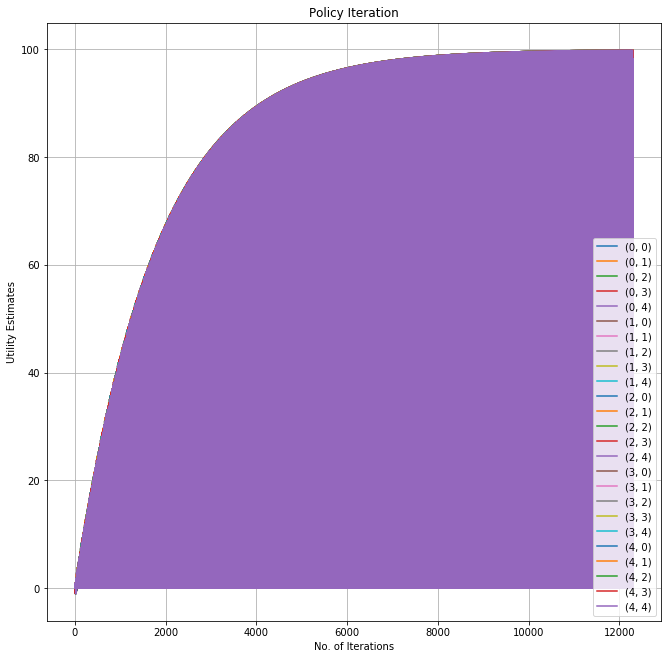

In [11]:
x = [i for i in range(num_iter)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='No. of Iterations', ylabel='Utility Estimates', title='Policy Iteration')
ax.grid()

fig.savefig("p2-e1-valueIter.png")
plt.show()

### Policy Iteration

In [12]:
SMALL_ENOUGH = 10e-4
GAMMA = 0.99
ALL_POSSIBLE_ACTIONS = ('U', 'D', 'L', 'R')

In [13]:
if __name__ == '__main__':
    
    grid = negative_grid()
    policy = {}
    
    for s in grid.actions.keys():
        policy[s] = np.random.choice(ALL_POSSIBLE_ACTIONS)
        
    hist = []
    
    V = {}
    states = grid.all_states()
    
    for s in states: 
        V[s] = 0
        
        if s in grid.actions:
            V[s] = 0
        
        else:
            V[s] = 0
            
    iter_no = 0
    
    while True:
        iter_no = iter_no + 1
        print("Iteration " + str(iter_no) + " :: ")
        
        # policy evaluation 
        while True:
            biggest_change = 0
            for s in states:
                old_v = V[s]
                
                if s in policy:
                    a = policy[s]
                    grid.set_state(s)
                    
                    try:
                        r = grid.move(a)
                    
                    except KeyError:
                        continue
                    
                    grid.set_state(s)
                    r = grid.rewards.get(grid.current_state(), 0)
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    grid.set_state(s)
                    
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    V[s] = v
                    biggest_change = max(biggest_change, np.abs(old_v - V[s]))
                    
            if biggest_change < SMALL_ENOUGH:
                break
        
        print('Utilities:')
        print_values(True, V, grid)
        print('\n')
        
        #policy improvement
        is_policy_converged = True
        
        for s in states:
            
            if s in policy:
                old_a = policy[s]
                new_a = None
                best_value = float('-inf')
                
                for a in ALL_POSSIBLE_ACTIONS:
                    grid.set_state(s)
                    
                    try:
                        r = grid.move(a)
                        
                    except KeyError:
                        continue
                    
                    grid.set_state(s)
                    r = grid.rewards.get(grid.current_state(), 0)
                    _ = grid.move(a)
                    v_correct = V[grid.current_state()]
                    grid.set_state(s)
                    
                    if a == 'U':
                        r_clockwise = grid.move('R')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('L')
                    
                    elif a == 'R':
                        r_clockwise = grid.move('D')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('U')
                    
                    elif a == 'D':
                        r_clockwise = grid.move('L')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('R')
                    
                    elif a == 'L':
                        r_clockwise = grid.move('U')
                        v_clockwise = V[grid.current_state()]
                        grid.set_state(s)
                        r_anticlockwise = grid.move('D')
                        
                    v_anticlockwise = V[grid.current_state()]  
                    v = r + GAMMA * (0.8*v_correct + 0.1*v_clockwise + 0.1*v_anticlockwise)
                    
                    if v > best_value:
                        best_value = v
                        new_a = a
            
            policy[s] = new_a
            
            if new_a != old_a:
                is_policy_converged = False
        
        if is_policy_converged:
            break
            
    print('Optimal Utilities:')
    print_values(True, V, grid)
    print('\n')
    print('Optimal Policy:')
    print_policy(policy, grid)
    print('\n')

Iteration 1 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.90168  |   0.00000  |   8.06682  |  -2.76096  |  -2.87685  | 
+----------+------------+------------+------------+------------+
 81.69225  |   9.71917  |  -1.21627  |  -4.08427  |   0.00000  | 
+----------+------------+------------+------------+------------+
 72.14672  |   3.47492  |  -2.18920  |  -5.75662  |  -4.46347  | 
+----------+------------+------------+------------+------------+
 59.82856  |  -4.30624  |  -5.28272  |  -6.38633  |  -4.66987  | 
+----------+------------+------------+------------+------------+
 53.96602  |   0.00000  |   0.00000  |   0.00000  |  -3.99607  | 
+----------+------------+------------+------------+------------+


Iteration 2 :: 
Utilities:
+----------+------------+------------+------------+------------+
 99.96216  |   0.00000  |  94.90078  |  93.61856  |  92.40115  | 
+----------+------------+------------+------------+------------+
 98.35595  |  95.84570  |  9

### Plot of utility estimates as a function of the number of iterations

In [14]:
num_iter = int(len(hist)/28)

In [15]:
hist_0_0 = []
hist_0_1 = []
hist_0_2 = []
hist_0_3 = [] 
hist_0_4 = []  

hist_1_0 = []
hist_1_1 = [] 
hist_1_2 = []
hist_1_3 = [] 
hist_1_4 = []  

hist_2_0 = []
hist_2_1 = []
hist_2_2 = []
hist_2_3 = []
hist_2_4 = []

hist_3_0 = []
hist_3_1 = []
hist_3_2 = []
hist_3_3 = []
hist_3_4 = []

hist_4_0 = []
hist_4_1 = []
hist_4_2 = []
hist_4_3 = []
hist_4_4 = []

for i in range(num_iter):
    hist_0_0.append(hist[0+i*28])
    hist_1_0.append(hist[1+i*28])
    hist_2_0.append(hist[2+i*28])
    hist_3_0.append(hist[3+i*28]) 
    hist_4_0.append(hist[4+i*28])

    hist_0_1.append(hist[5+i*28])
    hist_1_1.append(hist[6+i*28]) 
    hist_2_1.append(hist[7+i*28]) 
    hist_3_1.append(hist[8+i*28]) 
    hist_4_1.append(hist[9+i*28]) 
    
    hist_0_2.append(hist[10+i*28])
    hist_1_2.append(hist[11+i*28]) 
    hist_2_2.append(hist[12+i*28])
    hist_3_2.append(hist[13+i*28])
    hist_4_2.append(hist[14+i*28])
    
    hist_0_3.append(hist[15+i*28])
    hist_1_3.append(hist[16+i*28]) 
    hist_2_3.append(hist[20+i*28])
    hist_3_3.append(hist[21+i*28])
    hist_4_3.append(hist[22+i*28])
    
    hist_0_4.append(hist[23+i*28])
    hist_1_4.append(hist[24+i*28]) 
    hist_2_4.append(hist[25+i*28])
    hist_3_4.append(hist[26+i*28])
    hist_4_4.append(hist[27+i*28])

In [16]:
list_of_tuples = [str((i,j)) for i in range(5) for j in range (5)]

In [17]:
from matplotlib.pyplot import figure

plt.rcParams["figure.figsize"]=11,11

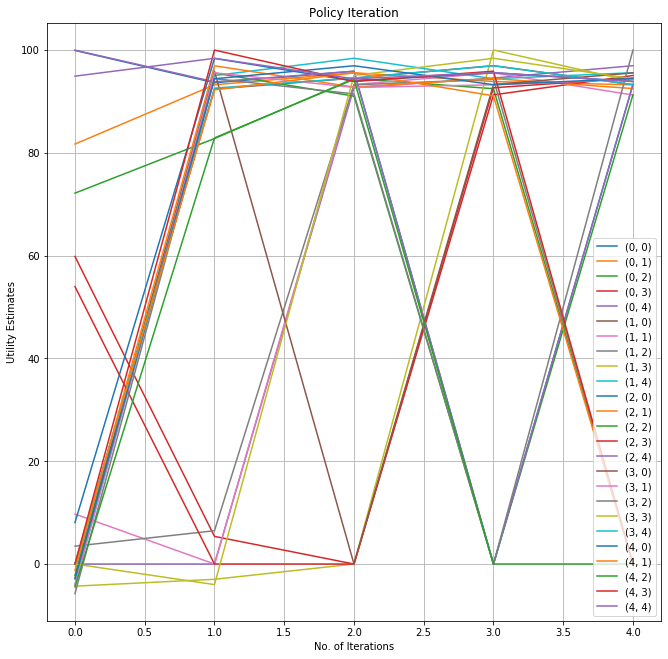

In [18]:
x = [i for i in range(num_iter)]

fig, ax = plt.subplots()
ax.plot(x, hist_0_0)
ax.plot(x, hist_0_1)
ax.plot(x, hist_0_2)
ax.plot(x, hist_0_3)
ax.plot(x, hist_0_4)

ax.plot(x, hist_1_0)
ax.plot(x, hist_1_1)
ax.plot(x, hist_1_2)
ax.plot(x, hist_1_3)
ax.plot(x, hist_1_4)

ax.plot(x, hist_2_0)
ax.plot(x, hist_2_1)
ax.plot(x, hist_2_2)
ax.plot(x, hist_2_3)
ax.plot(x, hist_2_4)

ax.plot(x, hist_3_0)
ax.plot(x, hist_3_1)
ax.plot(x, hist_3_2)
ax.plot(x, hist_3_3)
ax.plot(x, hist_3_4)

ax.plot(x, hist_4_0)
ax.plot(x, hist_4_1)
ax.plot(x, hist_4_2)
ax.plot(x, hist_4_3)
ax.plot(x, hist_4_4)

plt.legend(list_of_tuples, loc ="lower right")

ax.set(xlabel='No. of Iterations', ylabel='Utility Estimates', title='Policy Iteration')
ax.grid()

fig.savefig("p2-e1-policyIter.png")
plt.show()